Copyright 2021 Takehiro Ajioka

### Enviroment

Python 3.6
Anaconda
tensorflow-gpu==1.15.0
keras==2.3.1
shap==0.36.0
tfdeterminism==0.3.0

In [1]:
import numpy
import pandas
import matplotlib.pyplot as plt
from scipy import io
from tensorflow.keras import layers, losses, optimizers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import LSTM, GRU, SimpleRNN, ConvLSTM2D, Bidirectional
from sklearn.metrics import roc_curve
from sklearn.metrics import auc, roc_auc_score

In [2]:
# Allow grouth option of GPU
import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)

In [3]:
# Load data
signal = io.loadmat('../data/signal_5mice.mat')
runrest = io.loadmat('../data/runrest_5mice.mat')

In [4]:
plt.rcParams["font.size"] = 18

# Preprocess

In [5]:
# Mini-max normalization
def mini_max(dataset):
    min_value = dataset.min(axis=0)
    max_value = dataset.max(axis=0)
    dataset_nor = (dataset - min_value) / (max_value - min_value)
    return dataset_nor

In [6]:
# Create input data [-n,n+1]
def create_dataset(dataset, look_frame, shift_frame):
    dataX, dataY = [], []
    for i in range(max(0,look_frame-shift_frame), min(len(dataset), len(dataset) - look_frame - shift_frame)):
        xset = []
        for j in range(dataset.shape[1]-1):
            a = dataset[(shift_frame+i-look_frame):(shift_frame+i+look_frame+1), j]
            xset.append(a)
        dataY.append(dataset[i, -1])      
        dataX.append(xset)
    return numpy.array(dataX), numpy.array(dataY)

In [7]:
# a = range(1000)
# d = numpy.array([a,a,a,a,a]).transpose()
# e = create_dataset(d, 20, -10)
# e

In [8]:
look_frame = 15 #read the previous and next n frames as input

def Data_preprocess(signal, runrest, shift_frame):
    # Normalize
    signal = mini_max(signal.transpose())
    runrest = runrest.transpose()
    # Create dataset
    dataset = numpy.hstack([signal.astype('float32'), runrest.astype('float32')])
    X, Y = create_dataset(dataset, look_frame, shift_frame)
    return X, Y

In [9]:
def Get_Dataset(TRAIN, VALID, shift_frame):
    
    # Training dataset
    print('TRAINING')
    trainX = numpy.empty([0,50,2*look_frame+1], dtype=numpy.float32)
    trainY = numpy.empty(0, dtype=numpy.float32)
    for i in TRAIN:
        print(f'Mouse {i}')
        for j in range(signal['signal'+str(i)].shape[1]):
            X, Y = Data_preprocess(signal['signal'+str(i)][0,j], runrest['runrest'+str(i)][0,j], shift_frame)
            trainX = numpy.concatenate([trainX, X], axis=0)
            trainY = numpy.concatenate([trainY, Y], axis=0)

    # Validation dataset
    print('VALIDATION')
    validX = numpy.empty([0,50,2*look_frame+1], dtype=numpy.float32)
    validY =numpy.empty(0, dtype=numpy.float32)
    for i in VALID:
        print(f'Mouse {i}')
        for j in range(signal['signal'+str(i)].shape[1]):
            X, Y = Data_preprocess(signal['signal'+str(i)][0,j], runrest['runrest'+str(i)][0,j], shift_frame)
            validX = numpy.concatenate([validX, X], axis=0)
            validY = numpy.concatenate([validY, Y], axis=0)

    return trainX, validX, trainY, validY

# Training

In [10]:
from Training_code_behavior import Learn_model

In [11]:
WinShift = [-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60]
ModelType = 'GRU'
folder = './models_N20_WindowShift/'

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-60


Using TensorFlow backend.
TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


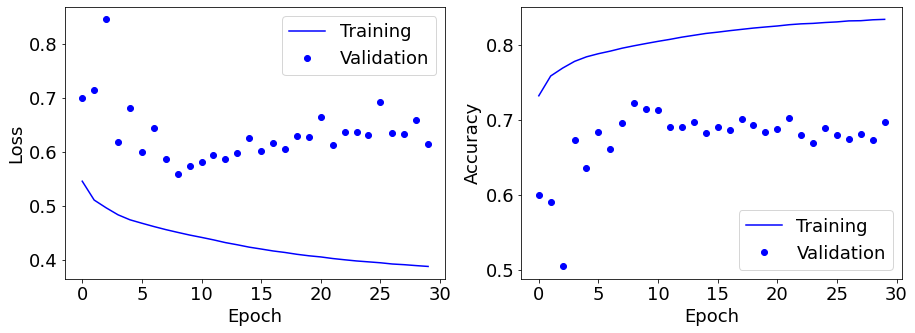

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


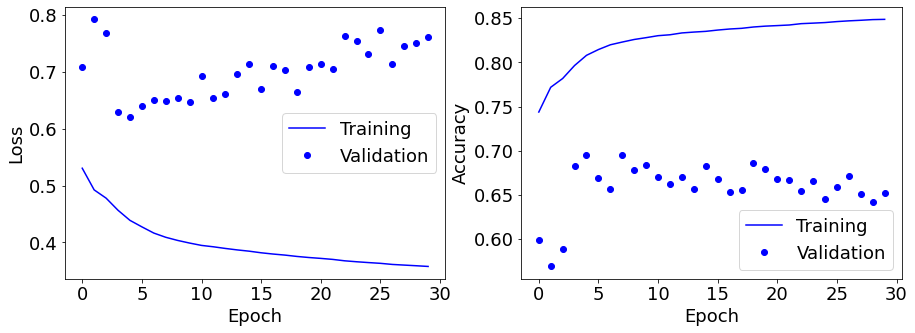

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


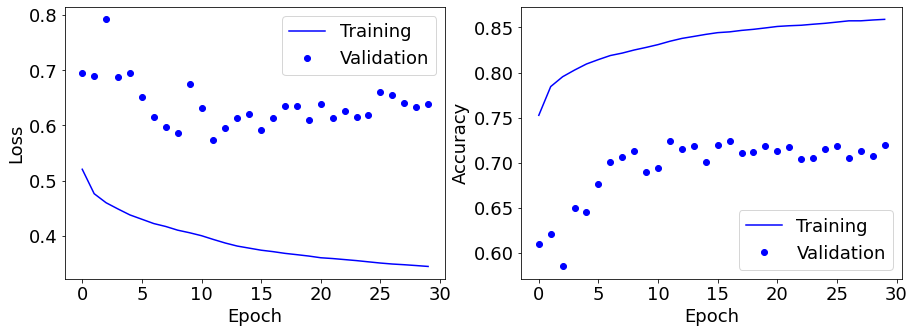

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


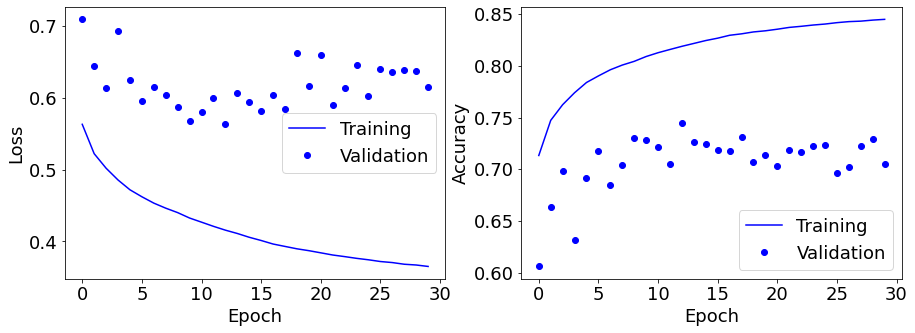

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


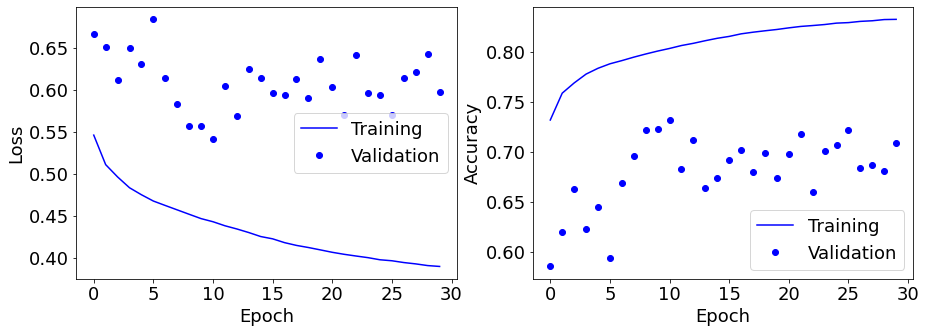

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


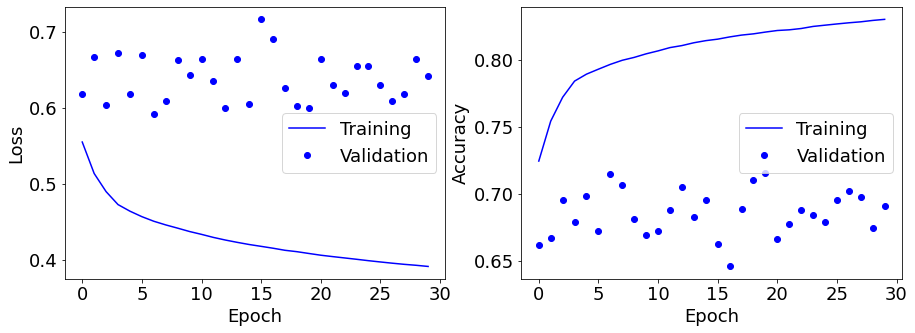

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


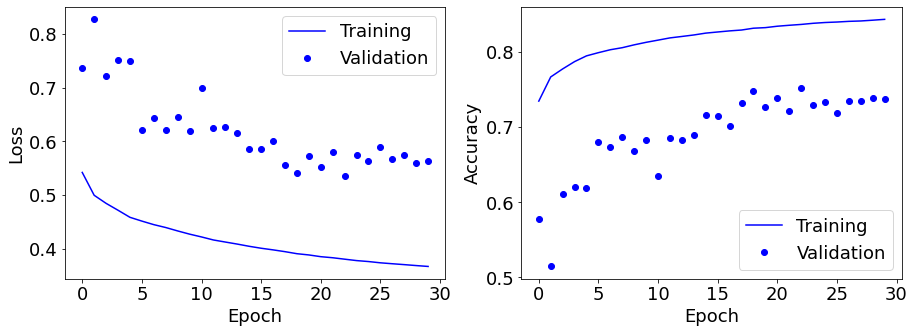

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


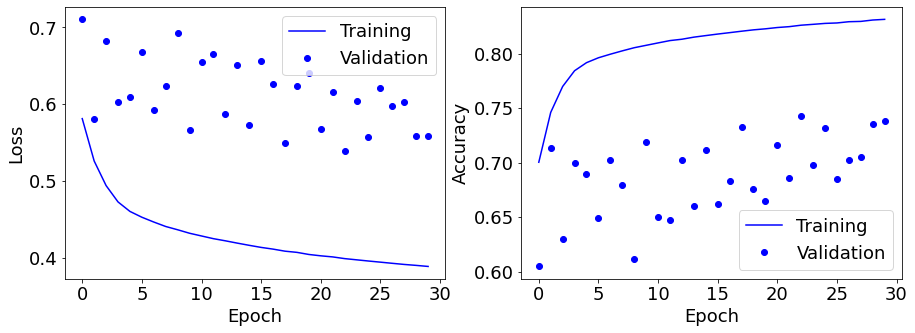

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


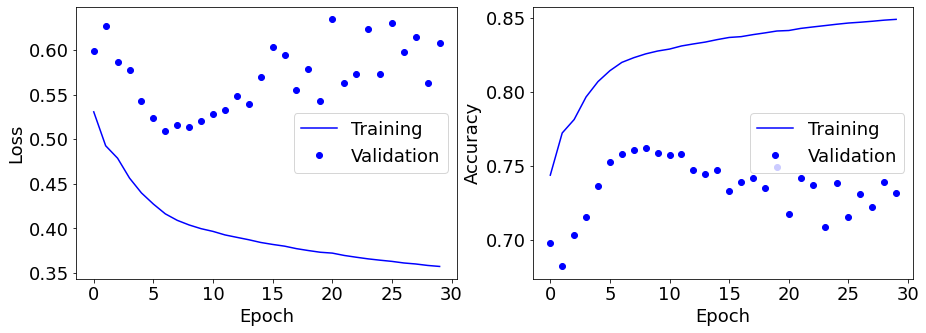

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


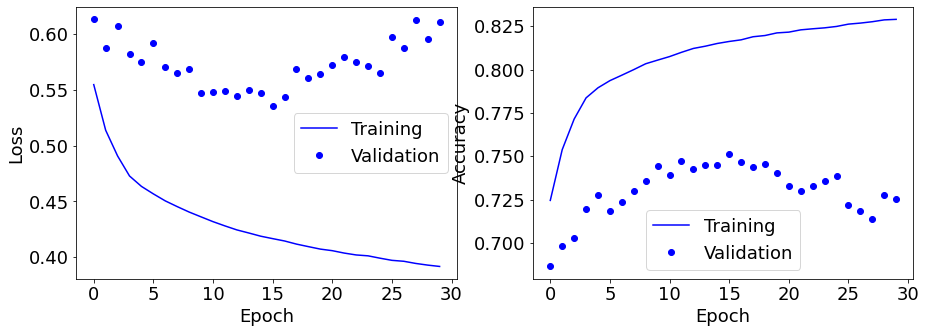

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


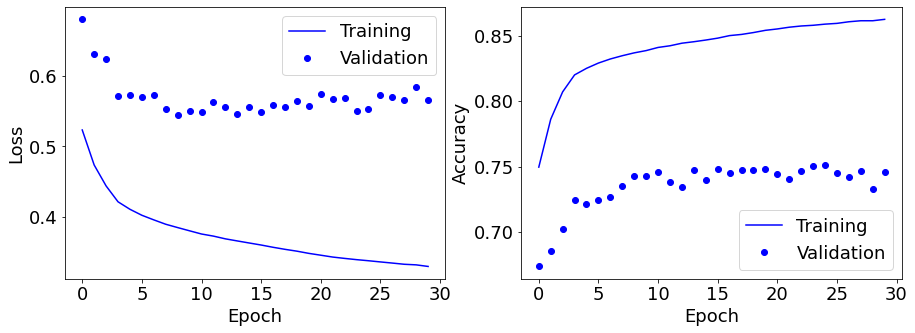

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


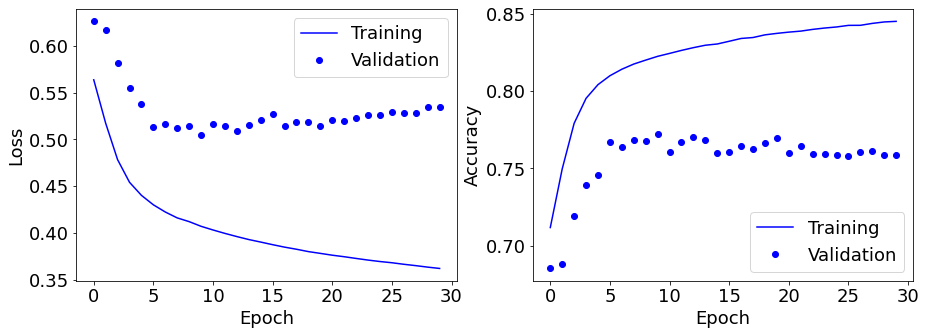

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


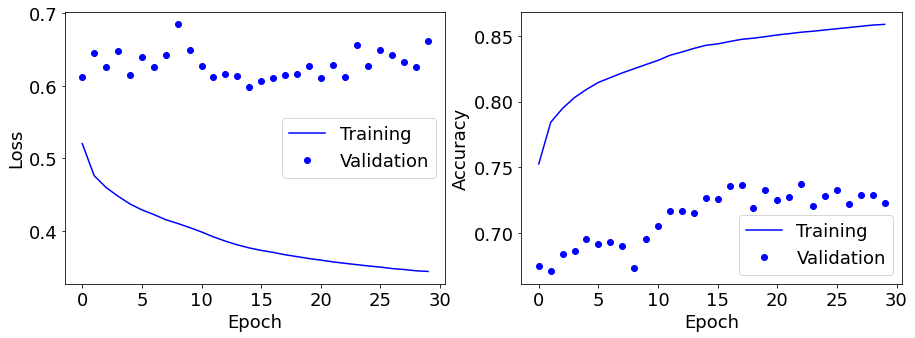

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


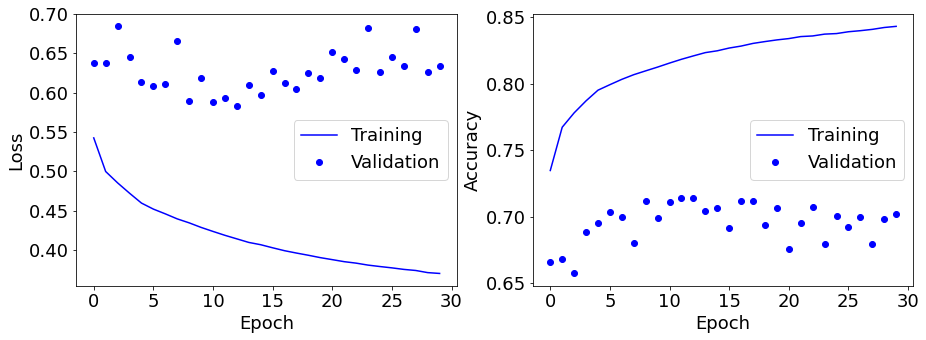

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


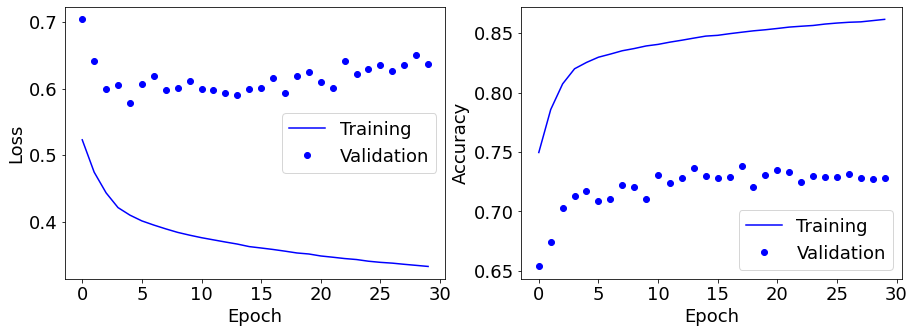

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


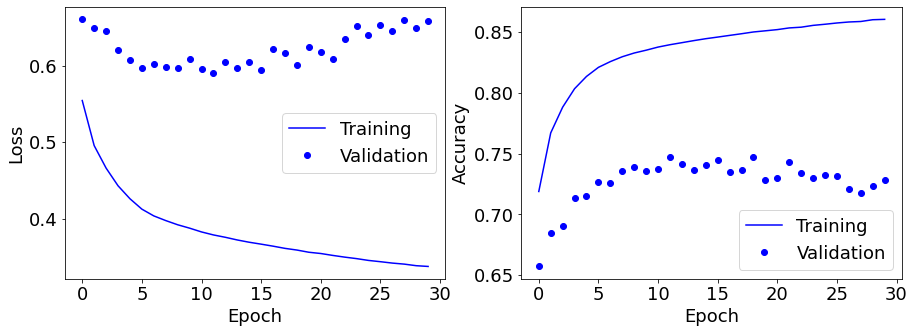

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


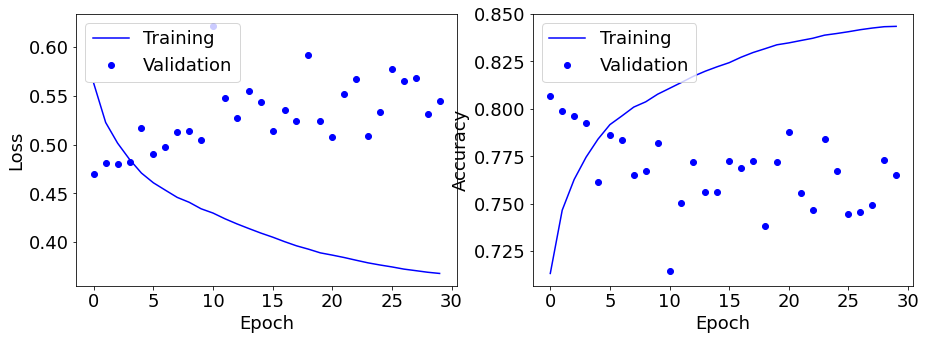

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


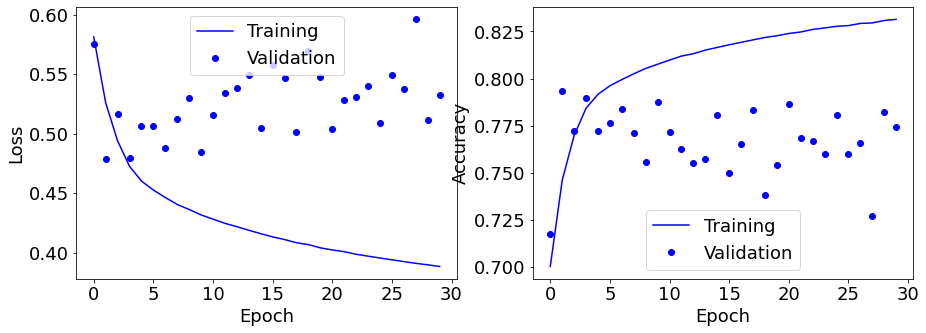

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


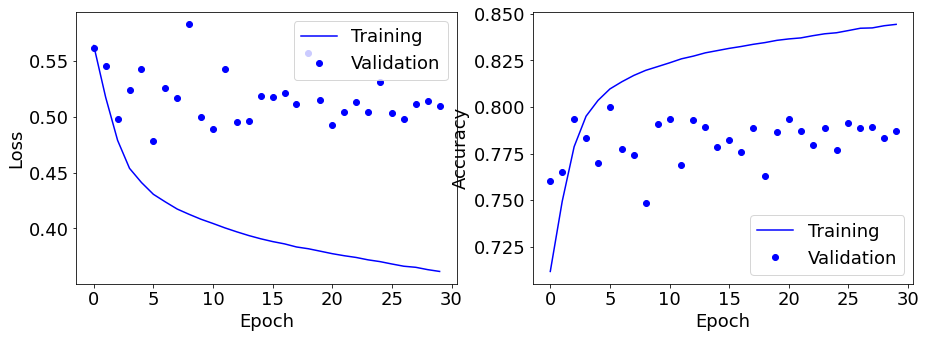

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
-60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


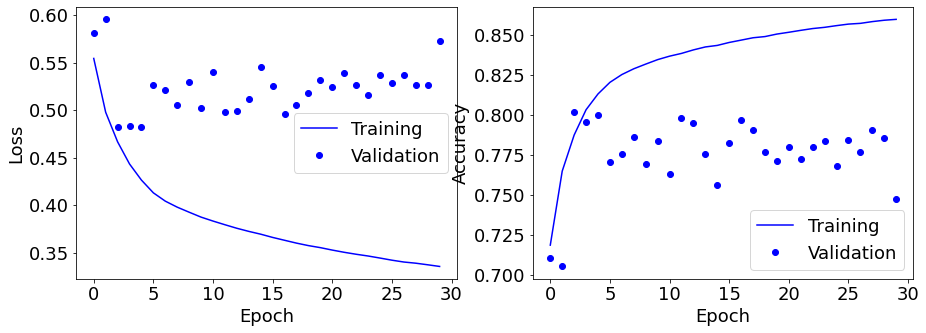

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


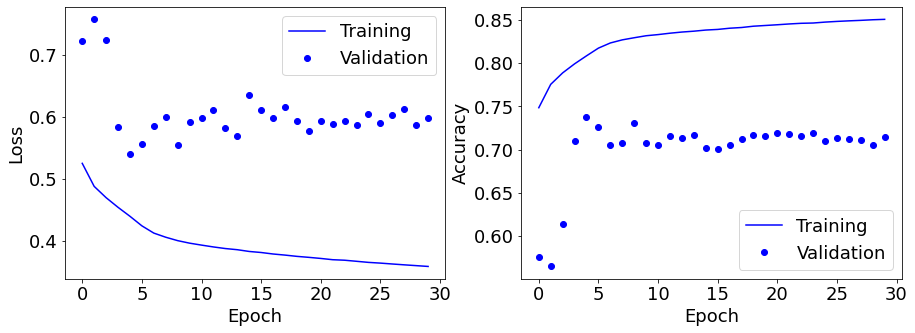

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


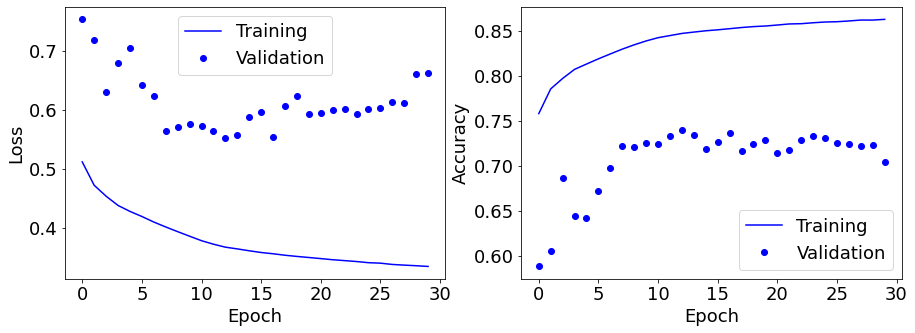

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


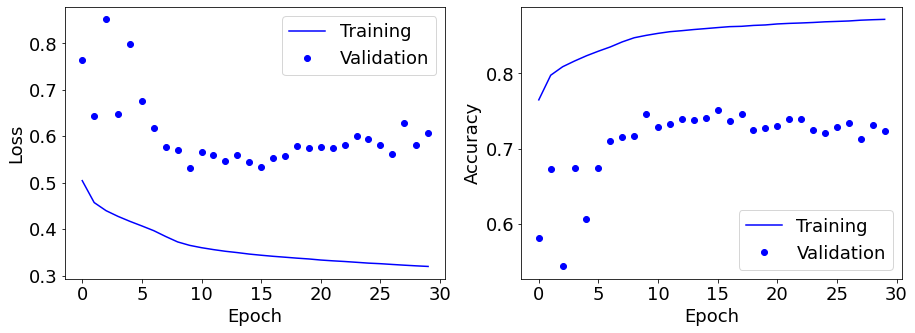

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


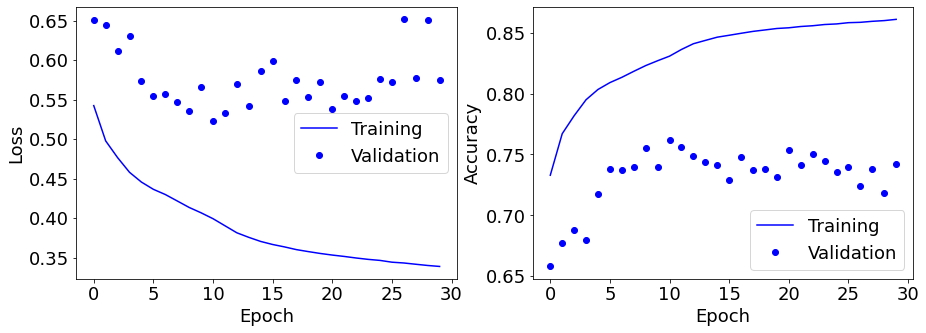

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


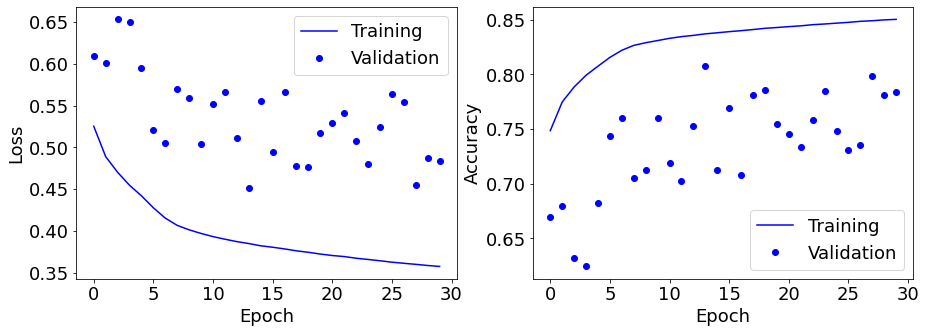

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


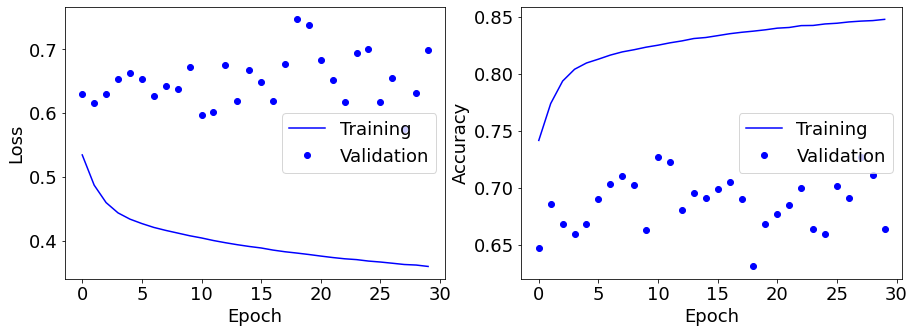

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


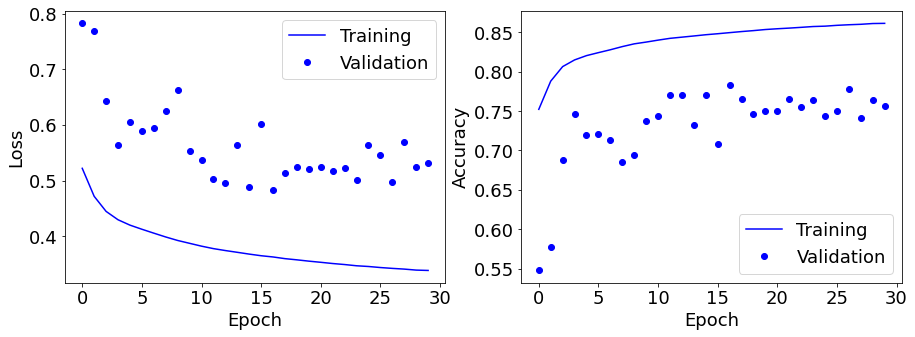

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


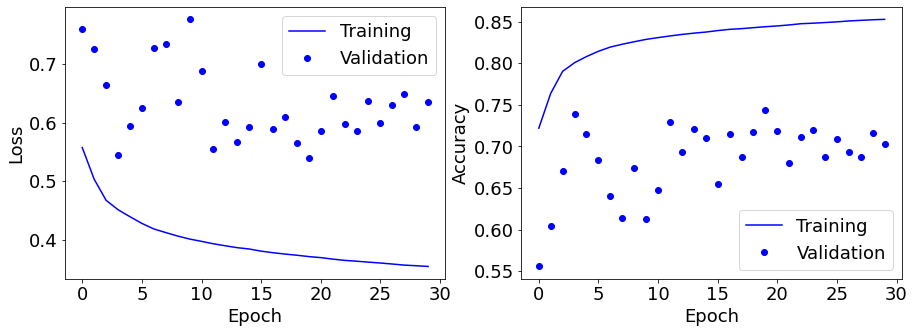

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


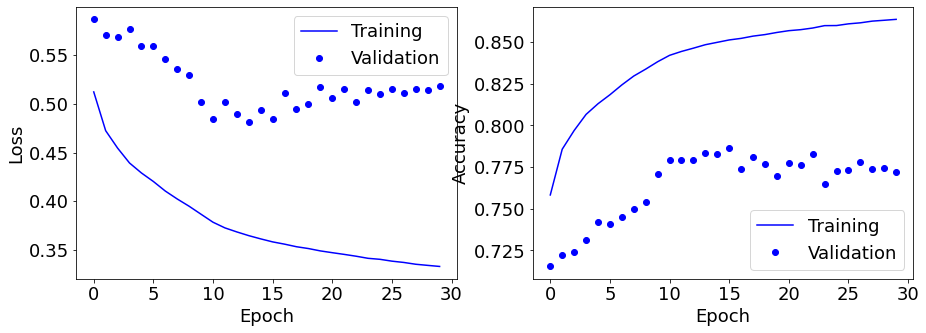

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


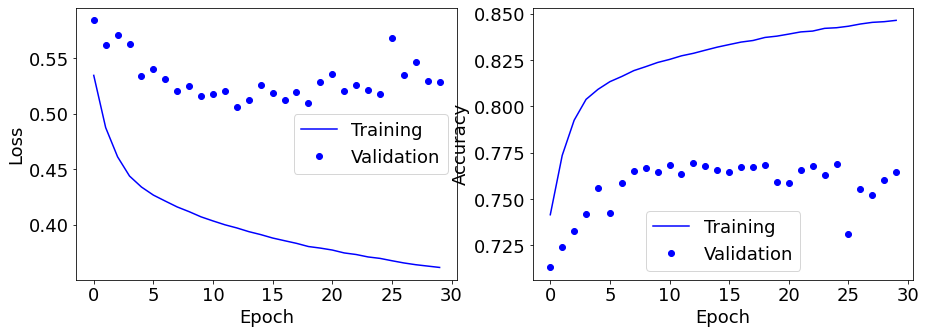

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


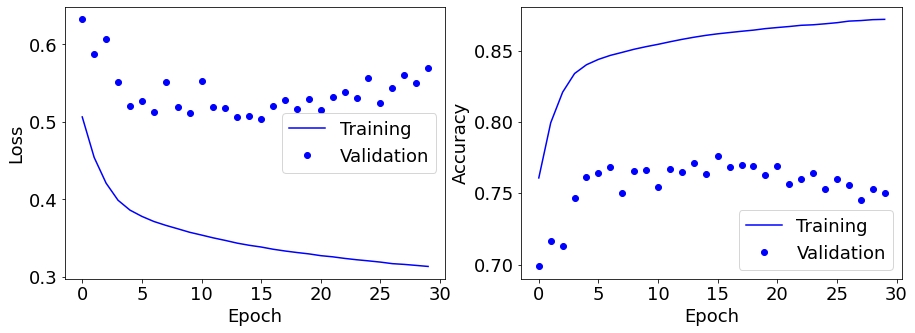

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


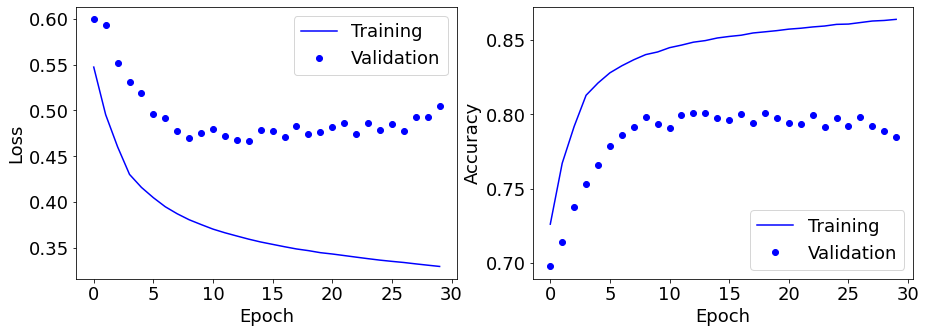

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


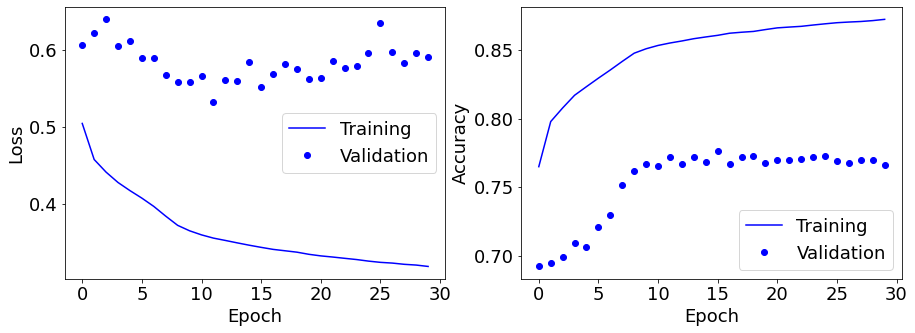

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


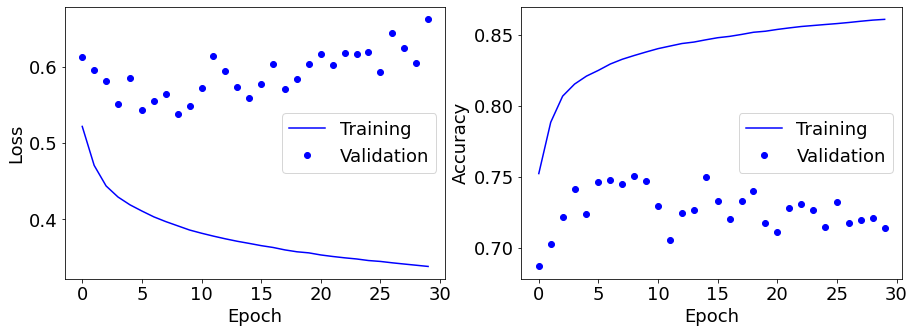

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


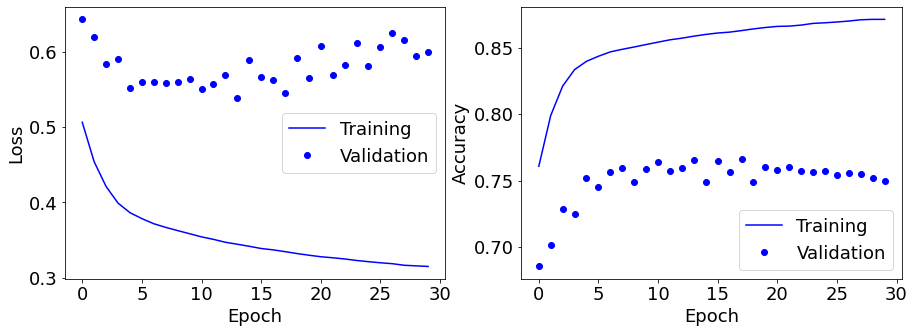

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


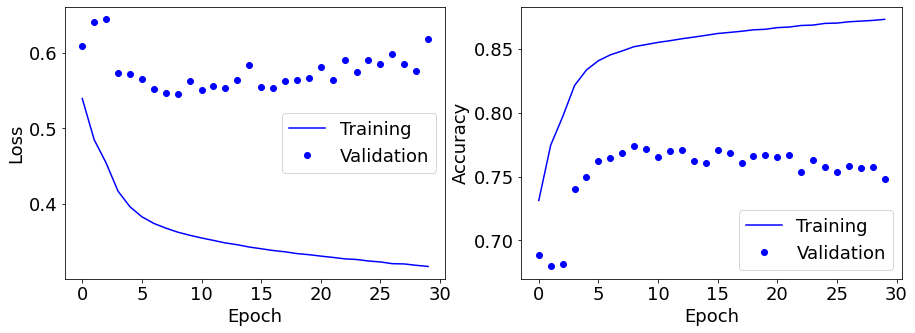

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


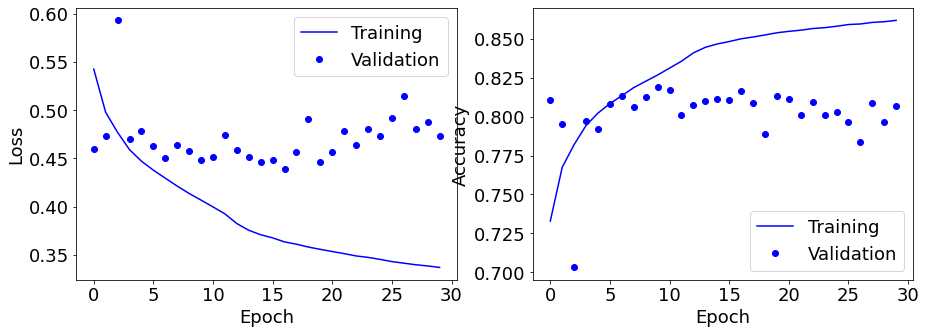

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


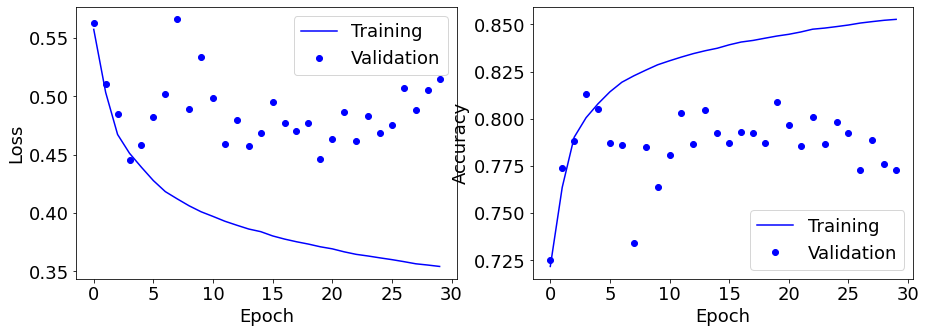

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


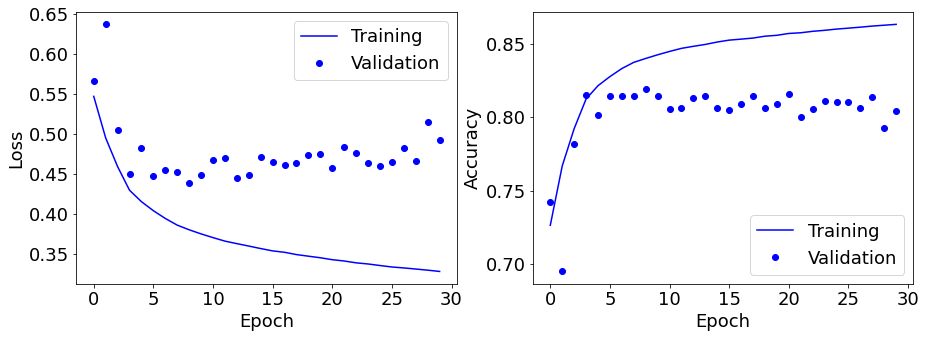

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
-50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


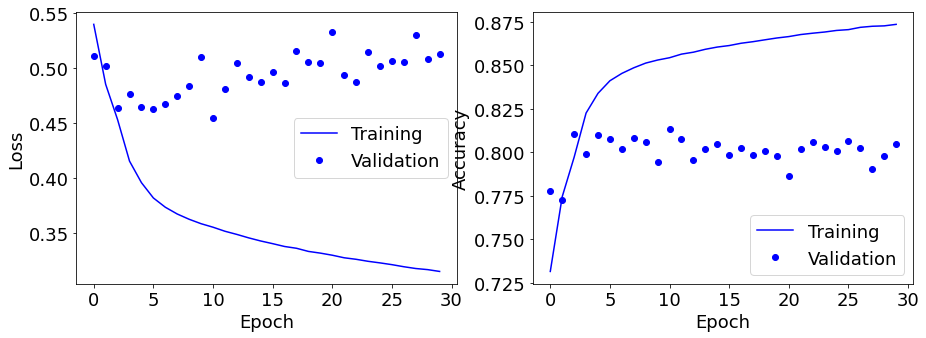

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


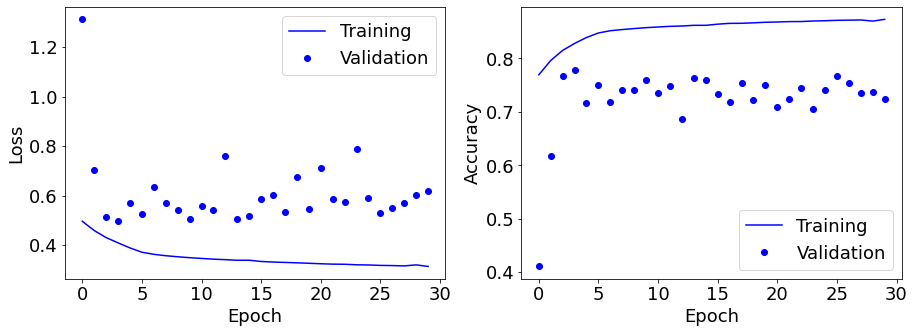

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


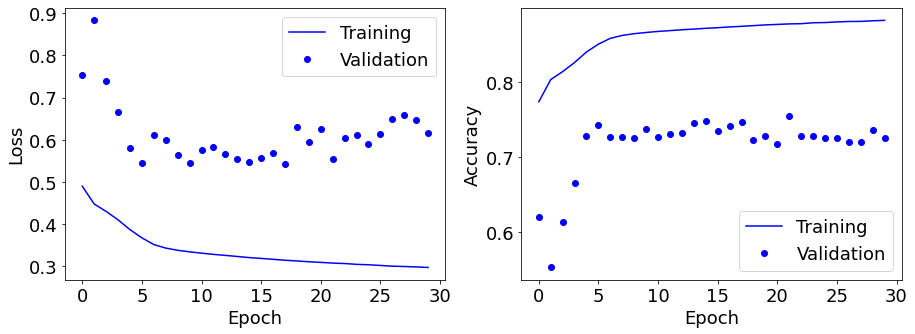

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


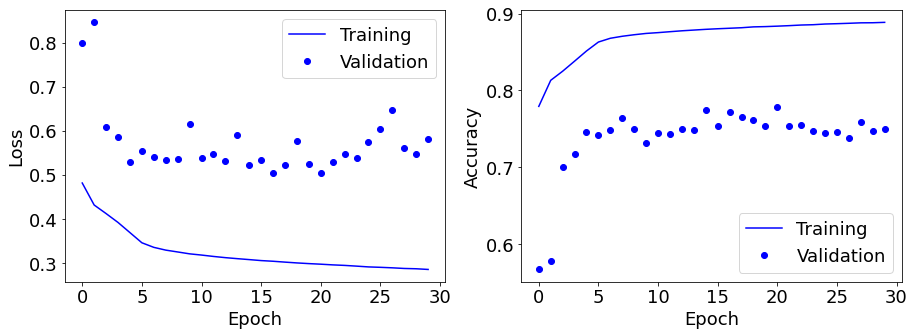

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


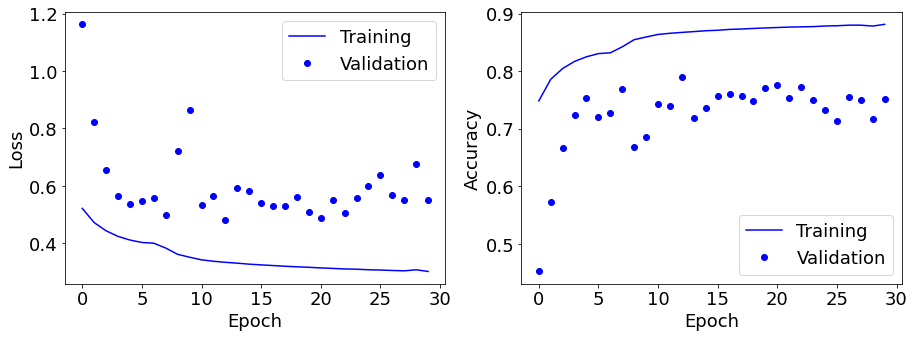

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


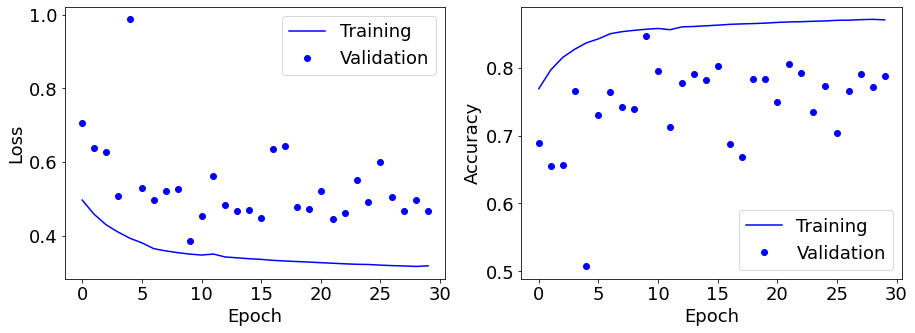

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


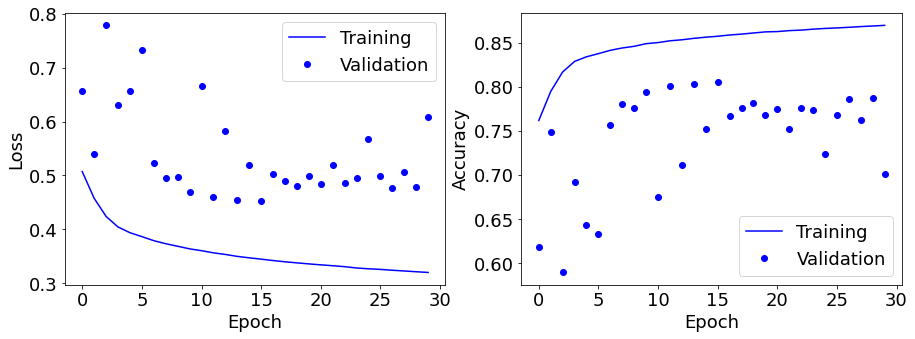

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


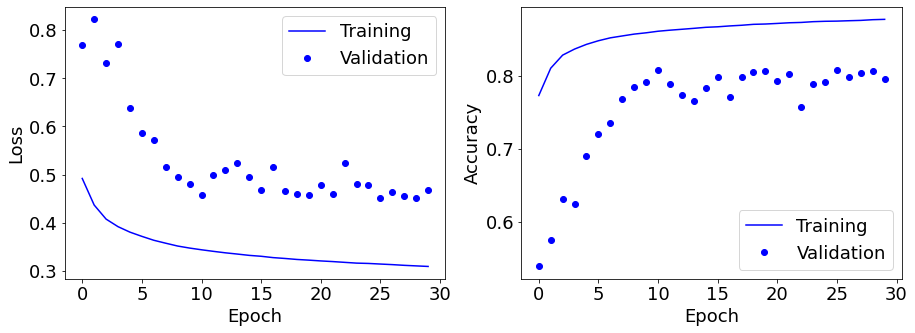

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


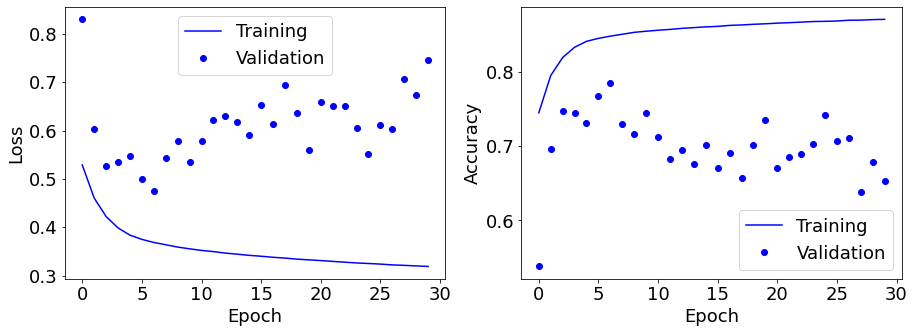

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


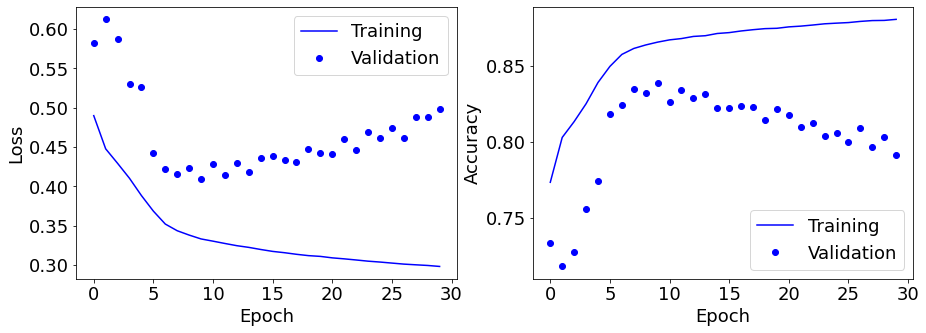

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


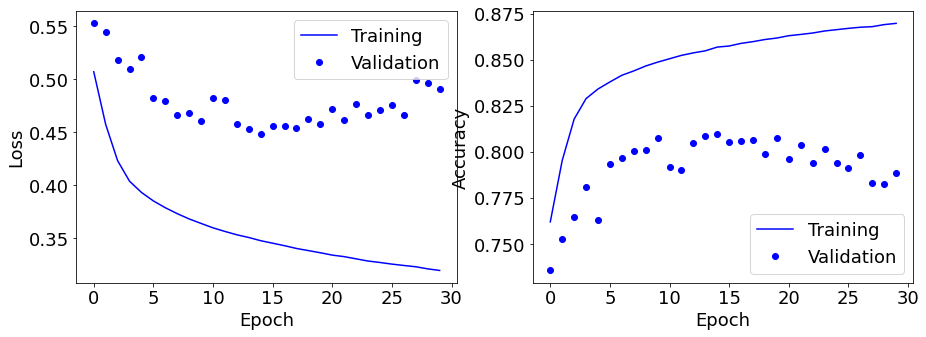

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


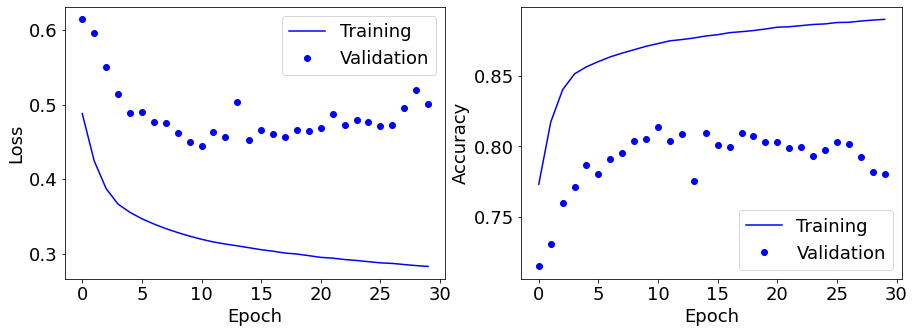

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


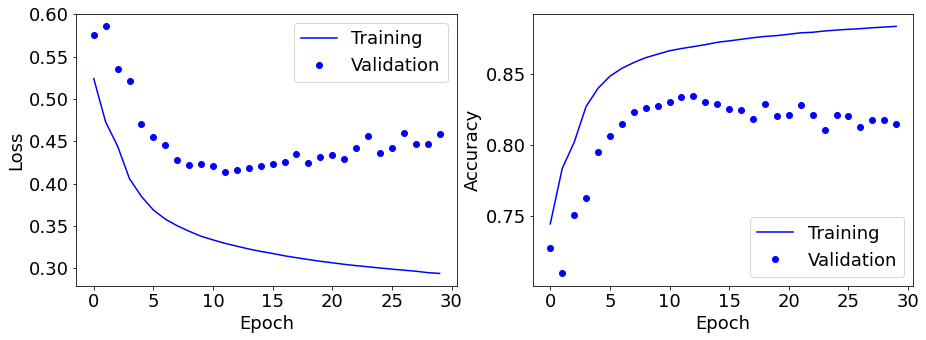

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


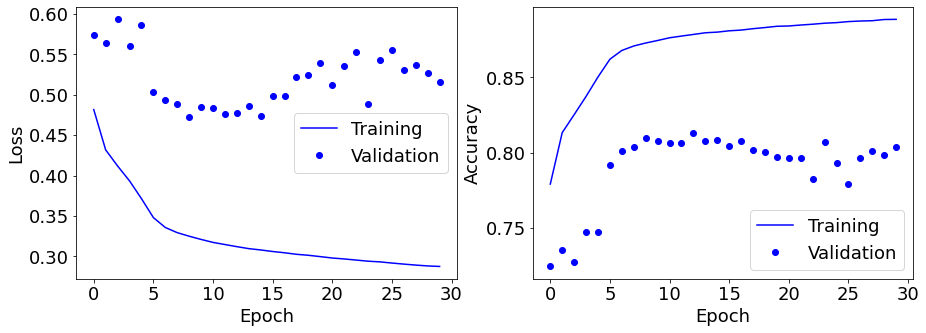

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


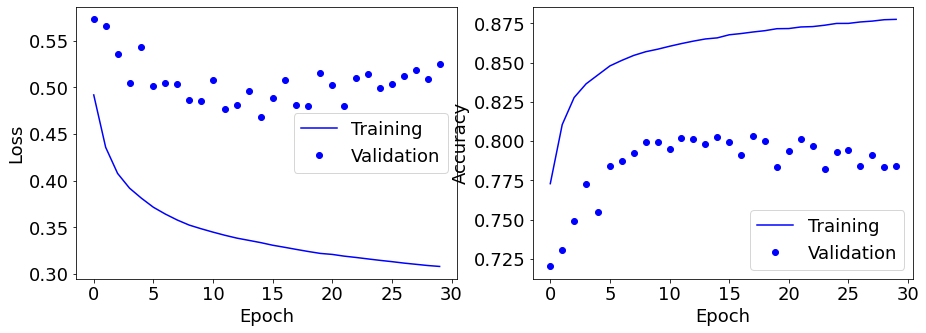

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


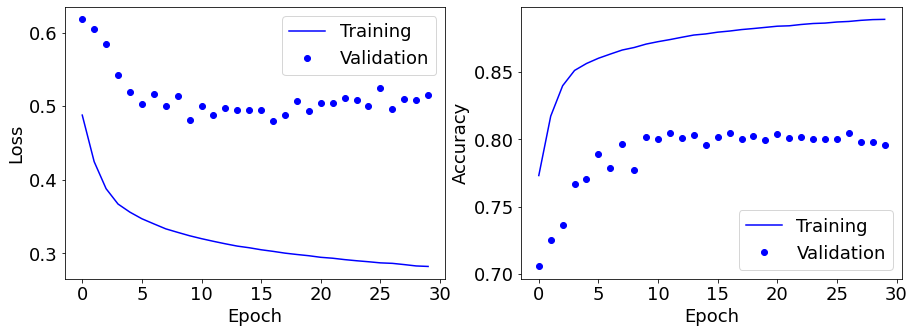

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


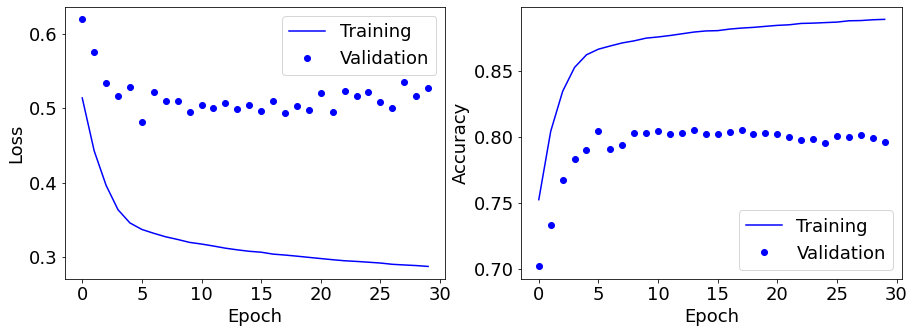

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


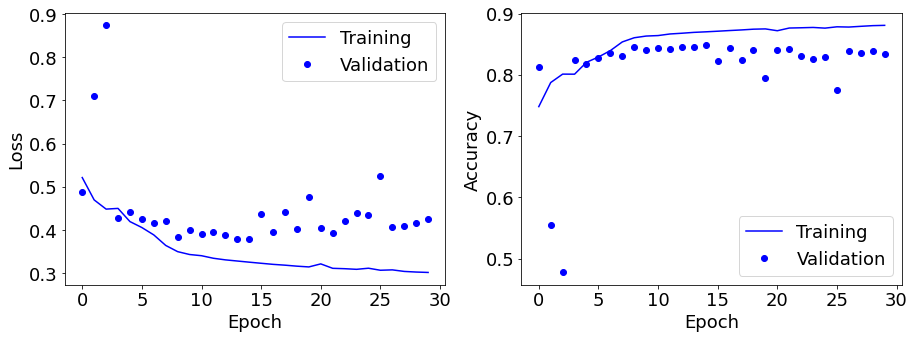

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


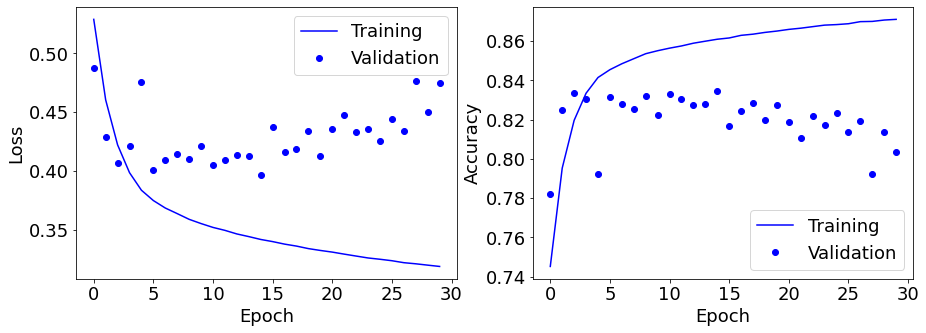

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


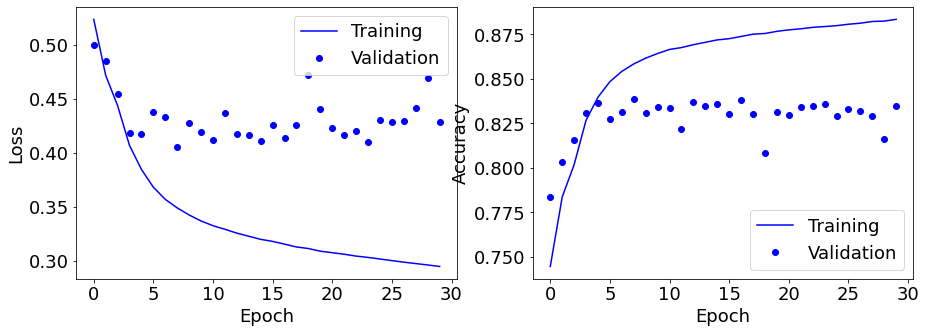

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
-40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


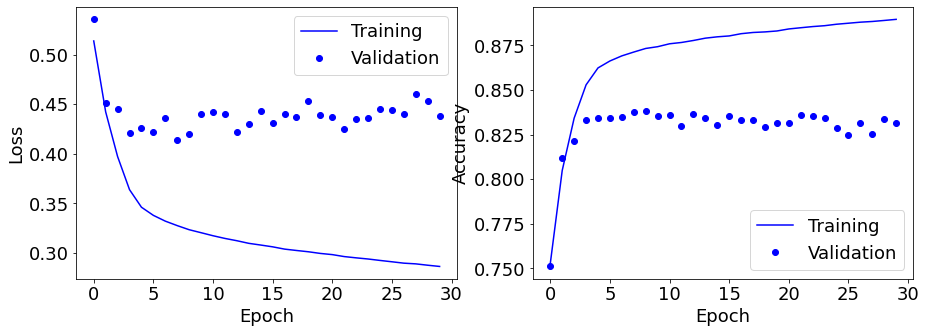

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


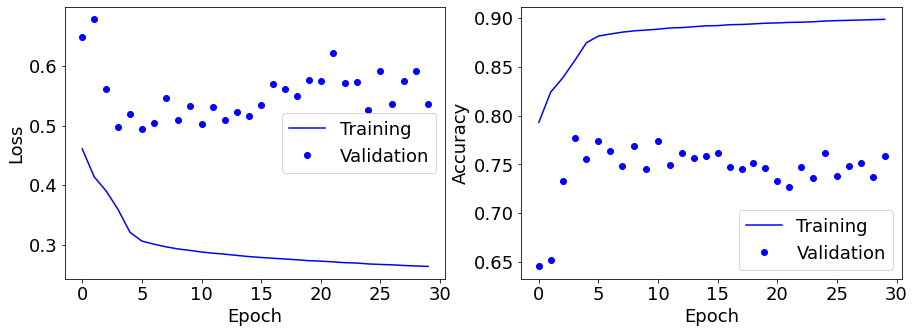

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


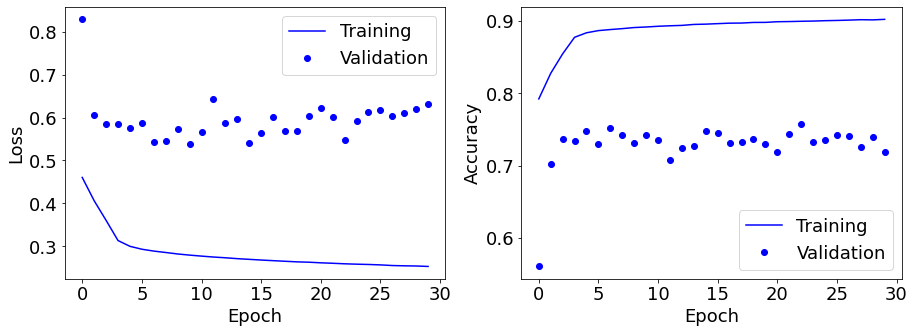

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


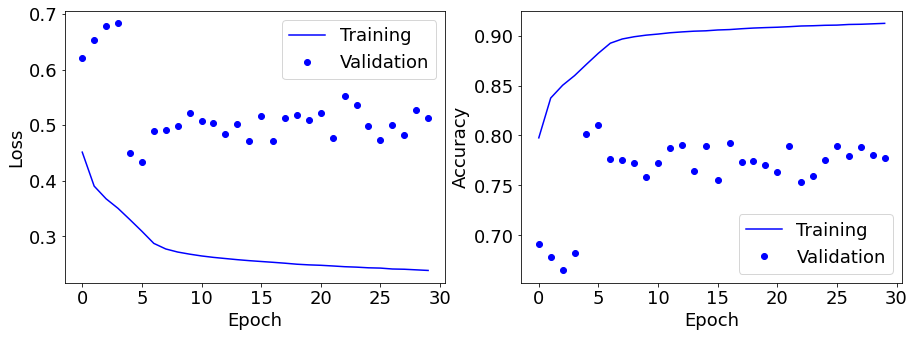

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


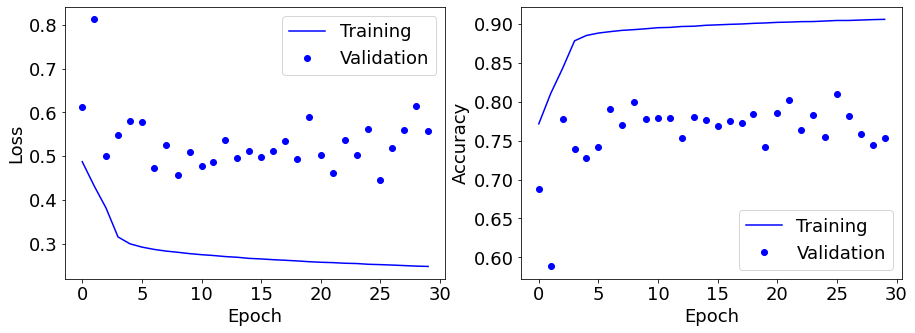

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


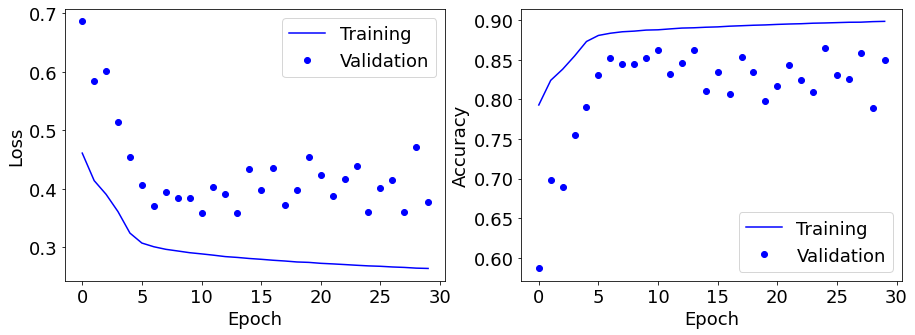

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


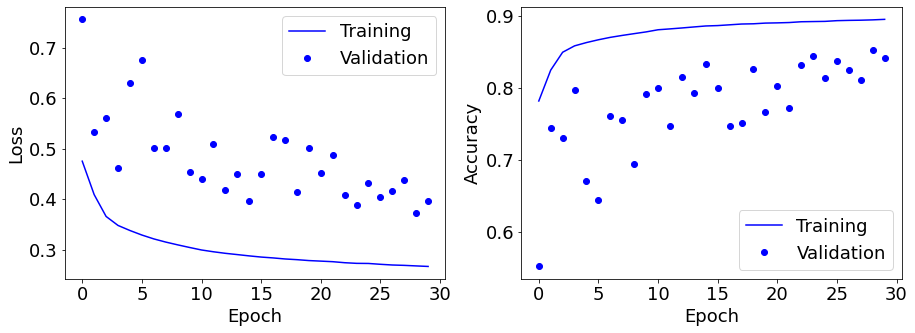

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


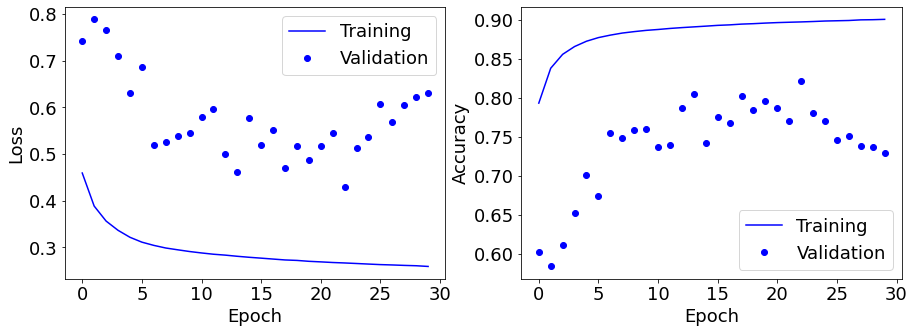

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


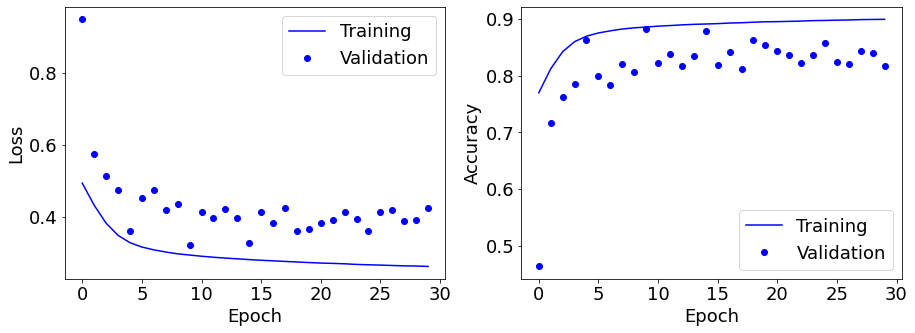

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


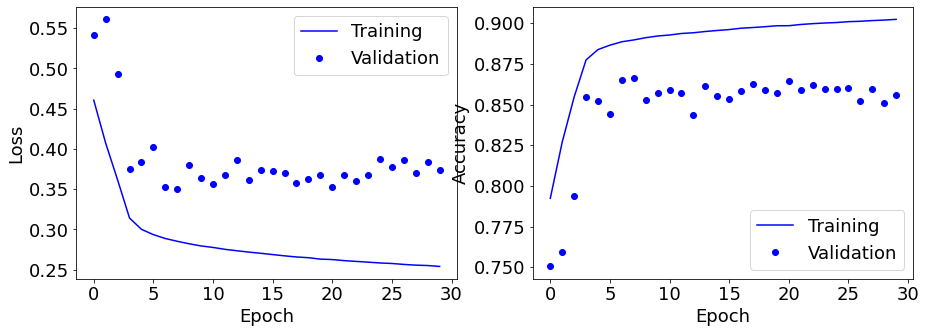

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


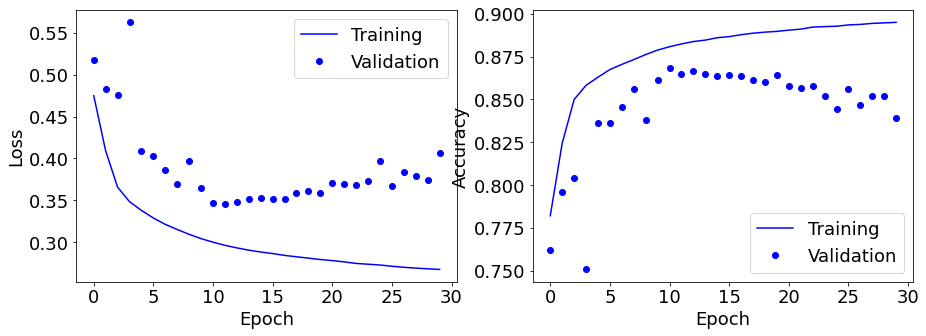

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


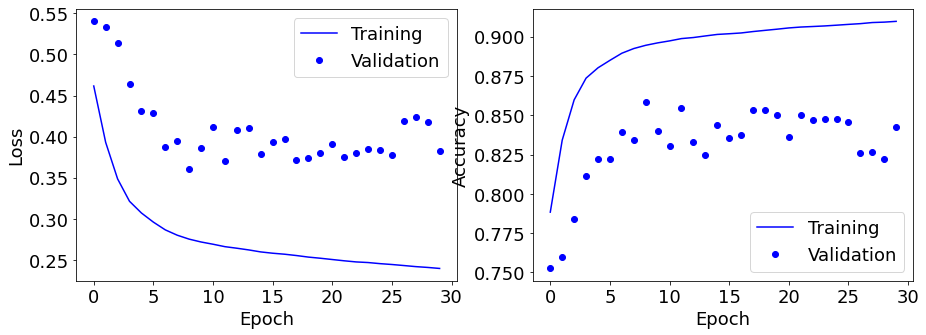

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


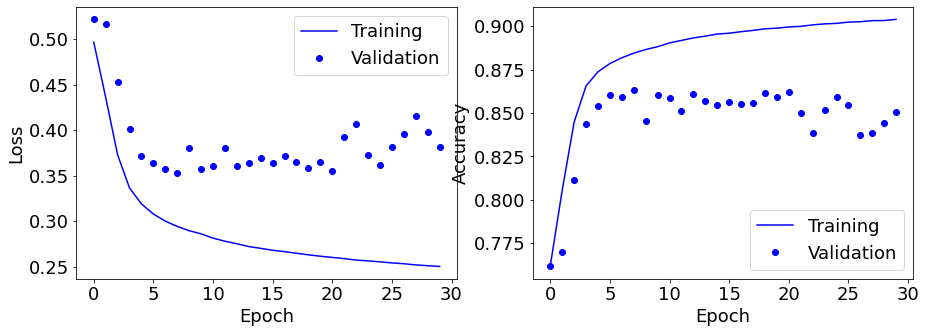

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


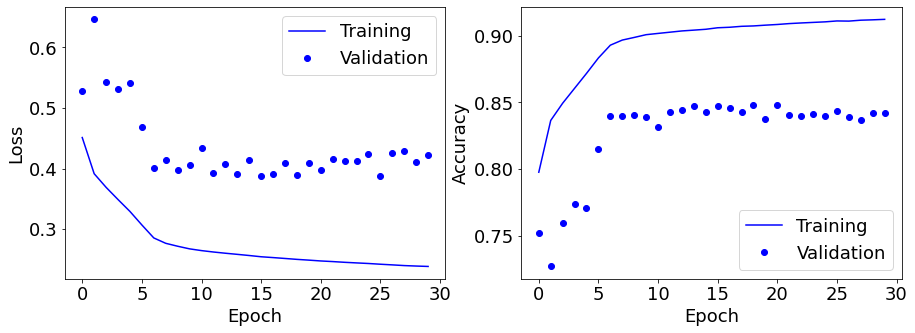

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


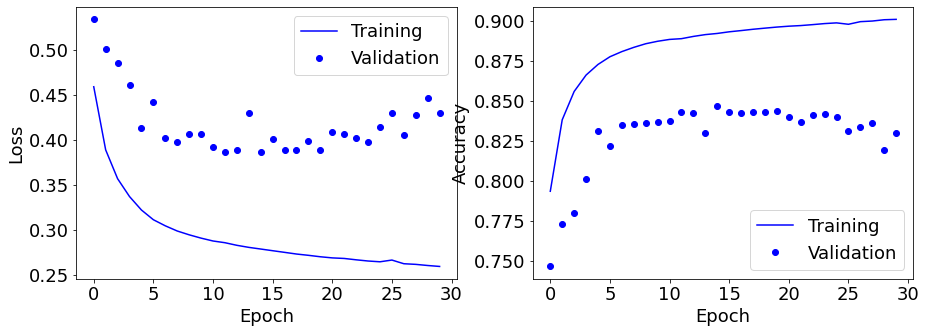

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


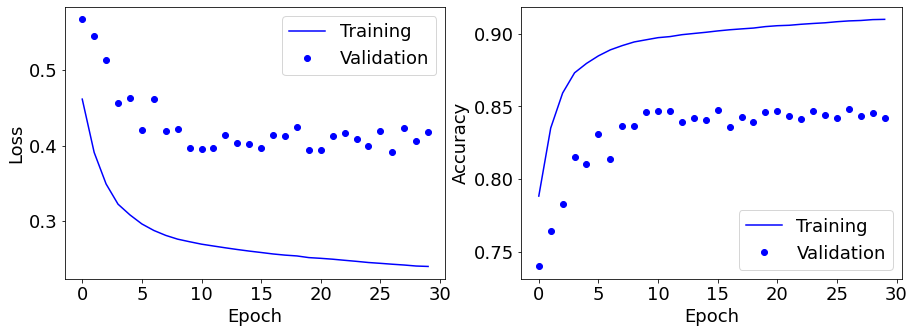

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


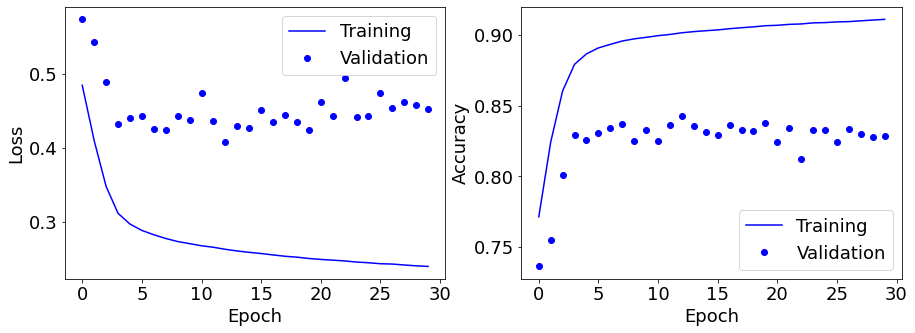

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


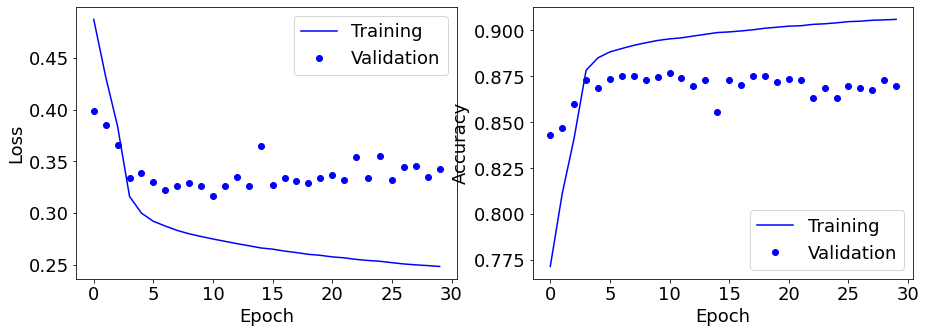

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


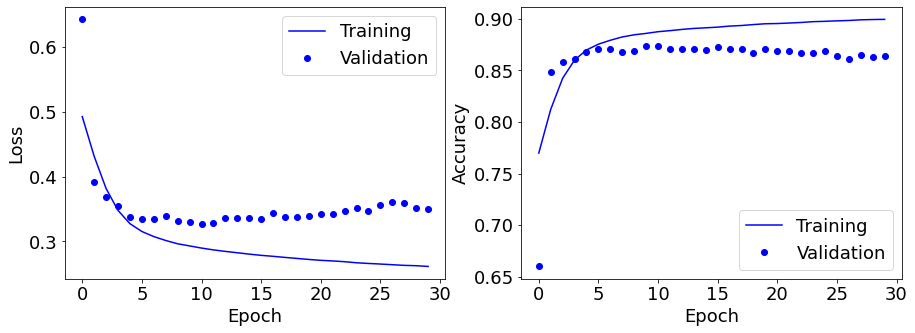

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


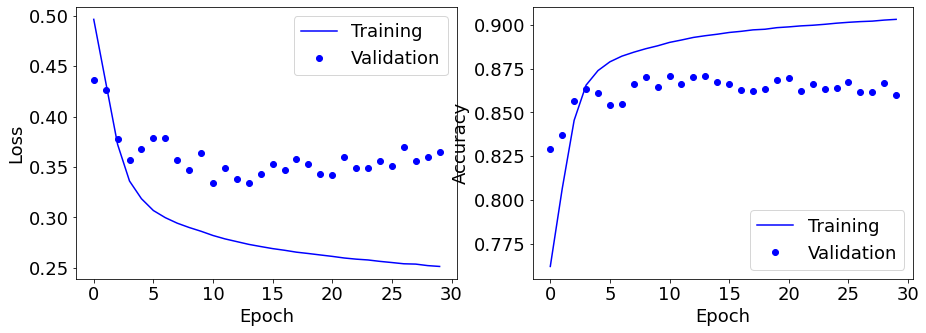

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
-30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


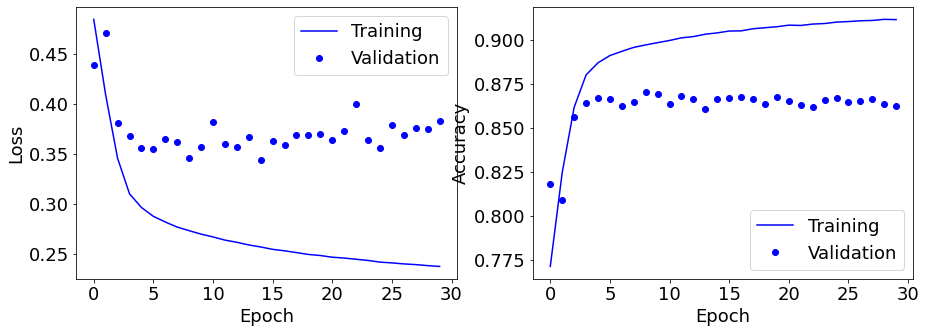

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


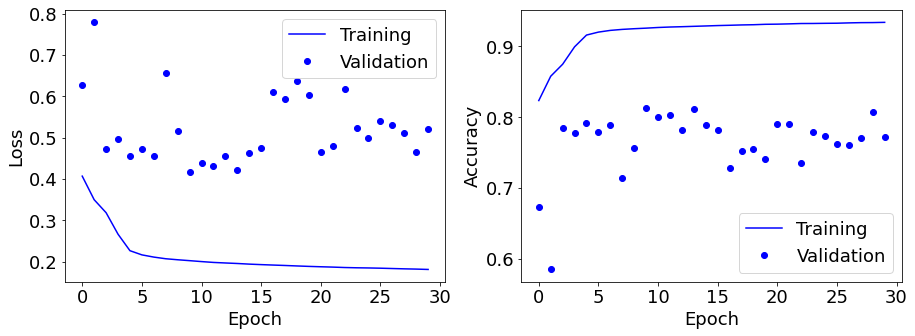

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


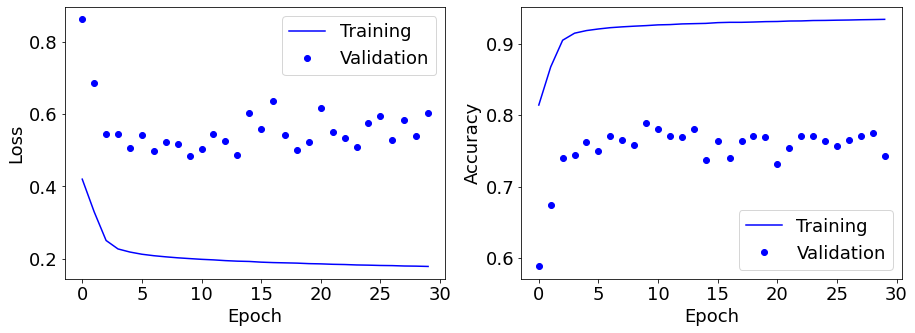

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


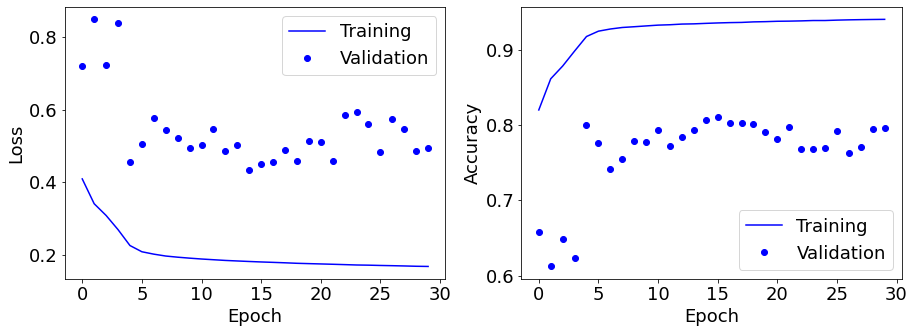

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


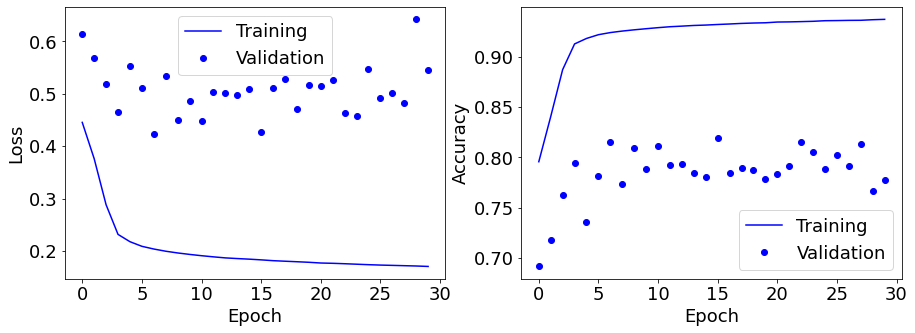

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


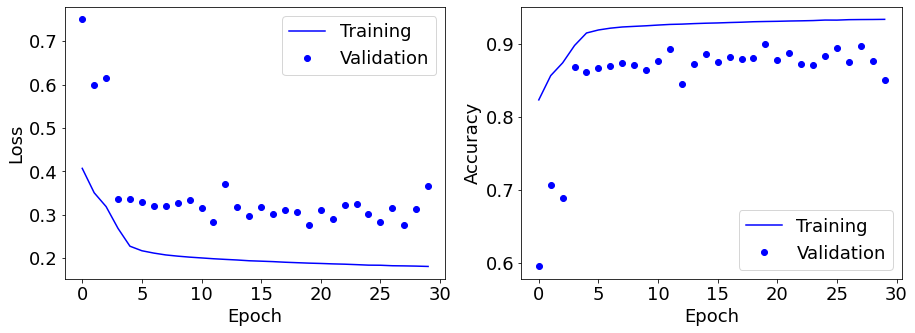

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


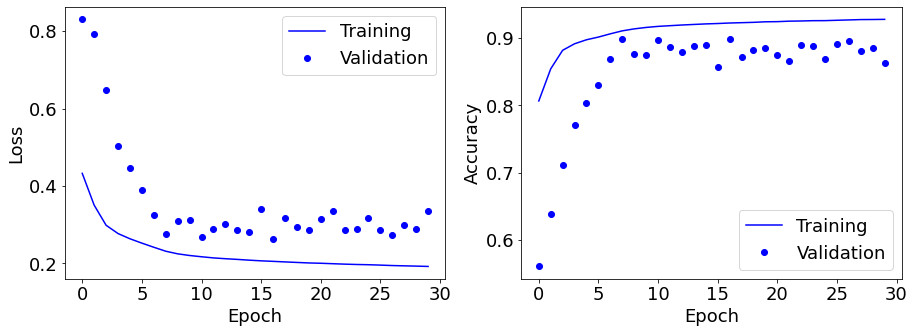

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


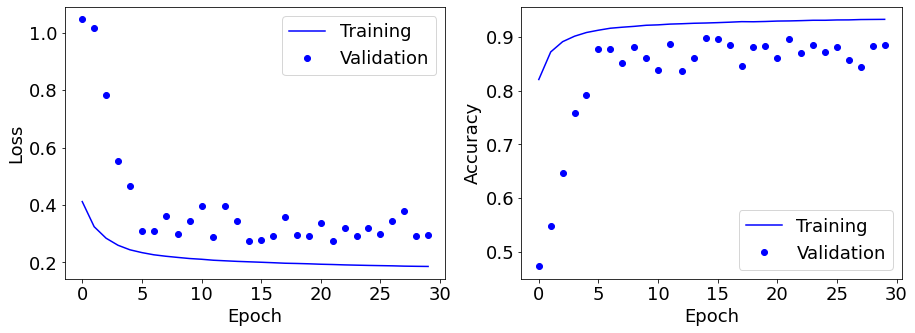

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


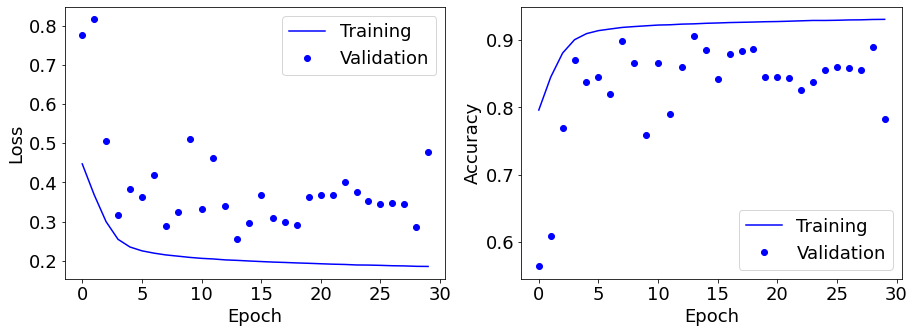

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


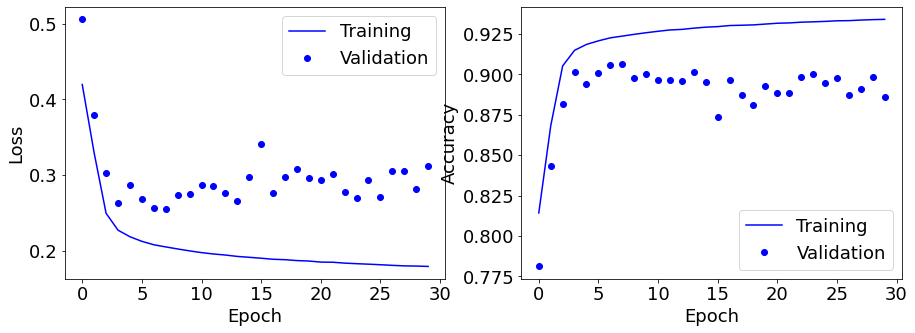

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


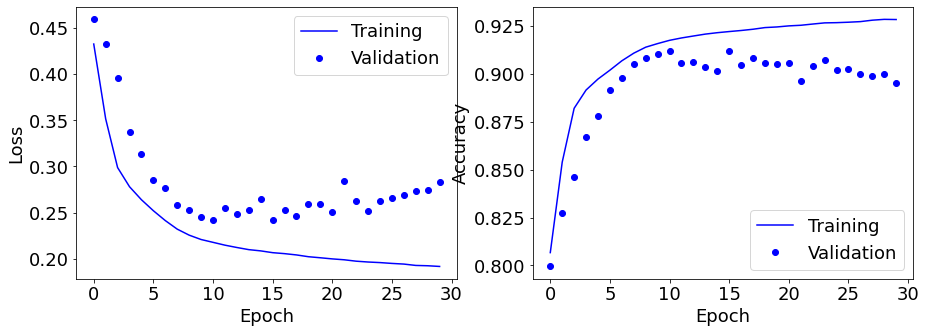

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


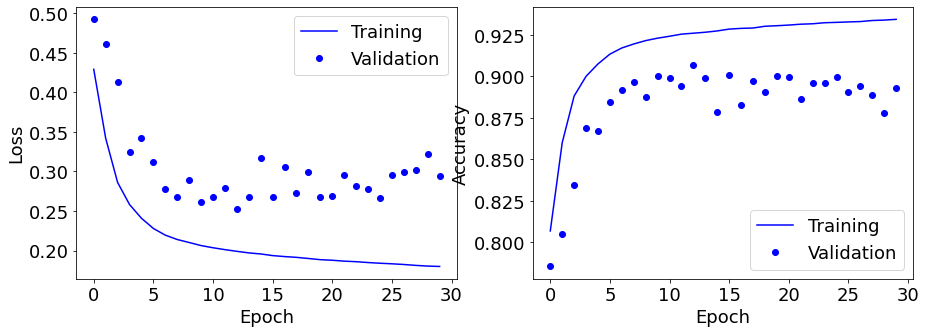

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


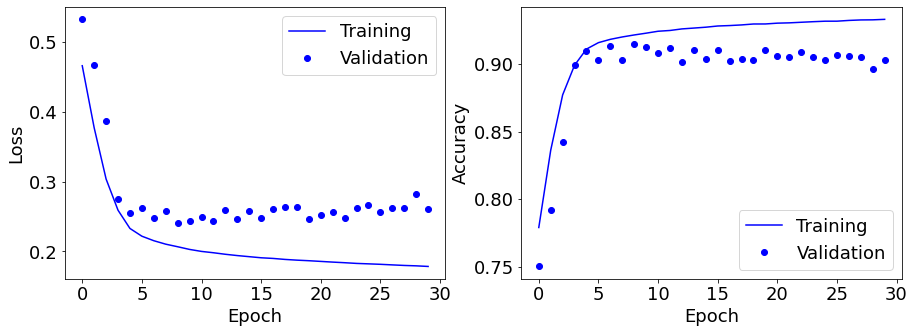

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


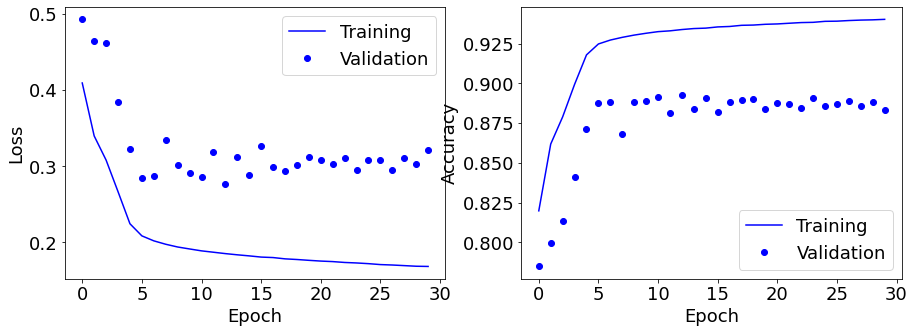

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


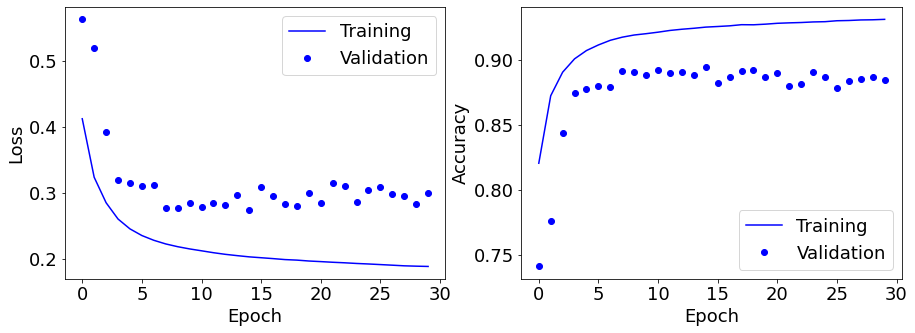

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


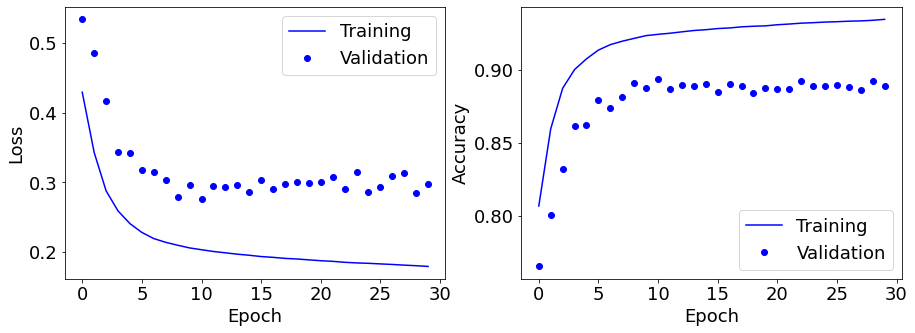

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


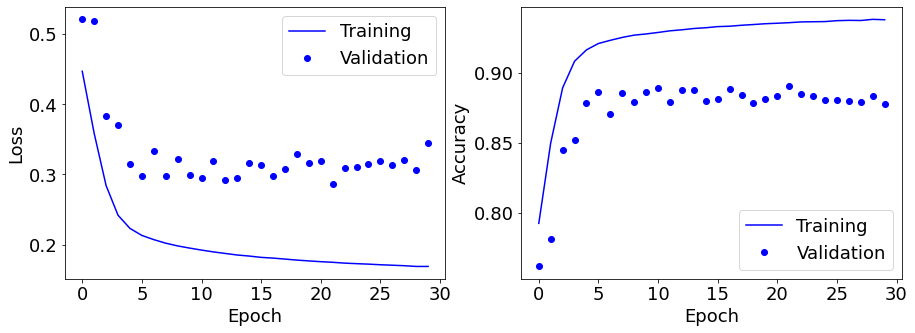

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


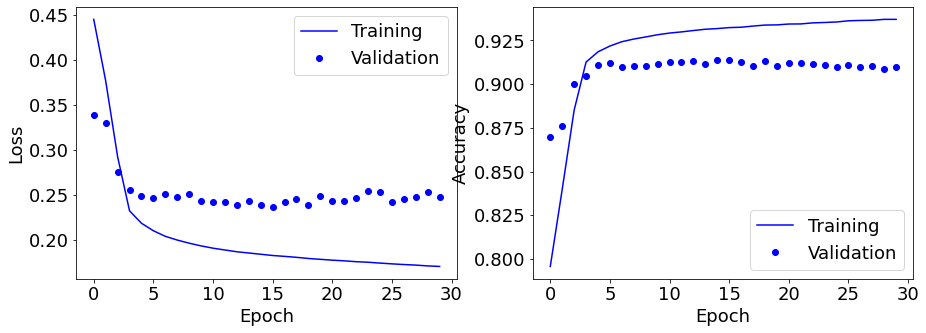

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


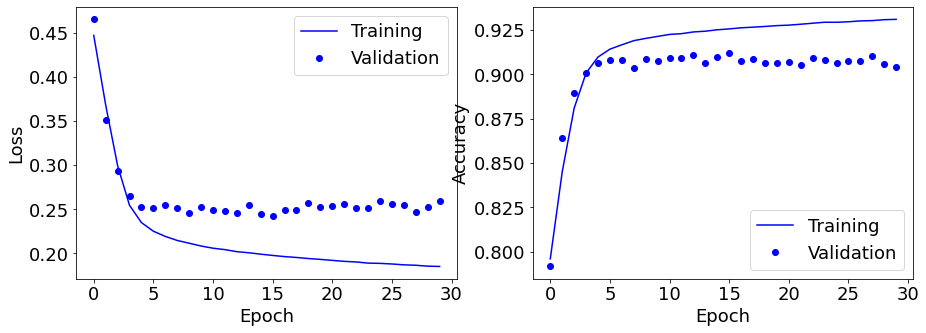

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


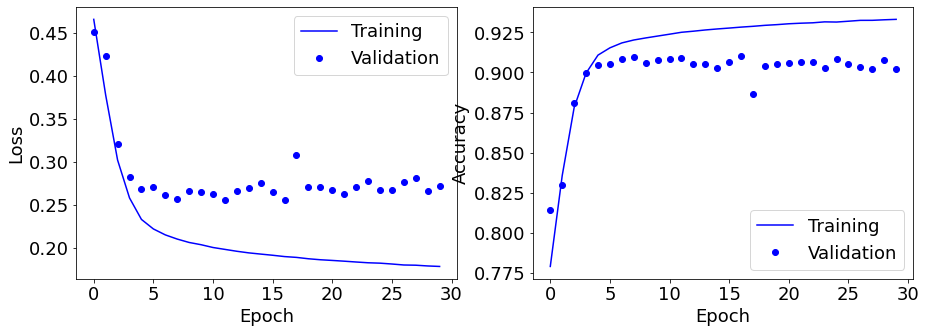

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
-20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


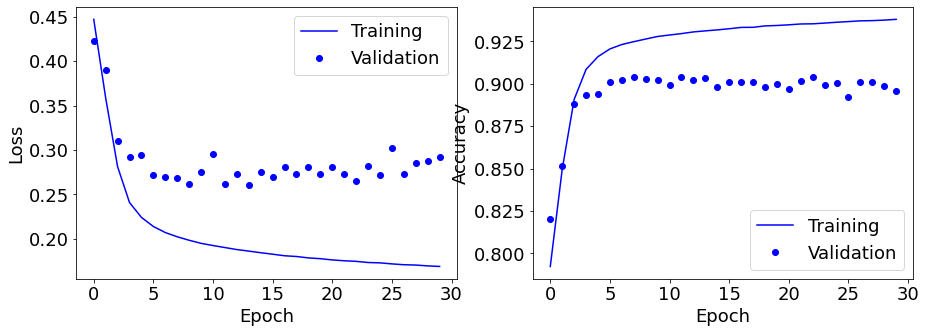

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


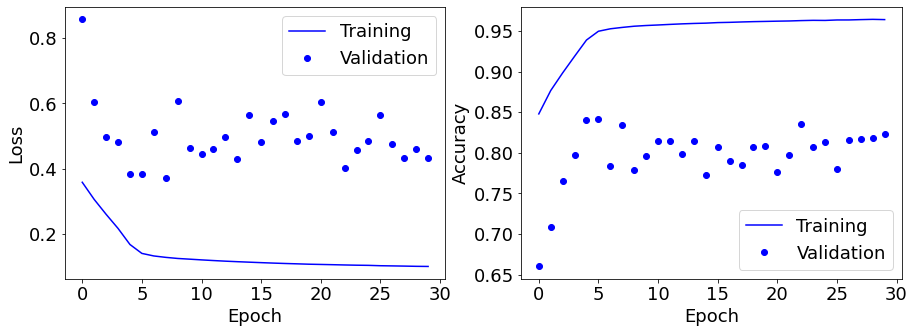

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


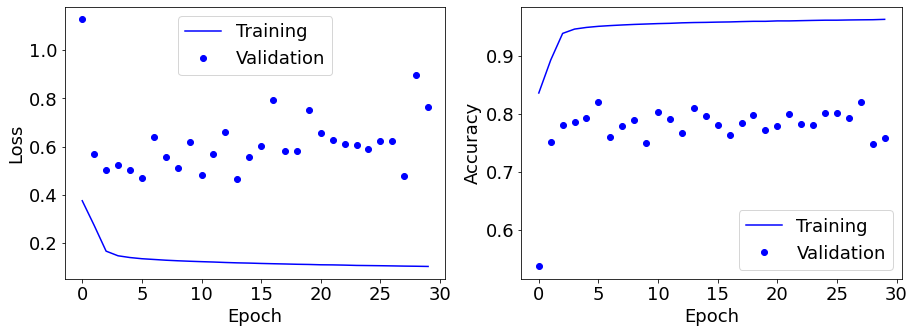

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


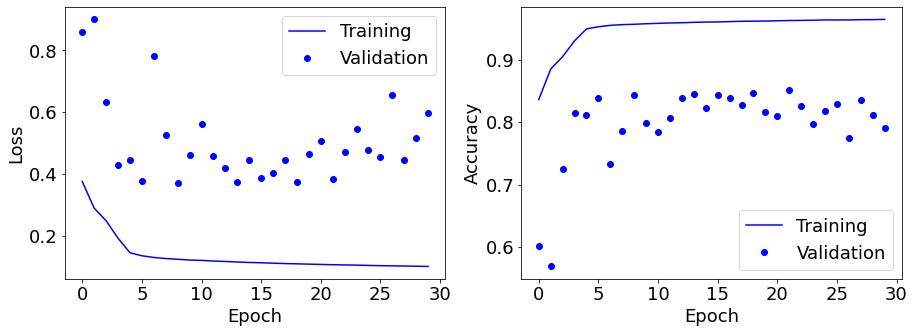

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


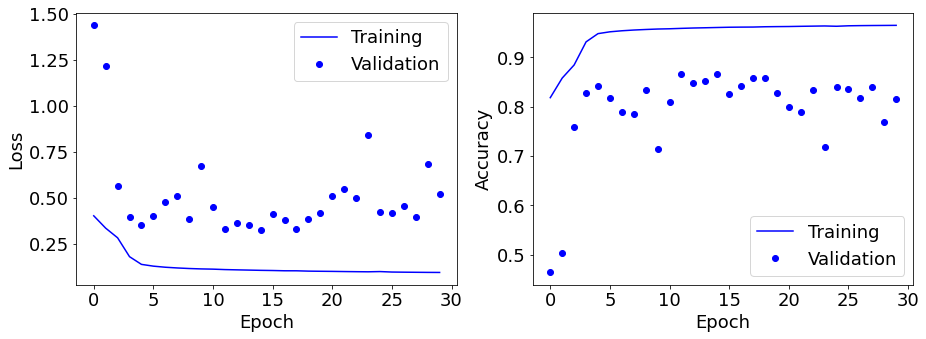

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


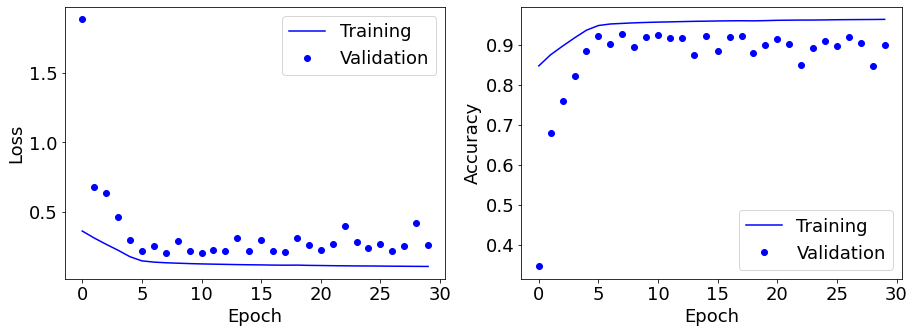

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


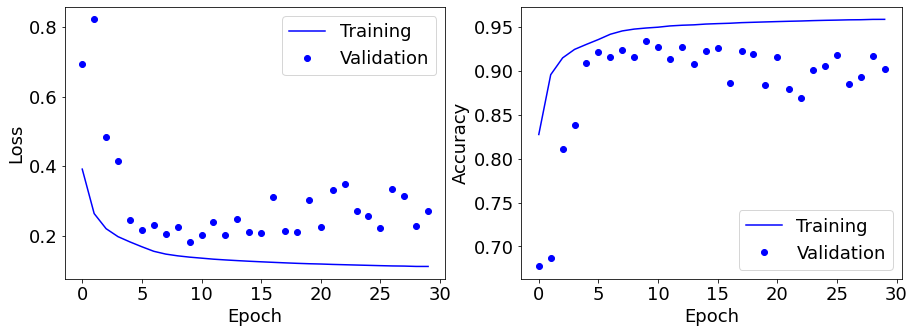

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


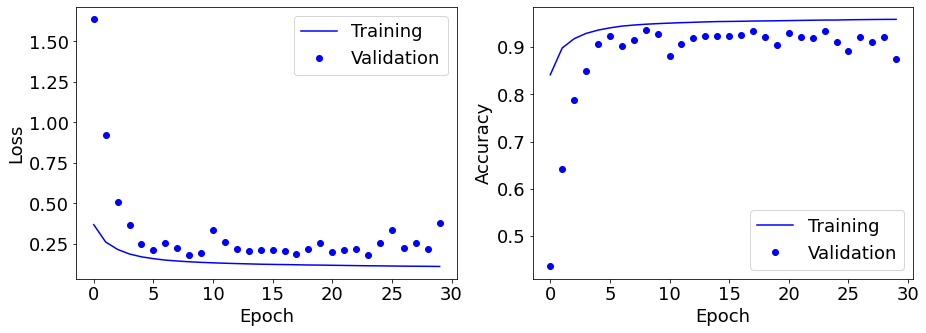

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


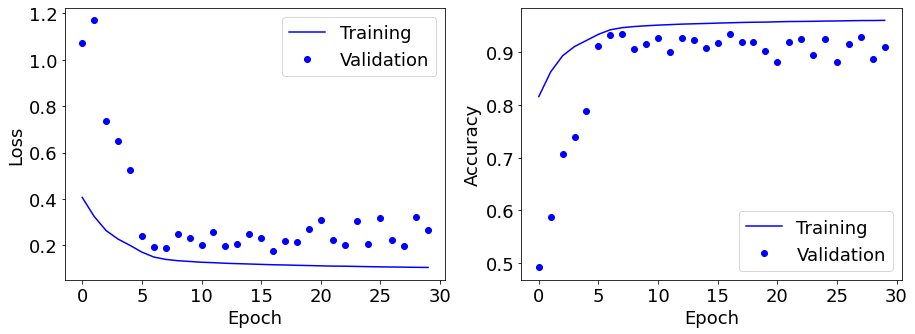

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


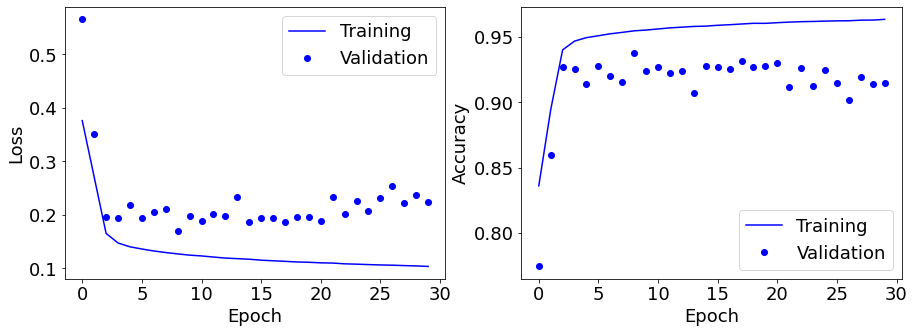

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


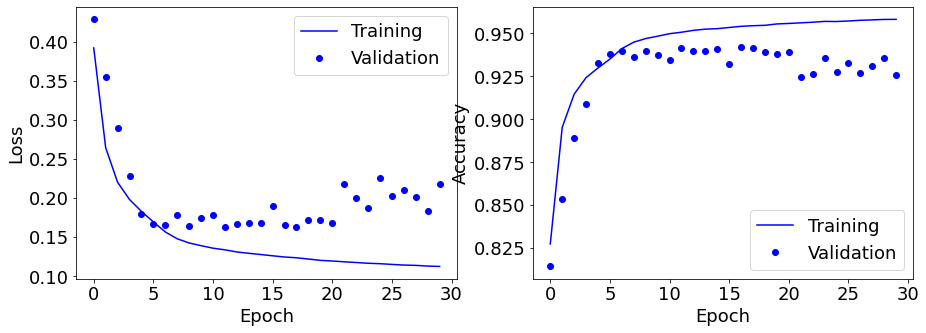

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


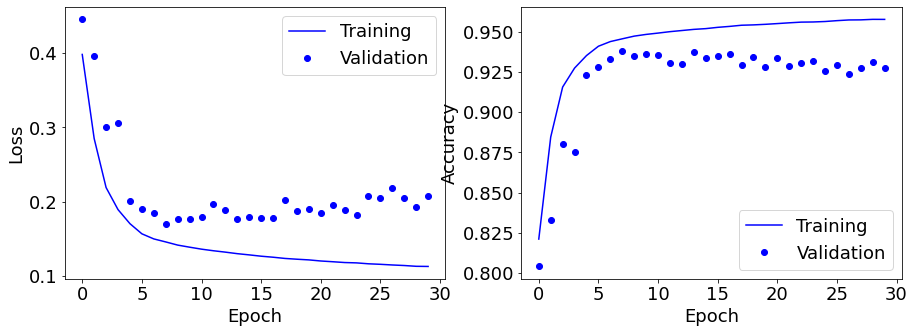

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


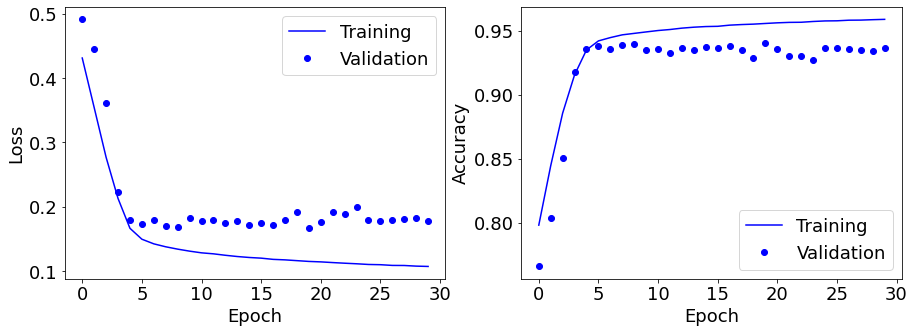

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


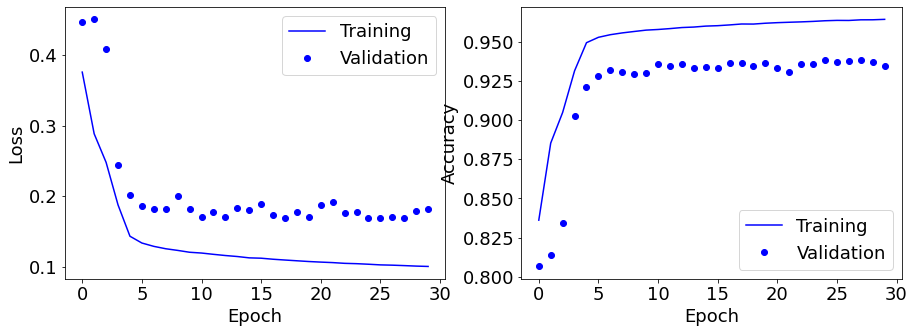

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


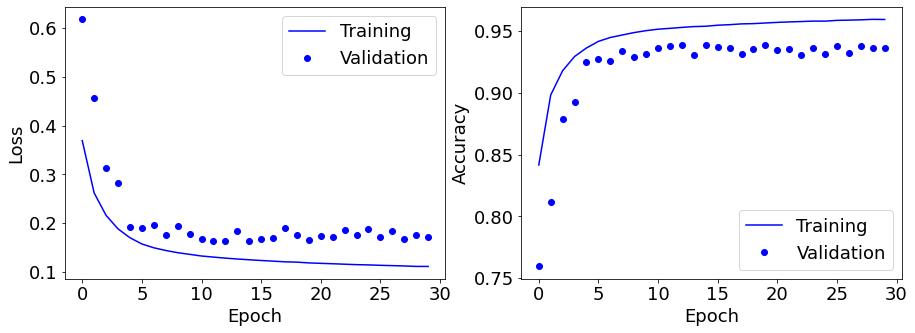

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


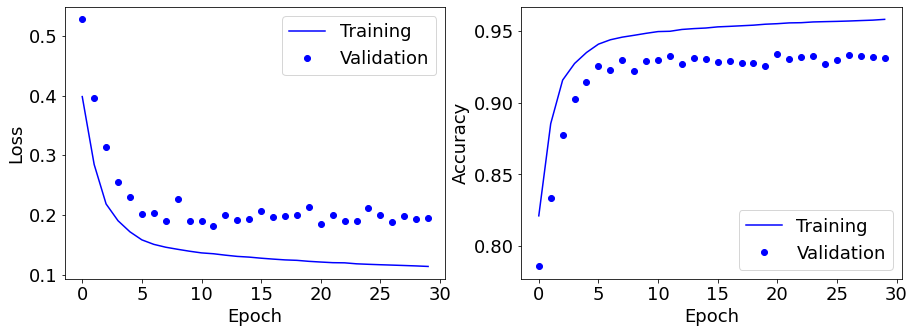

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


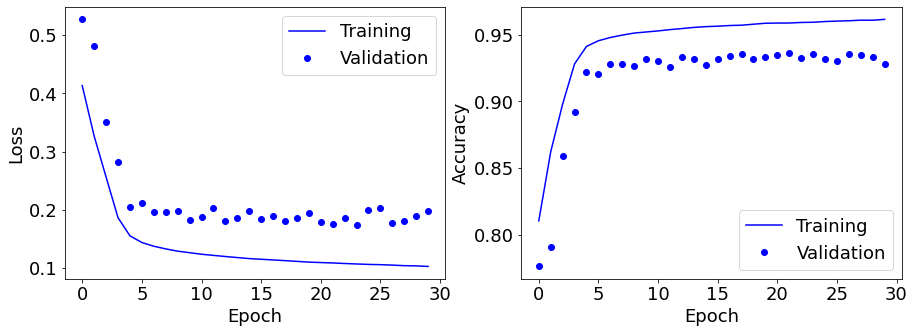

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


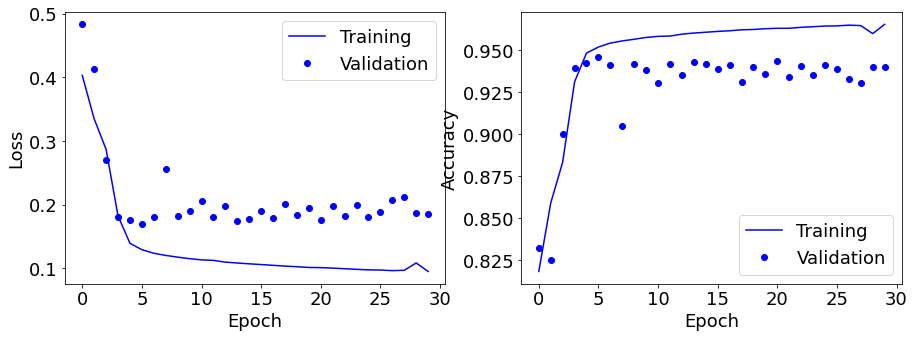

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


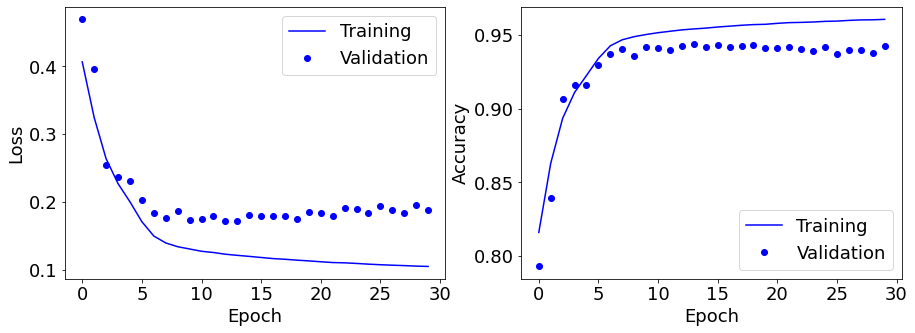

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


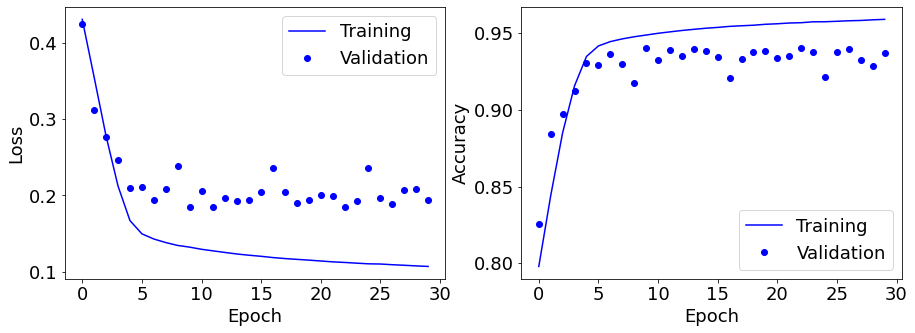

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
-10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


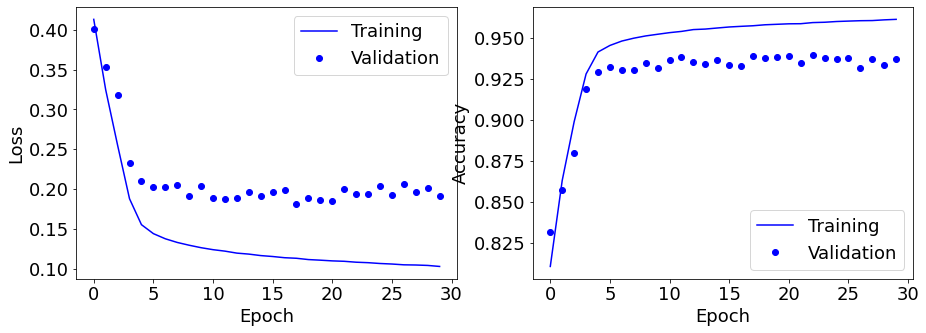

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


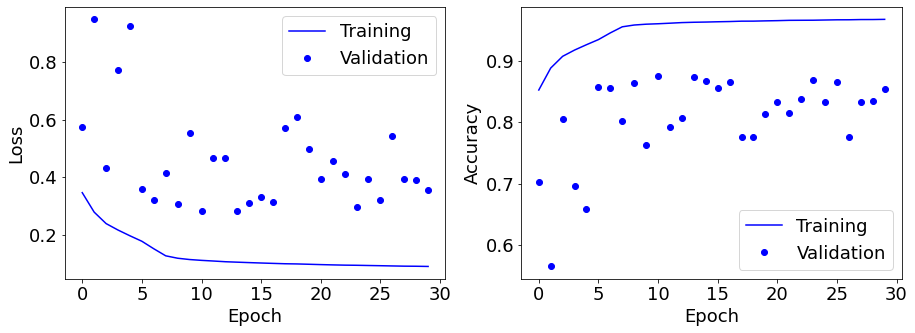

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


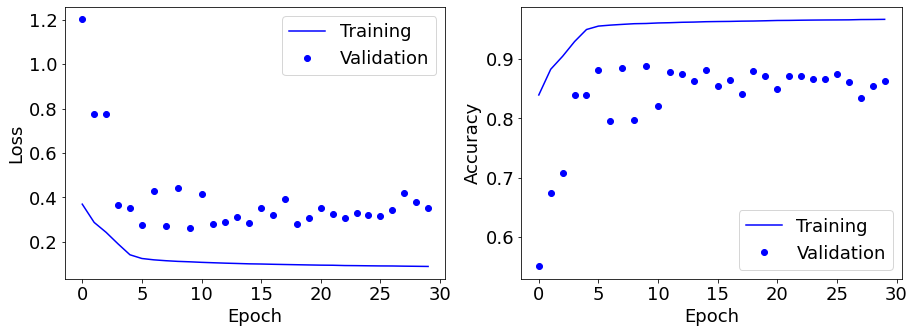

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


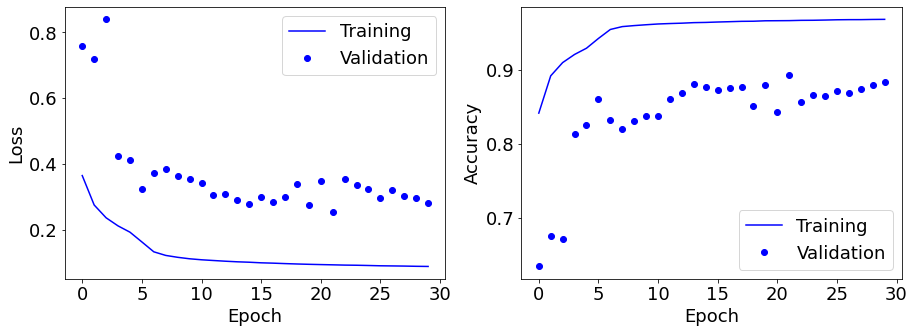

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


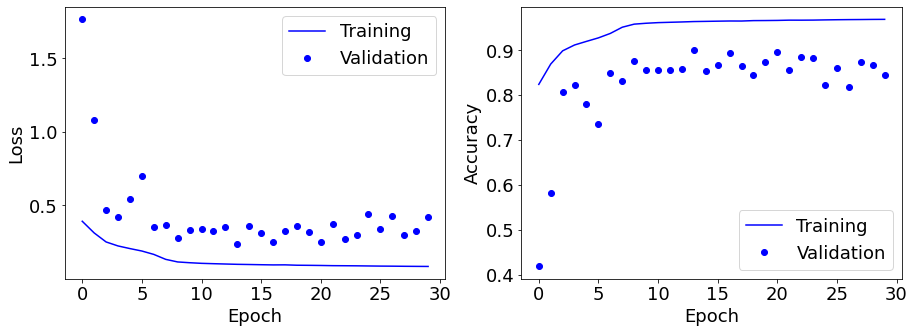

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


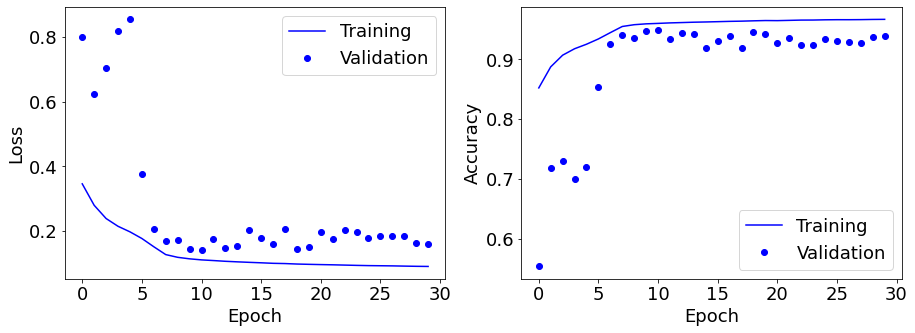

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


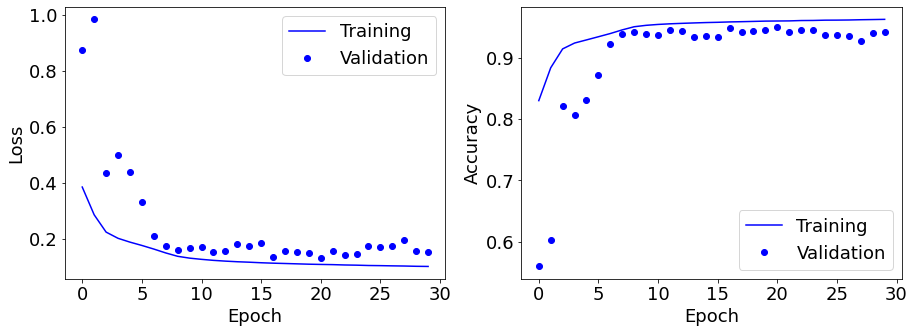

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


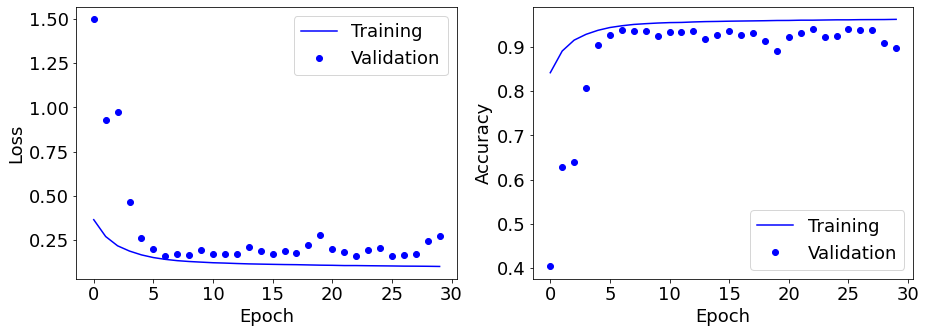

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


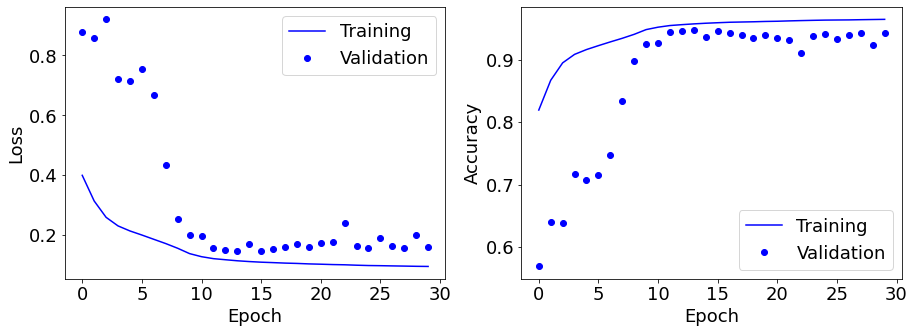

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


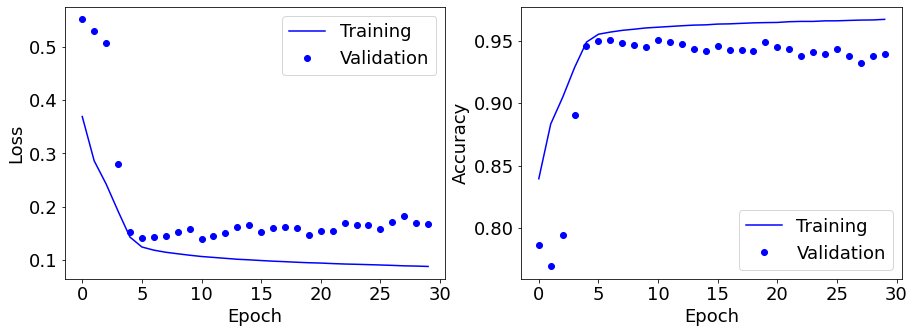

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


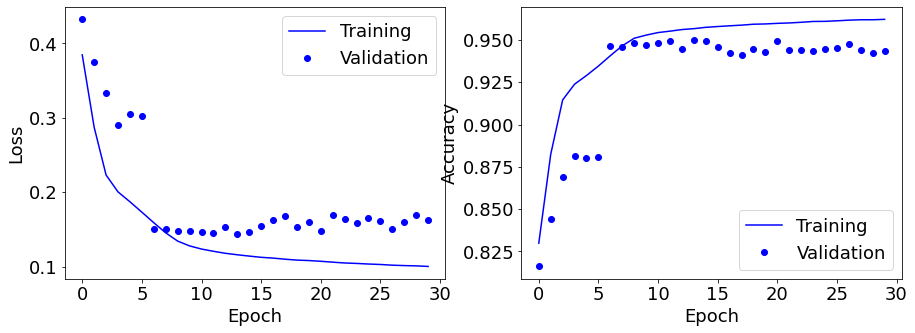

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


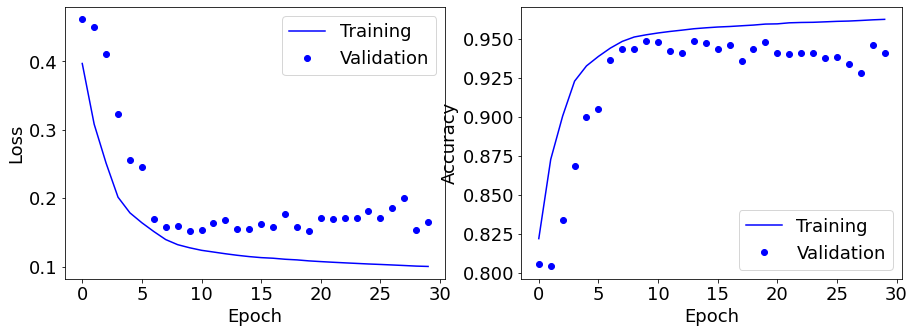

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


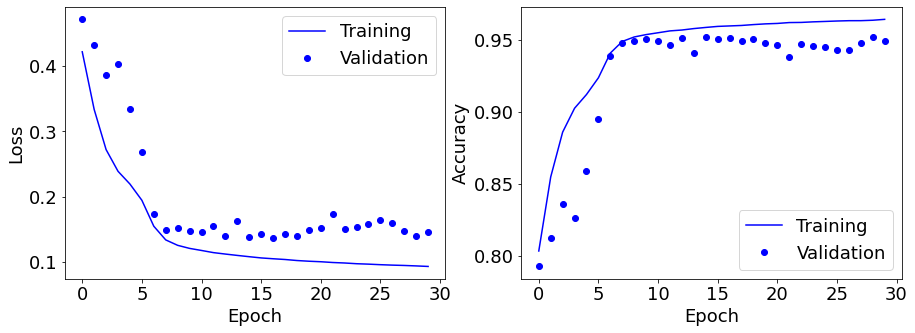

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


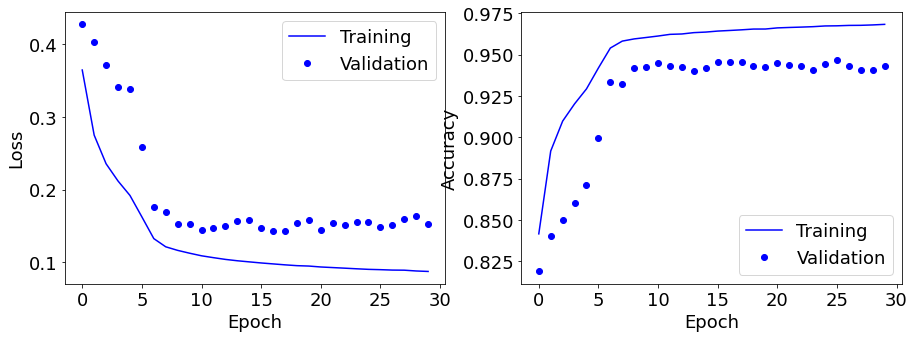

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


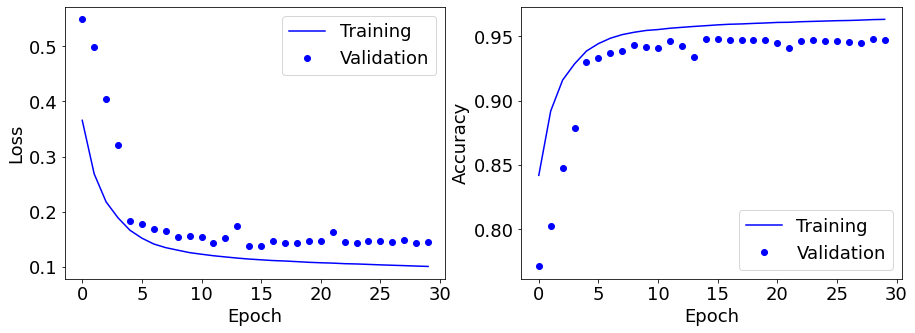

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


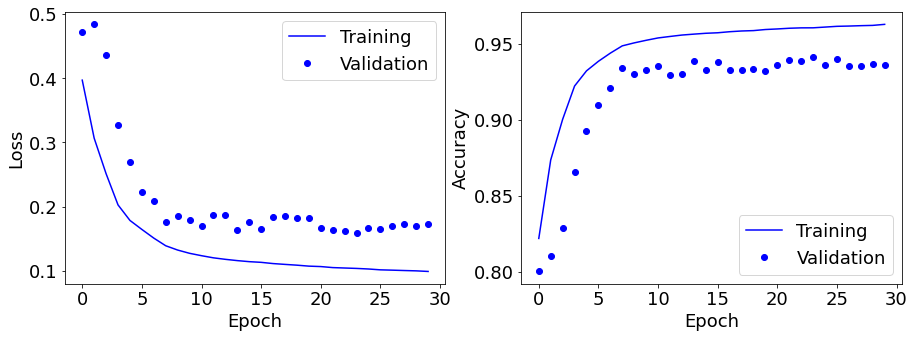

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


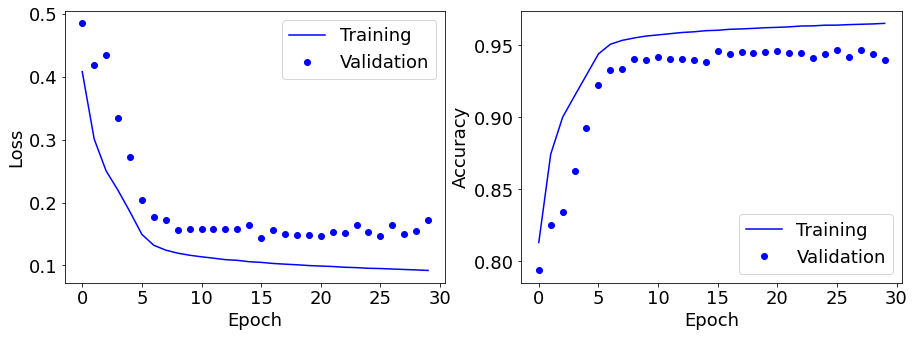

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


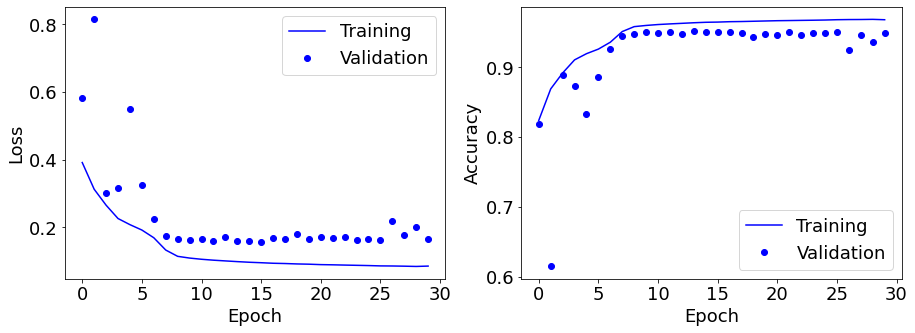

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


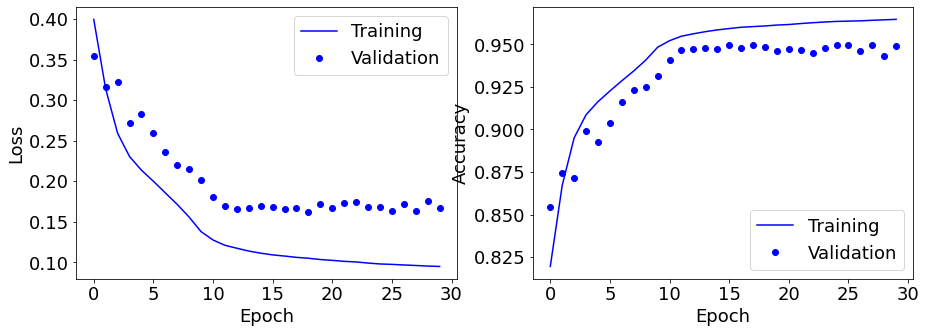

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


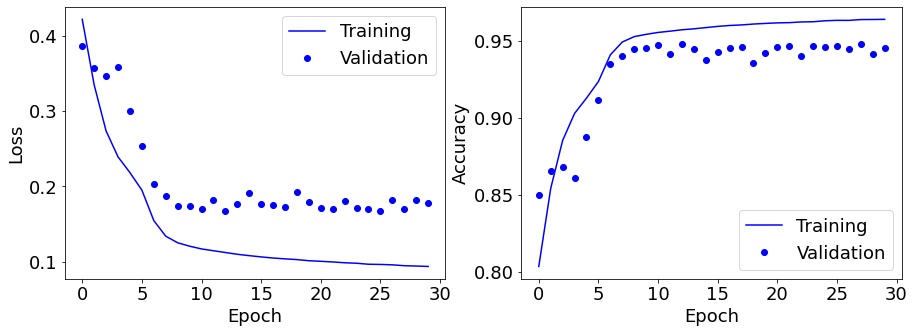

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
0


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


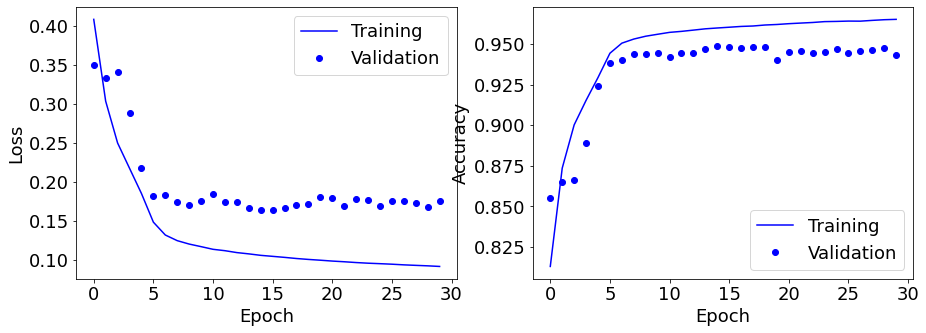

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


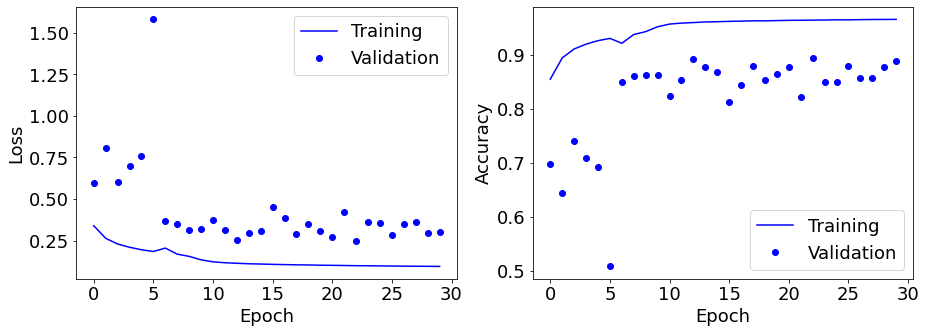

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


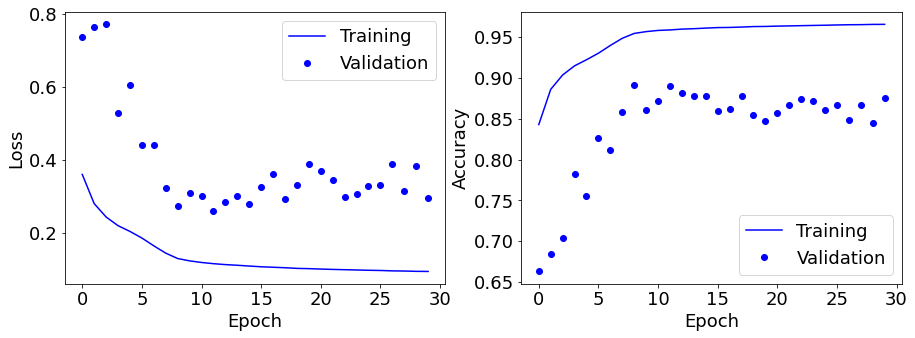

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


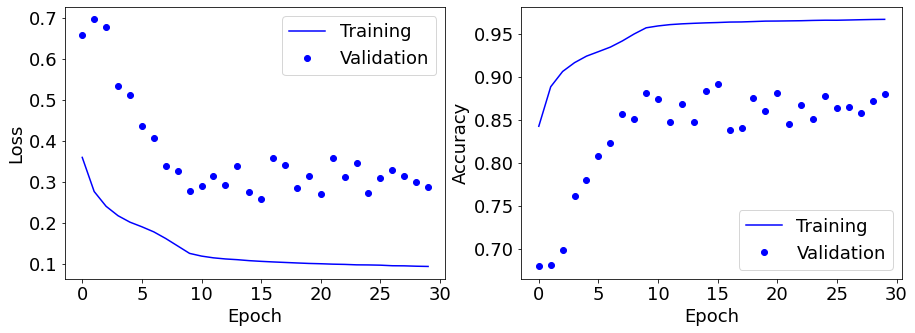

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


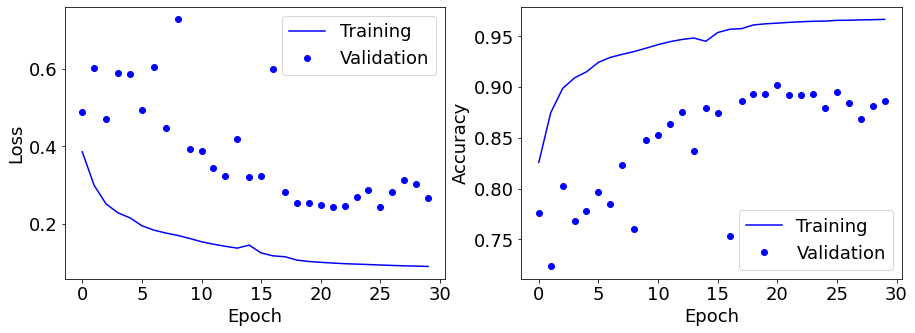

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


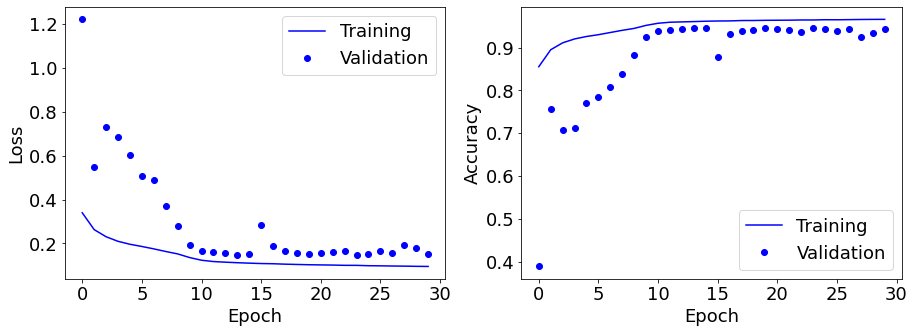

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


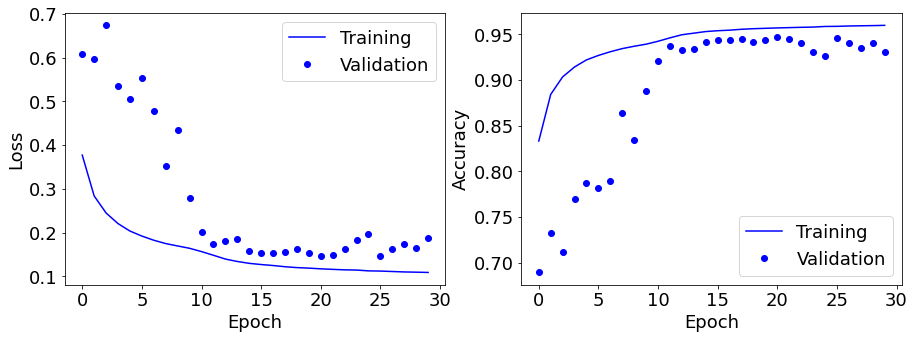

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


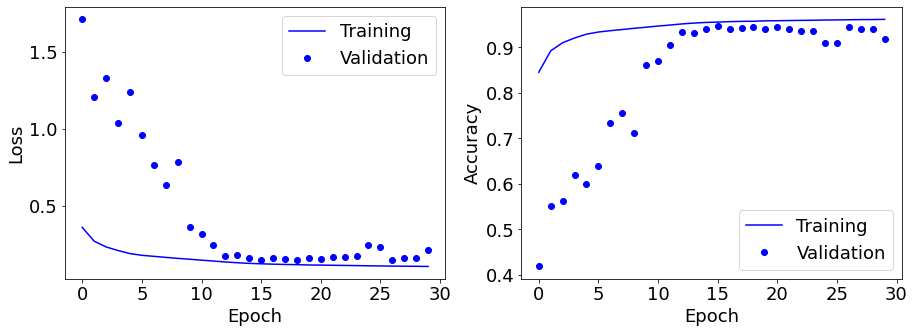

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


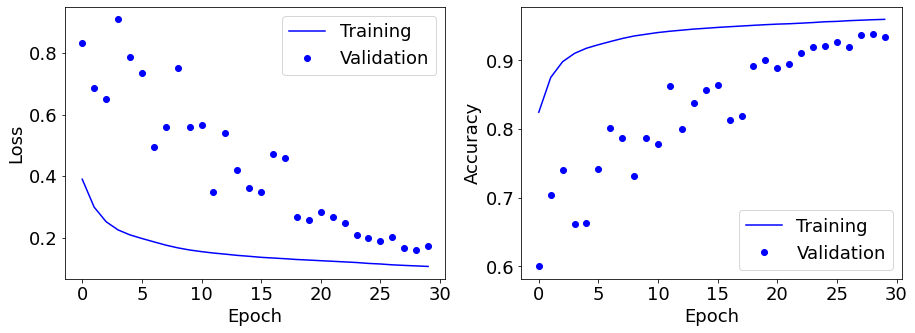

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


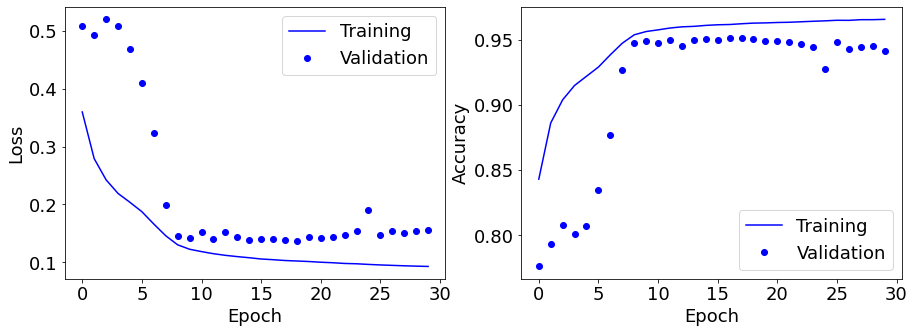

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


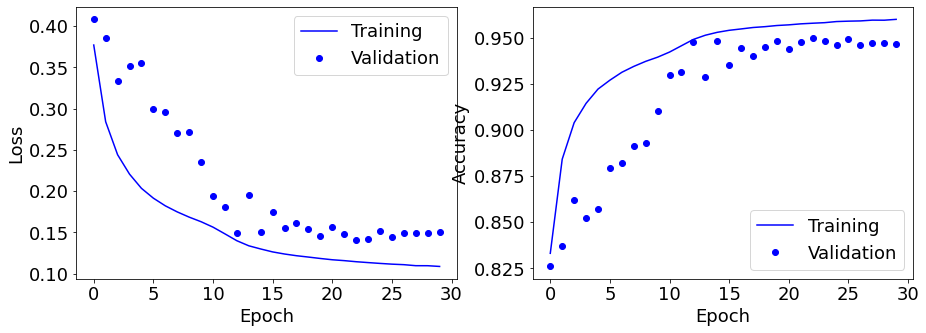

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


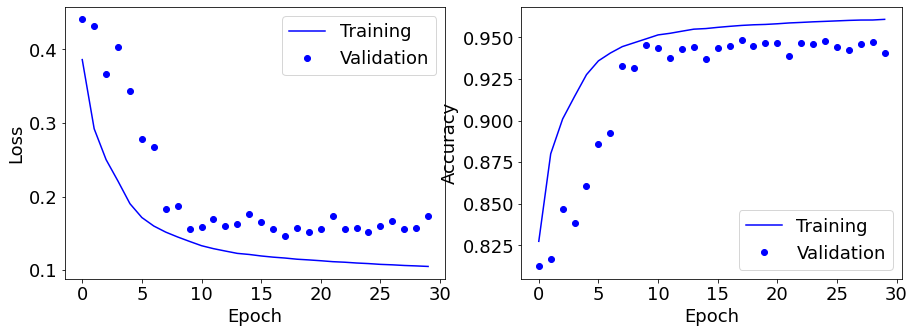

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


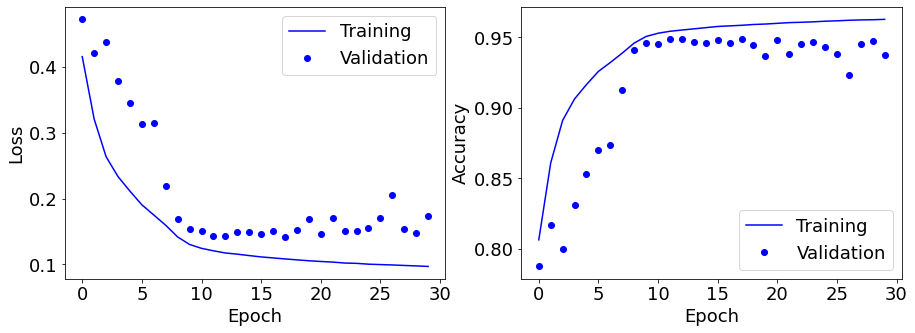

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


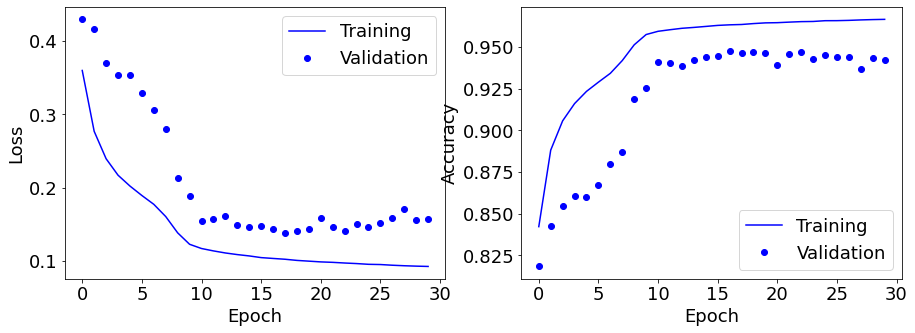

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


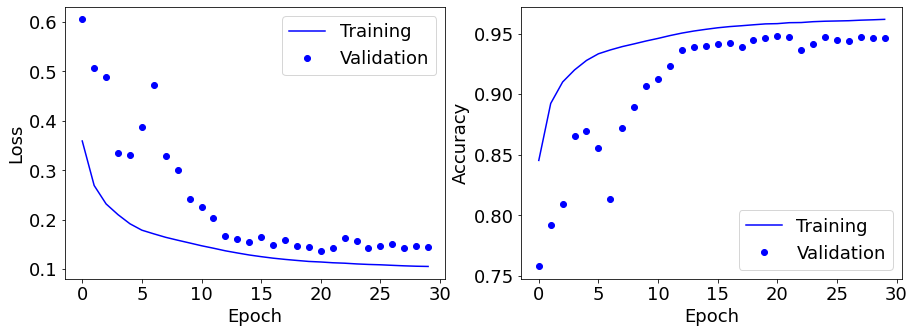

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


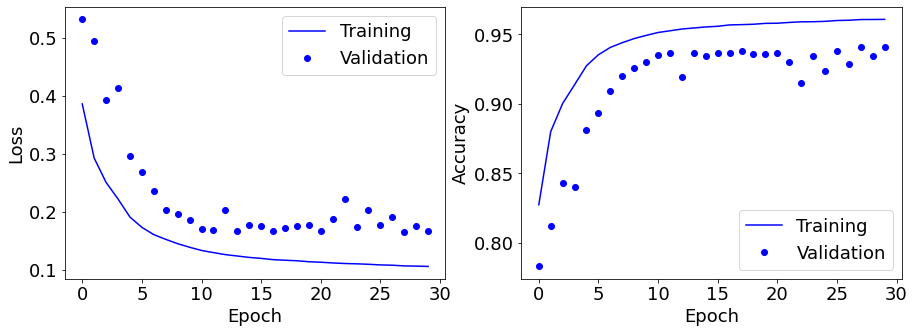

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


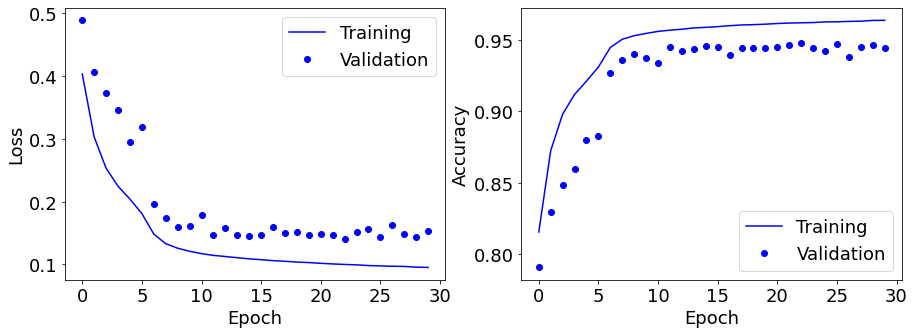

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


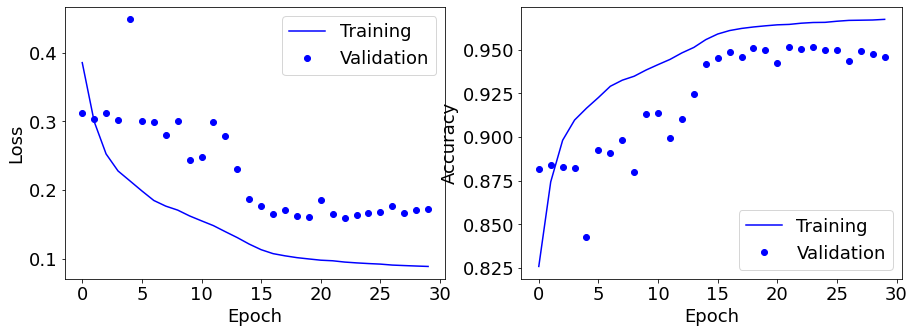

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


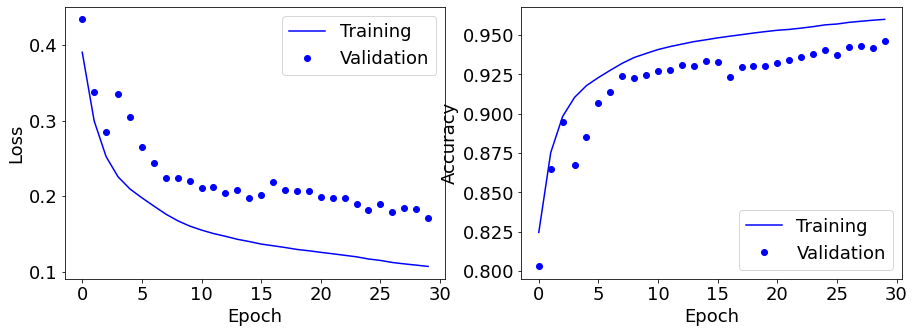

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


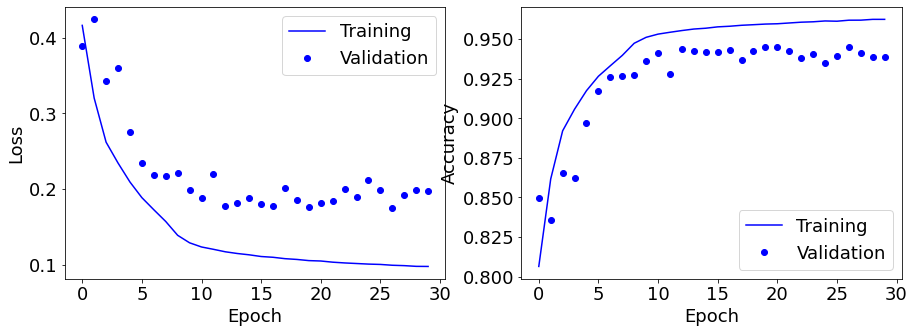

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
10


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


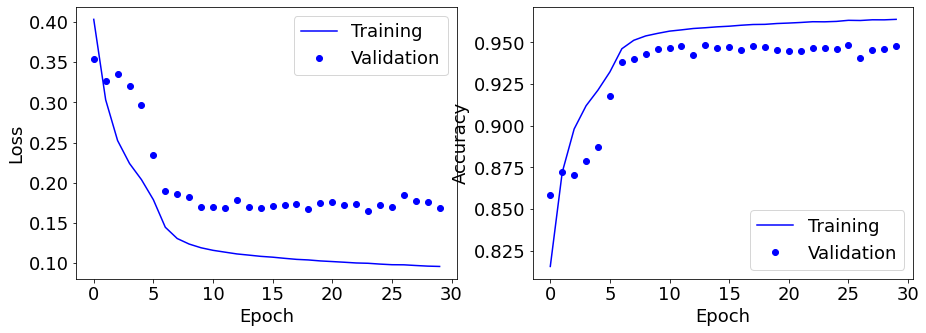

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


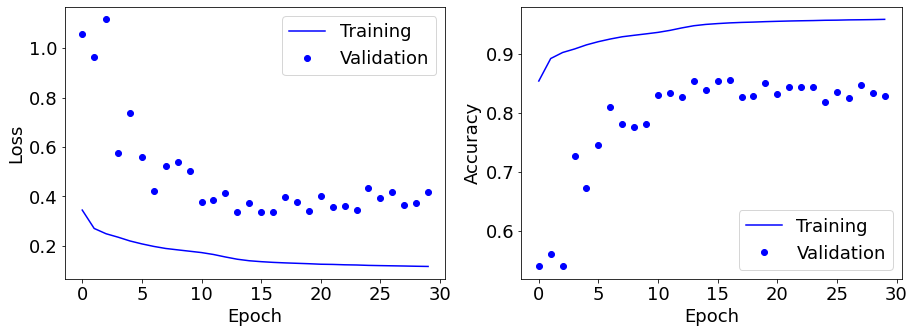

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


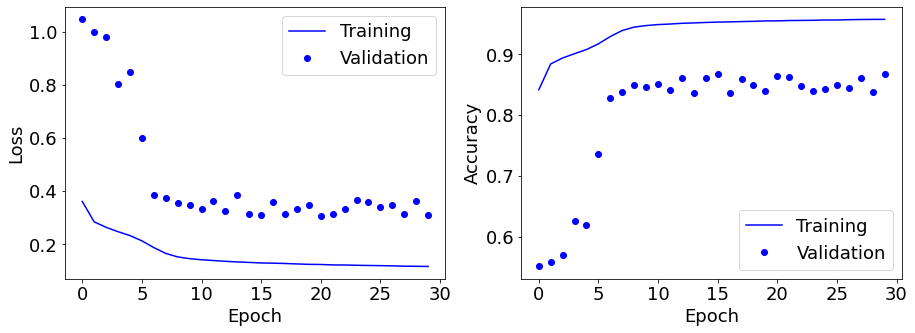

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


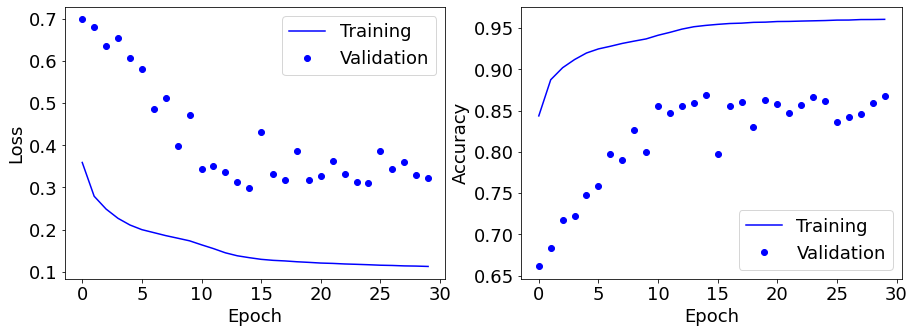

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


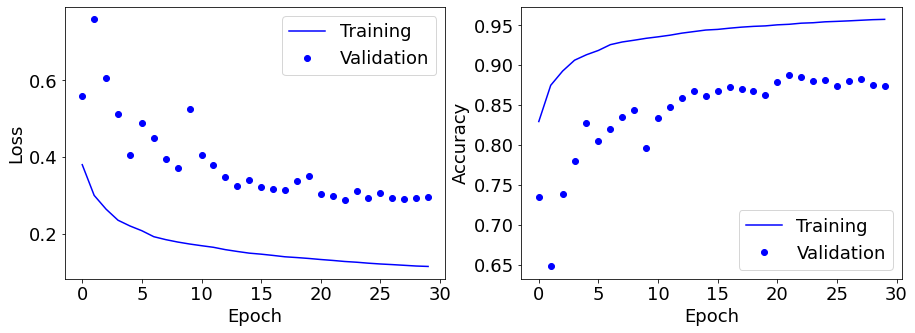

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


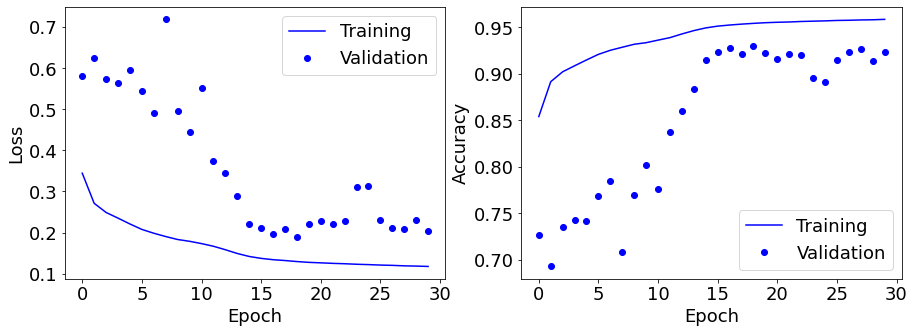

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


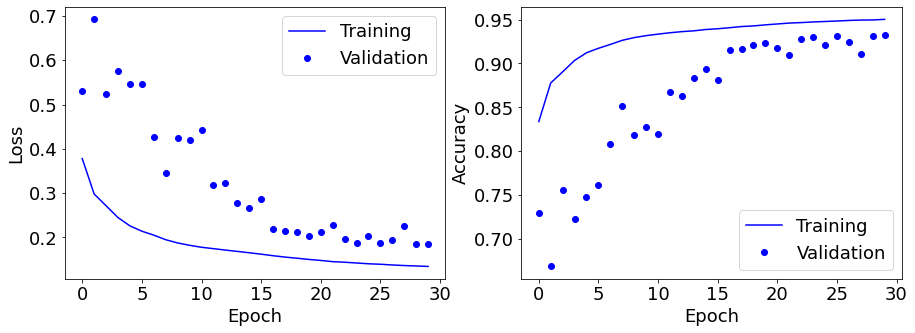

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


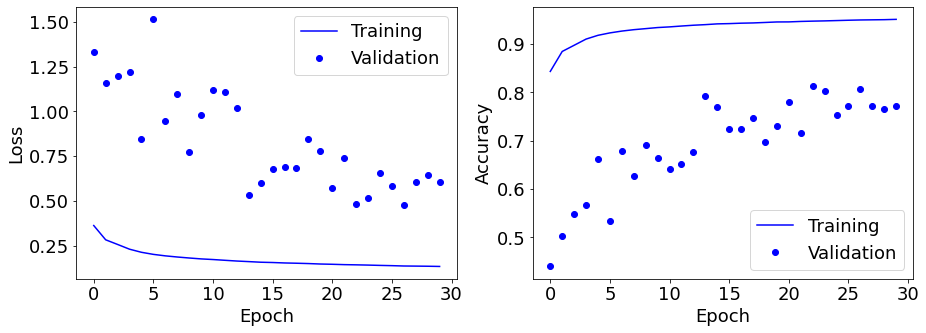

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


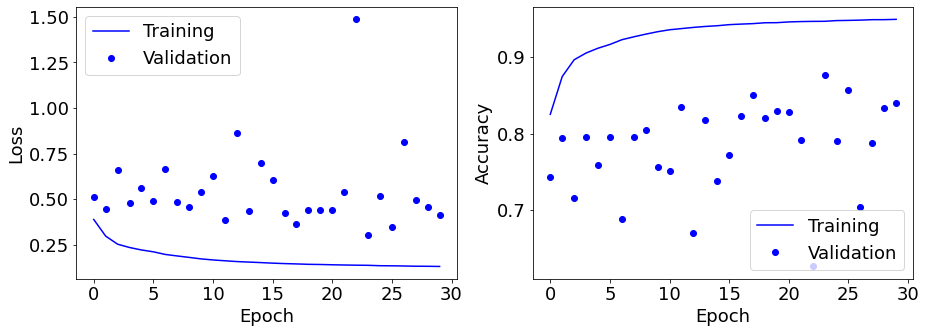

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


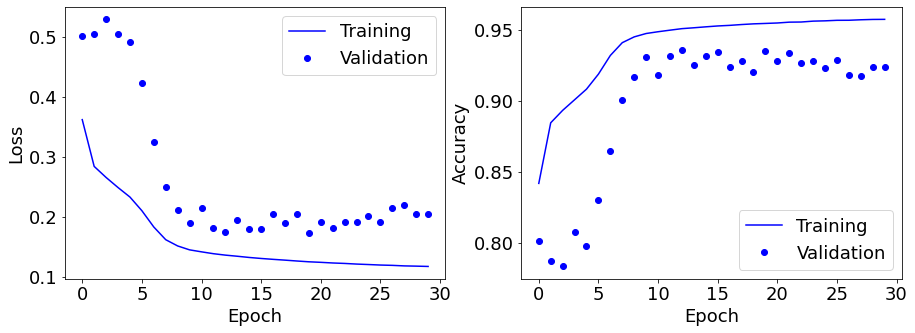

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


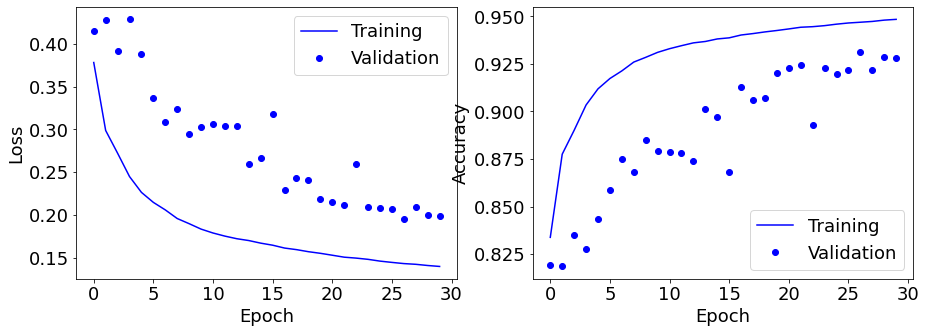

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


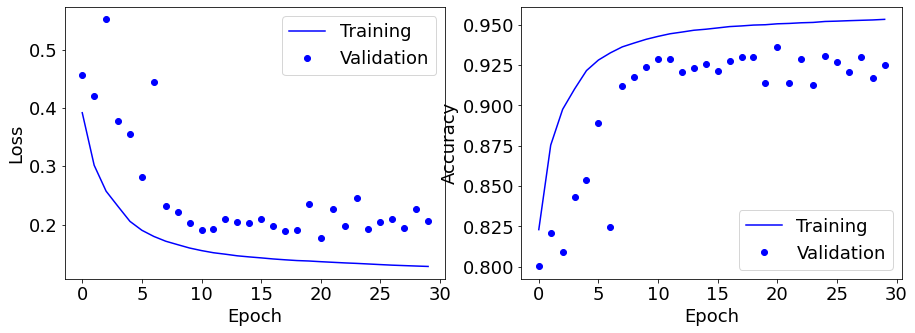

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


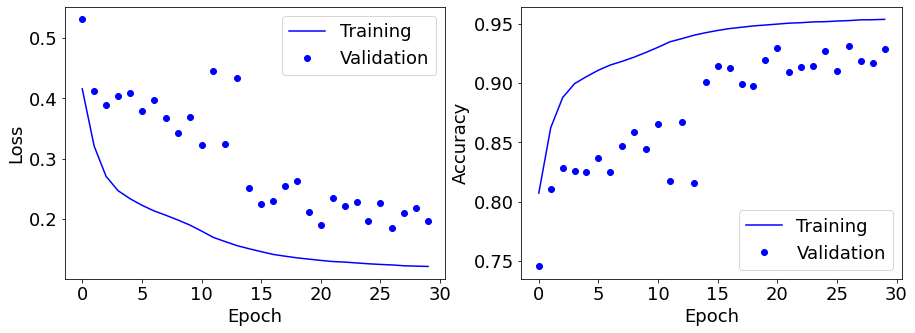

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


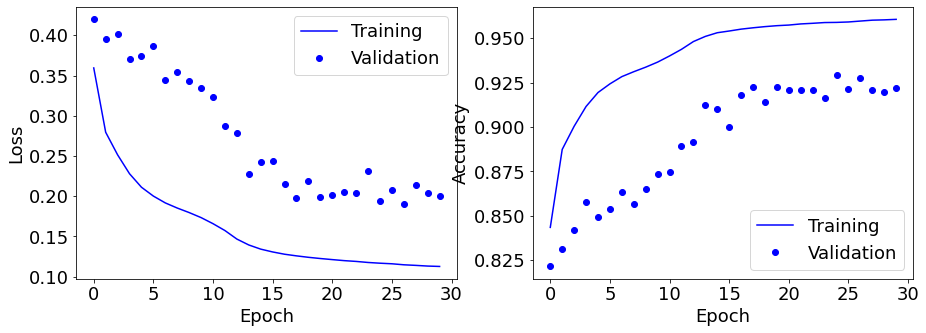

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


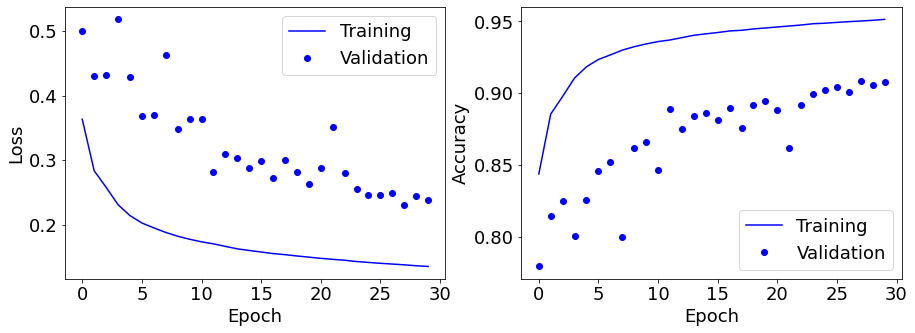

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


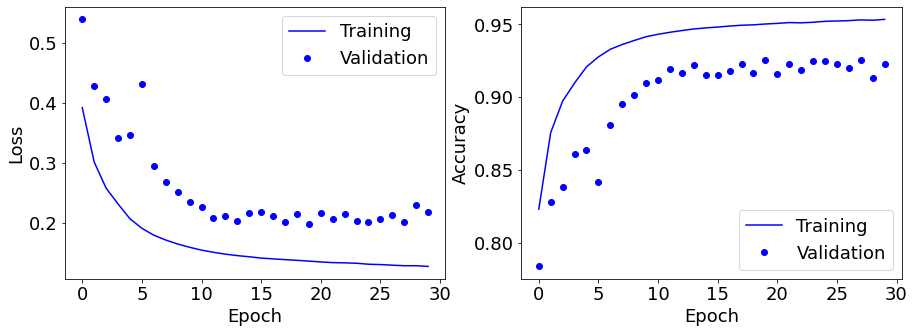

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


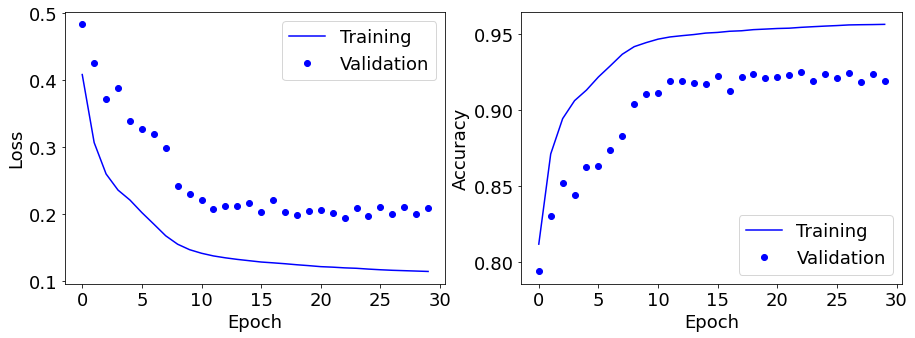

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


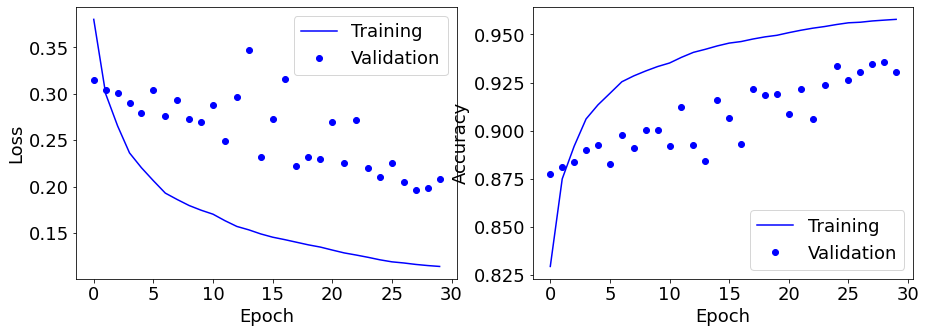

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


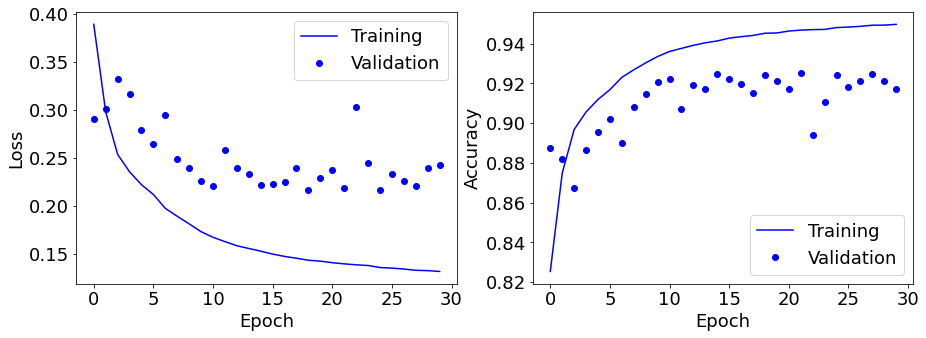

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


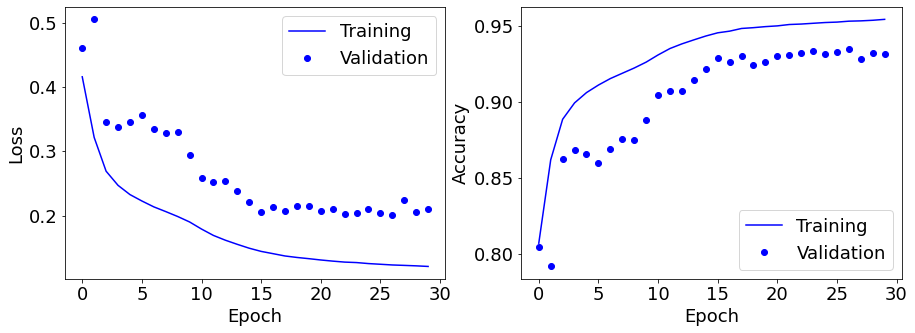

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
20


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


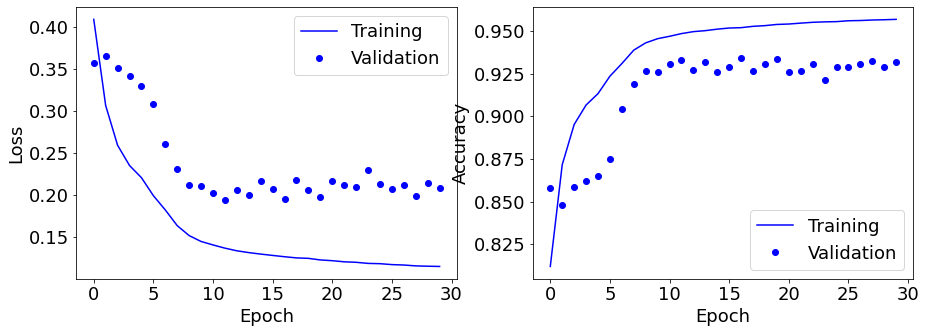

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


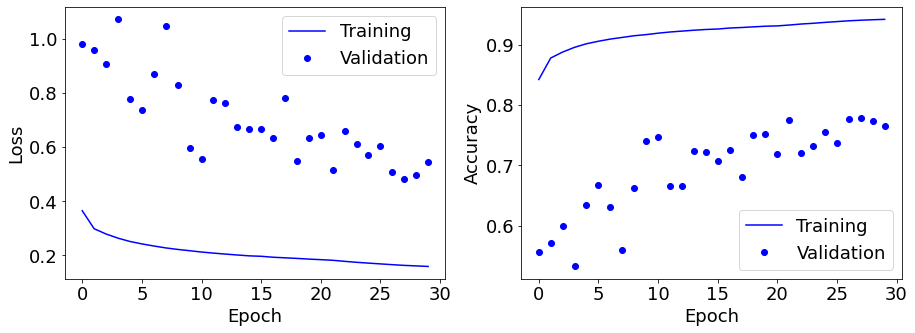

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


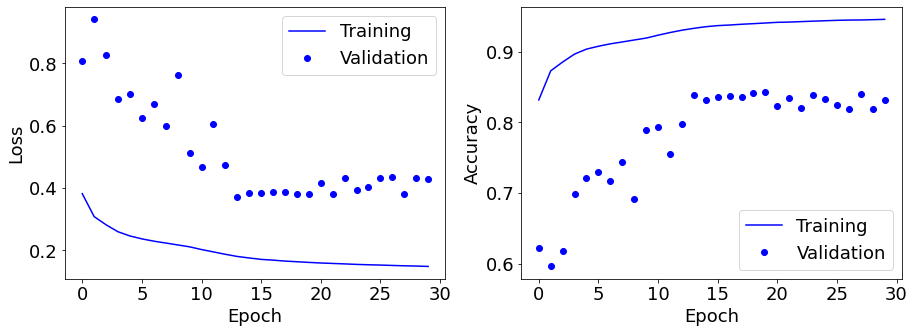

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


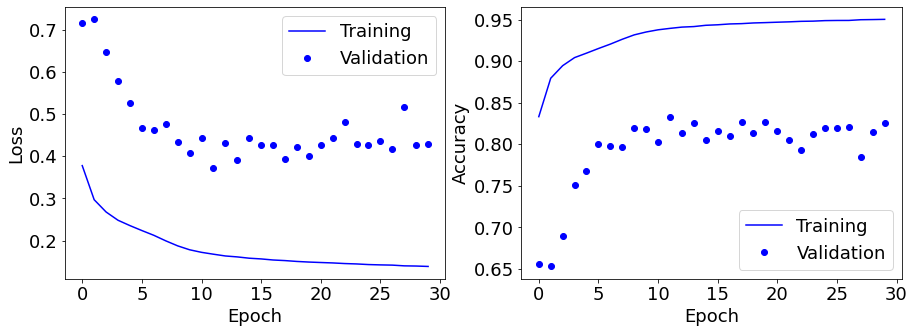

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


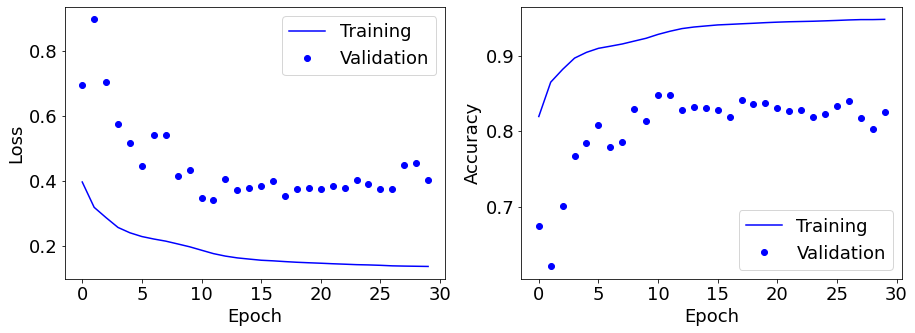

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


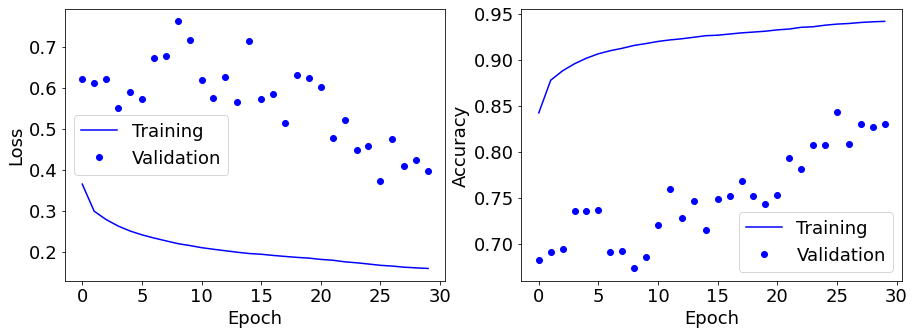

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


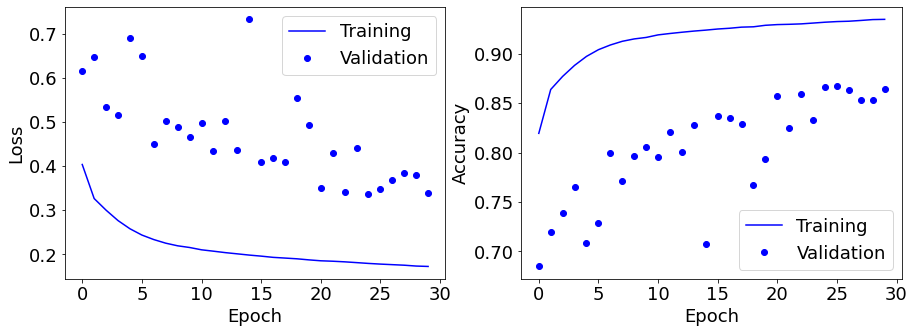

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


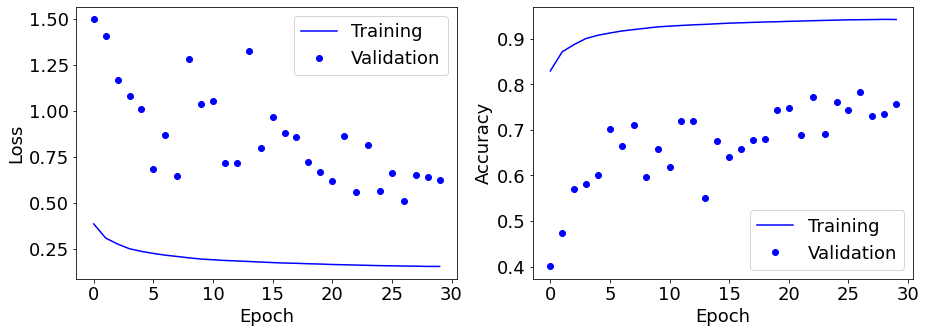

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


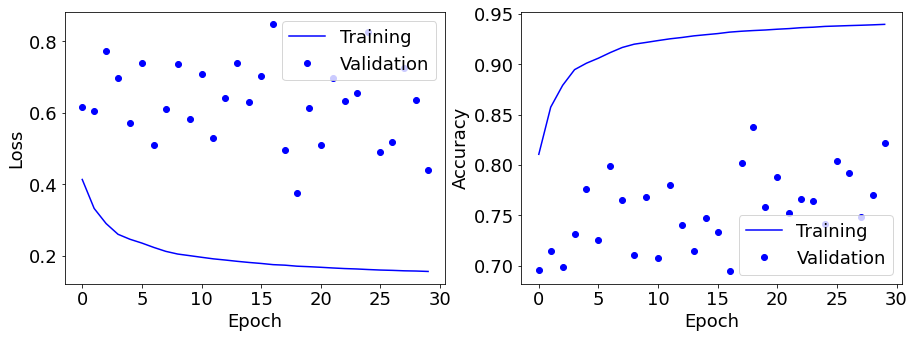

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


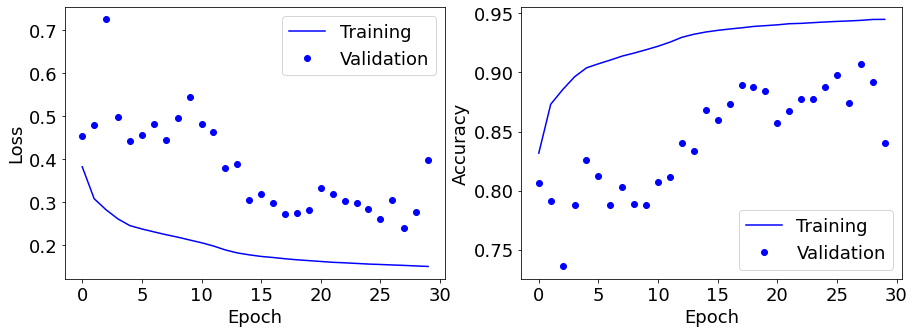

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


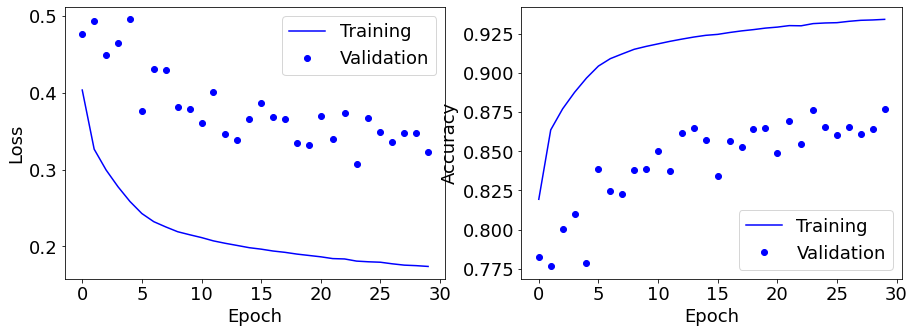

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


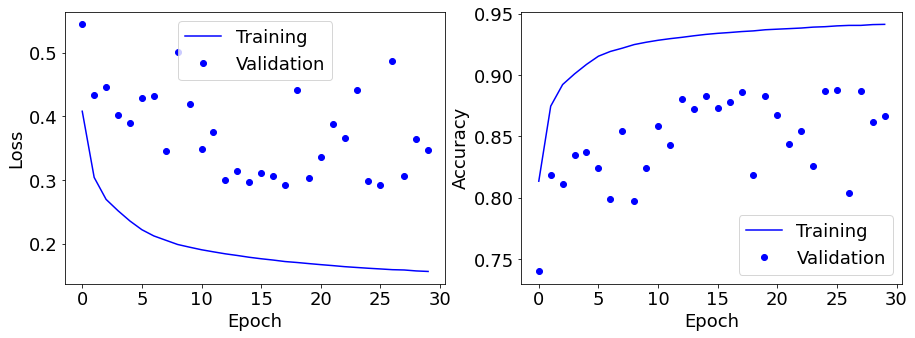

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


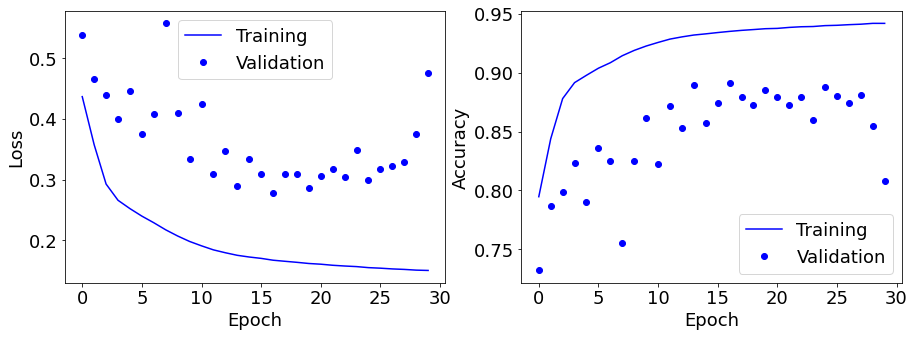

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


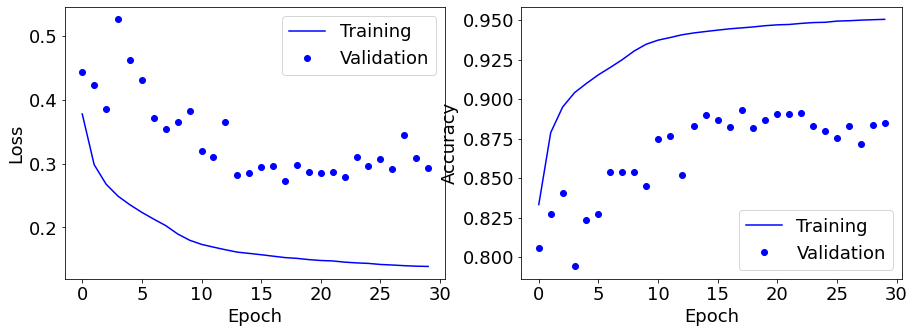

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


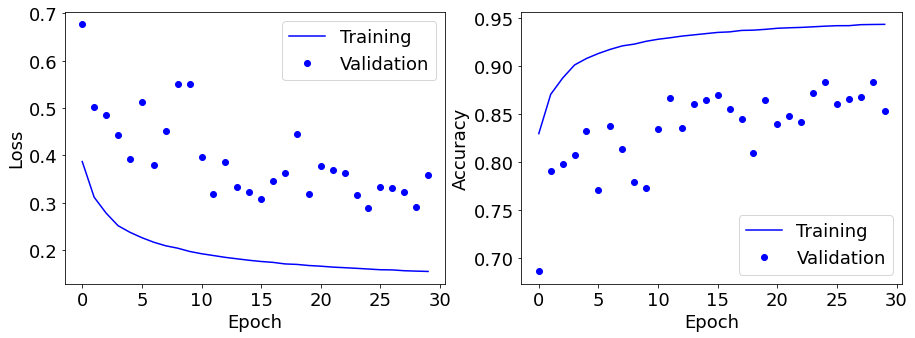

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


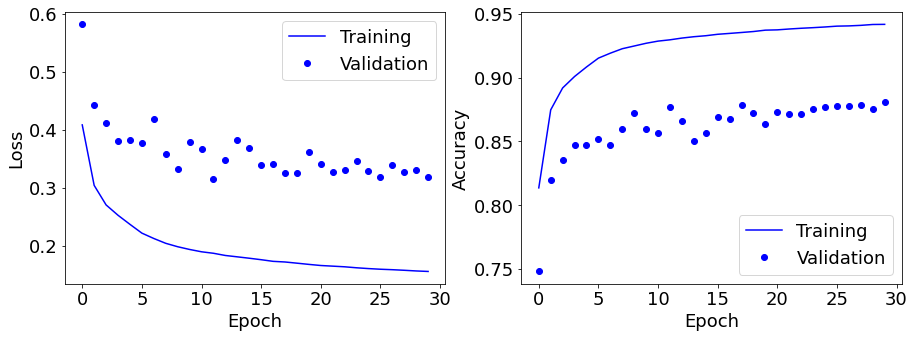

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


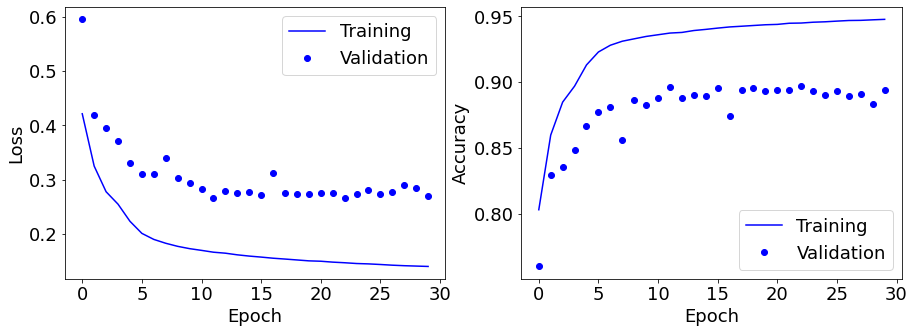

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


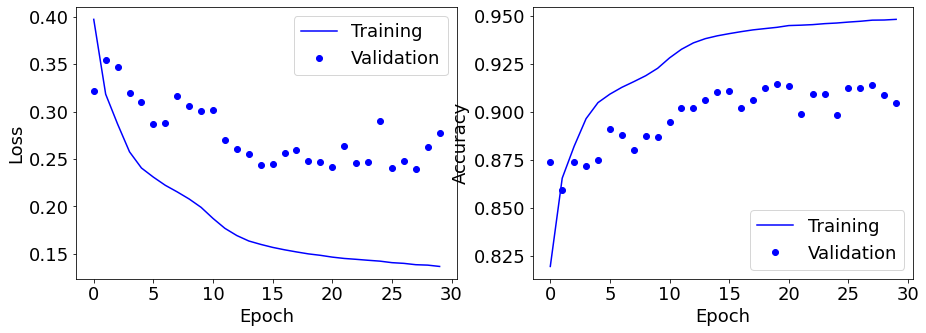

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


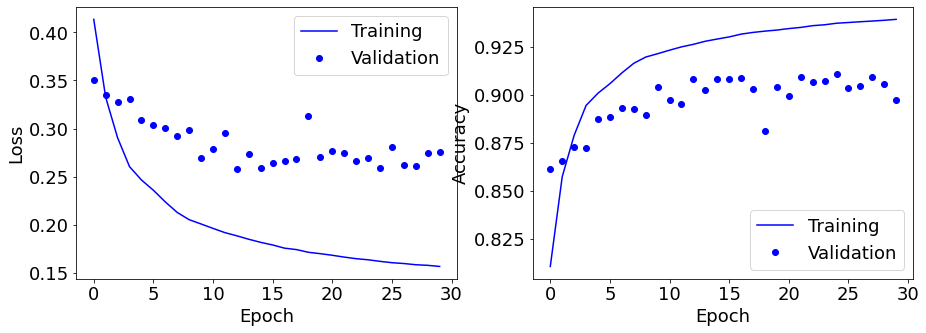

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


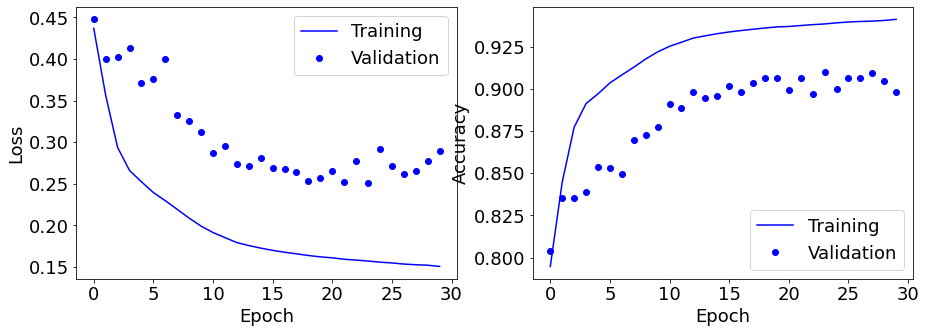

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
30


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


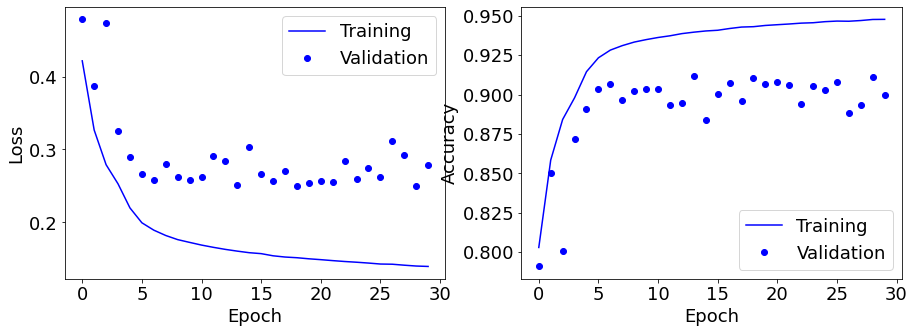

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


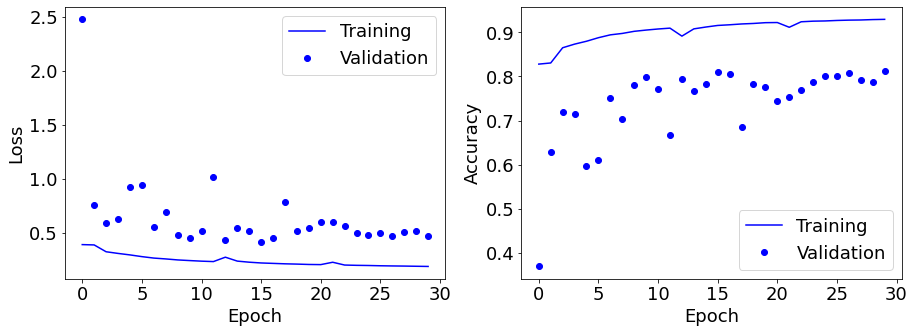

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


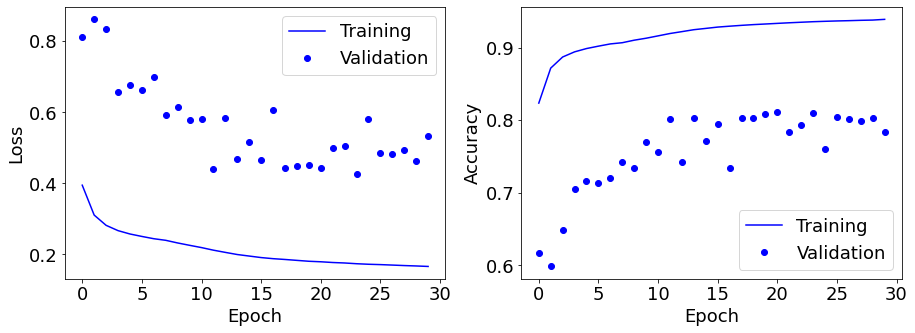

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


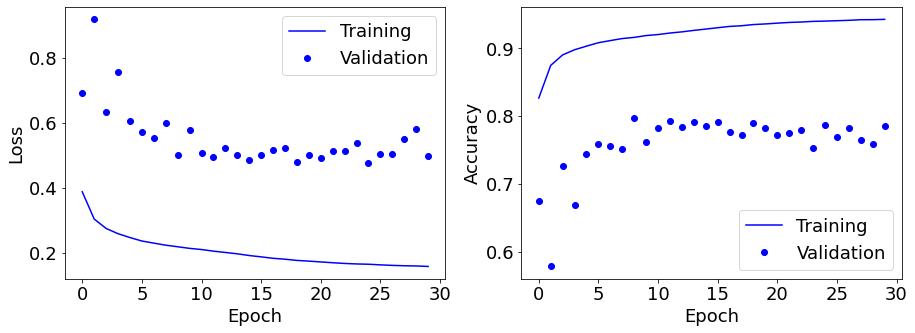

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


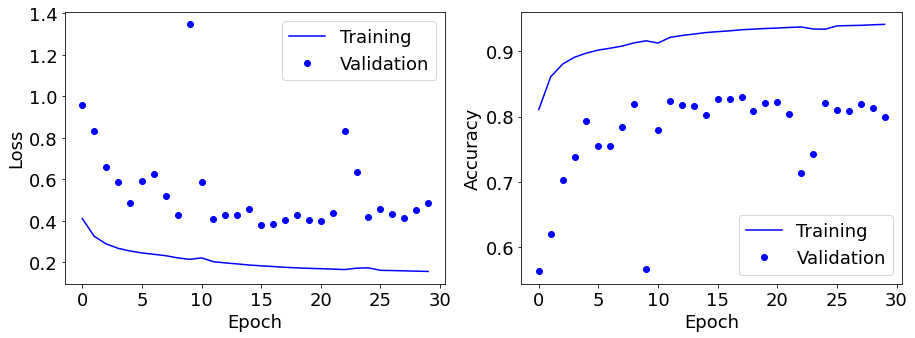

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


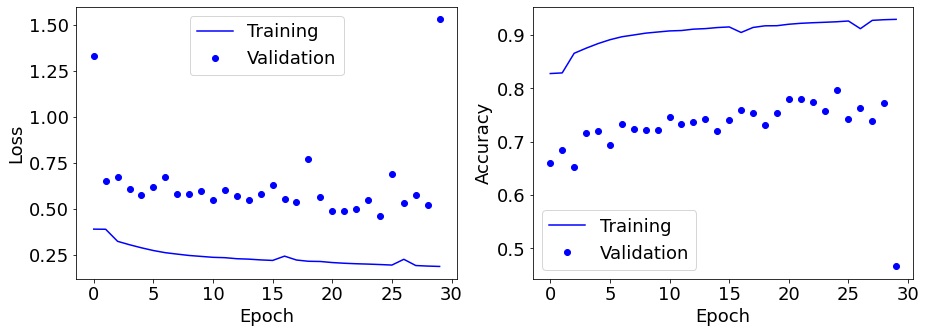

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


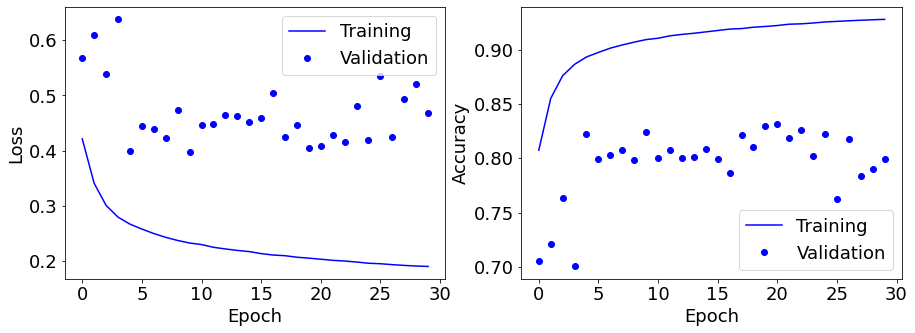

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


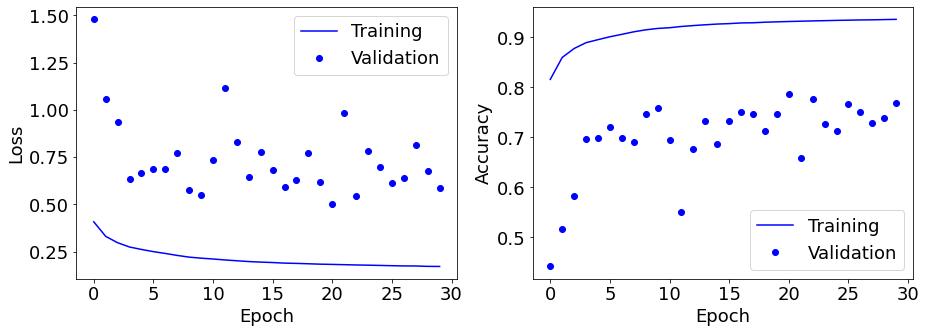

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


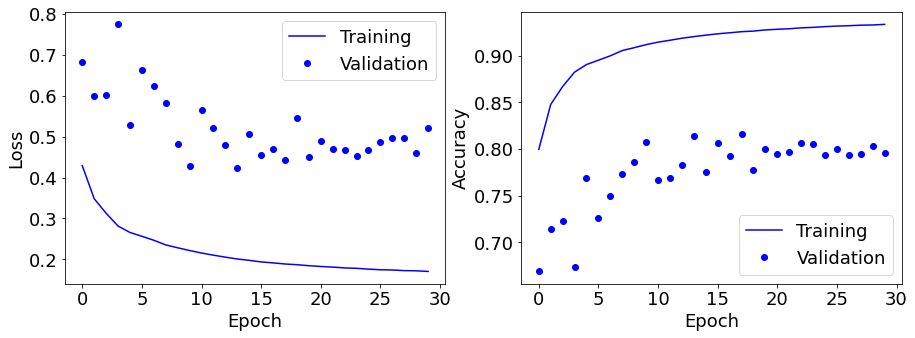

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


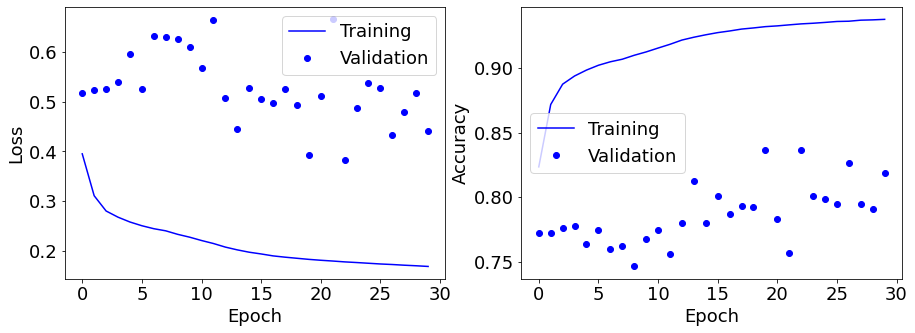

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


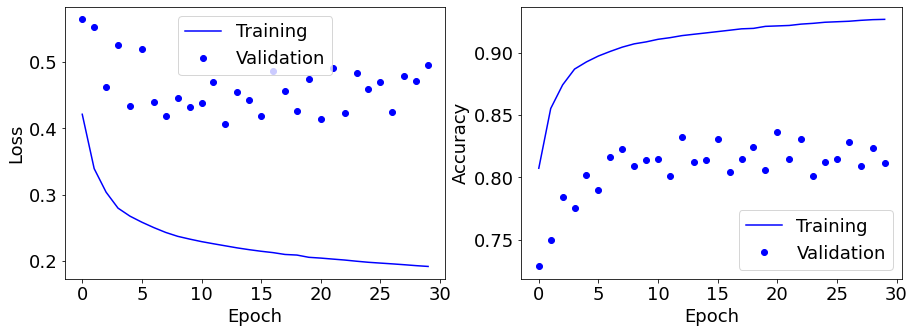

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


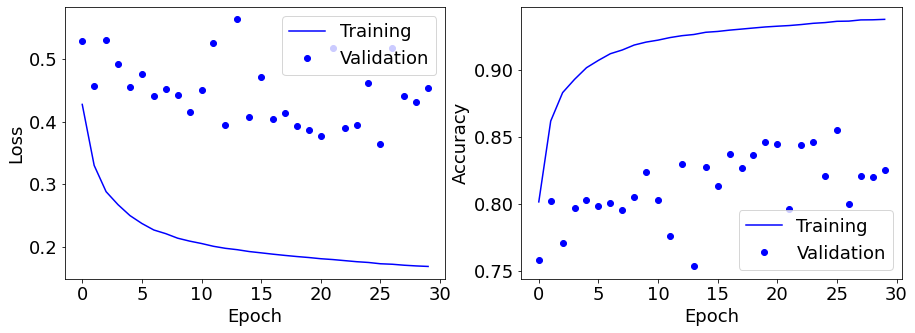

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


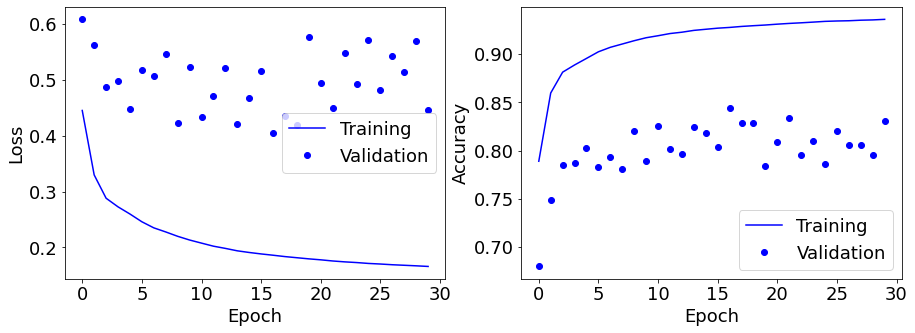

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


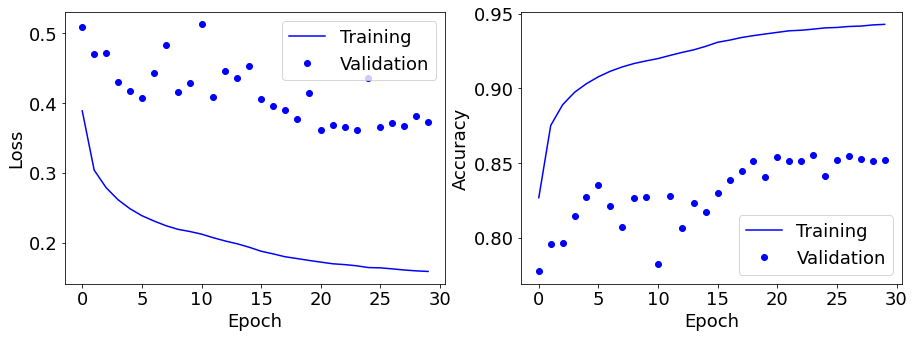

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


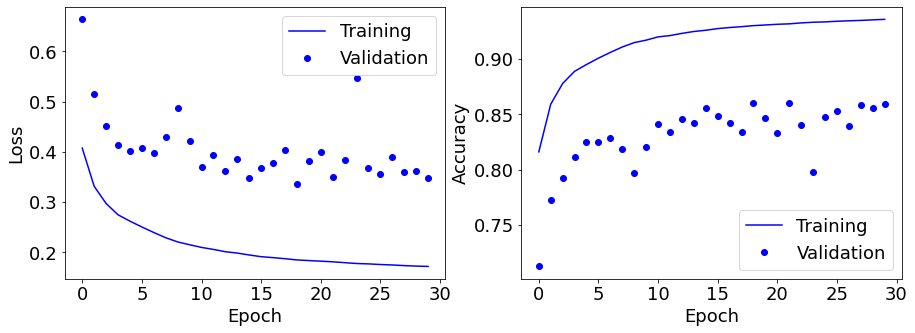

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


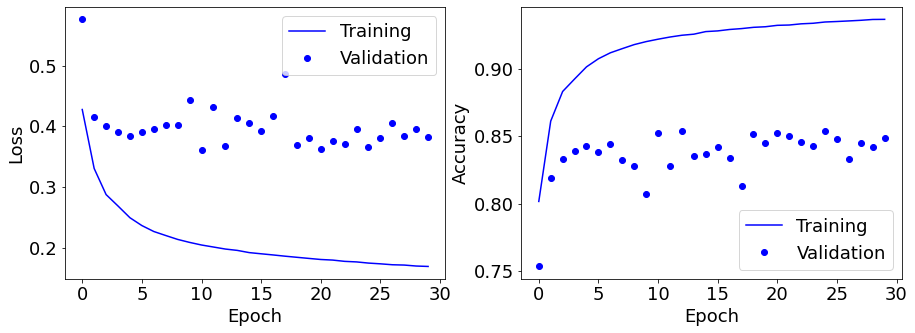

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


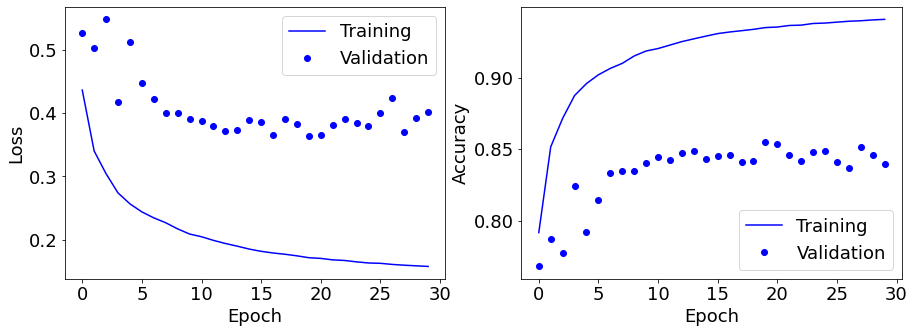

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


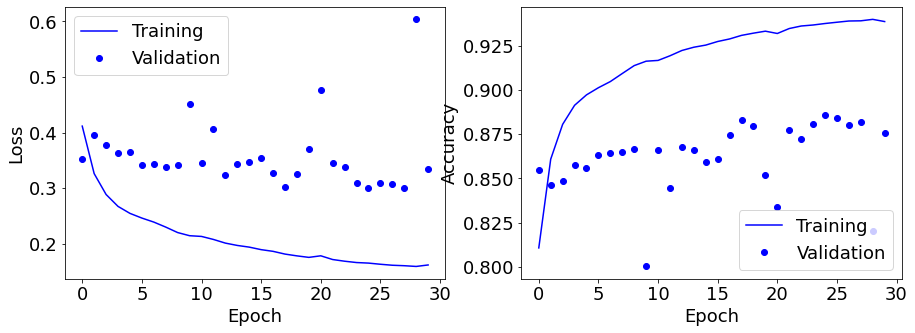

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


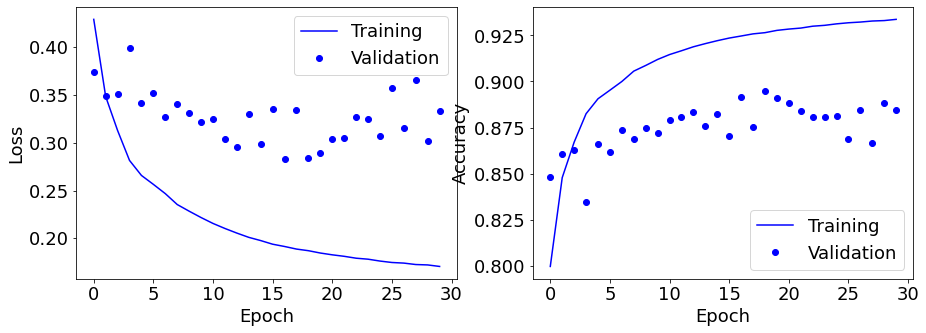

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


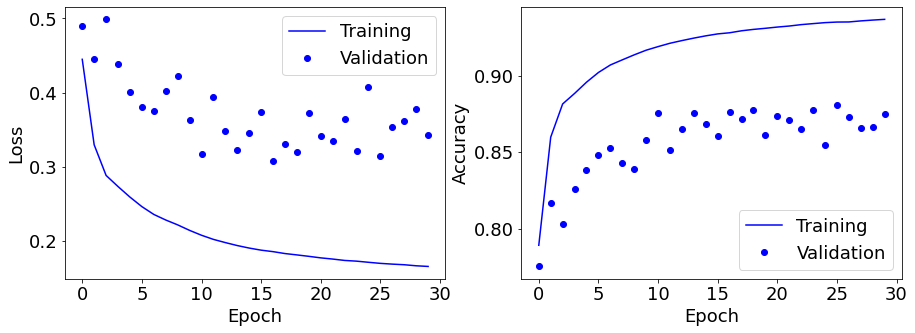

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
40


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


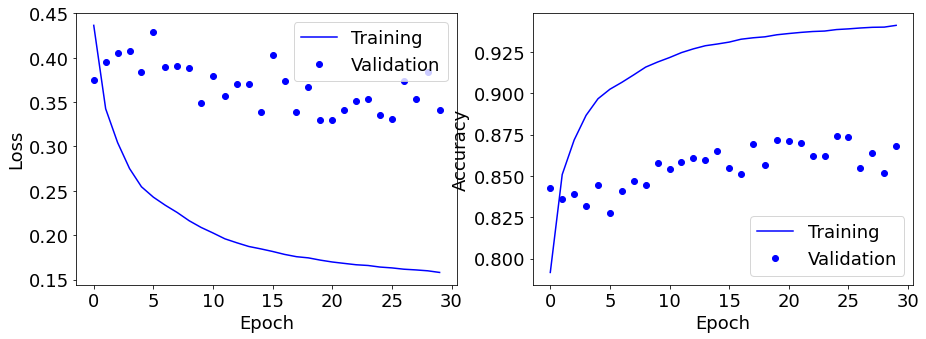

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


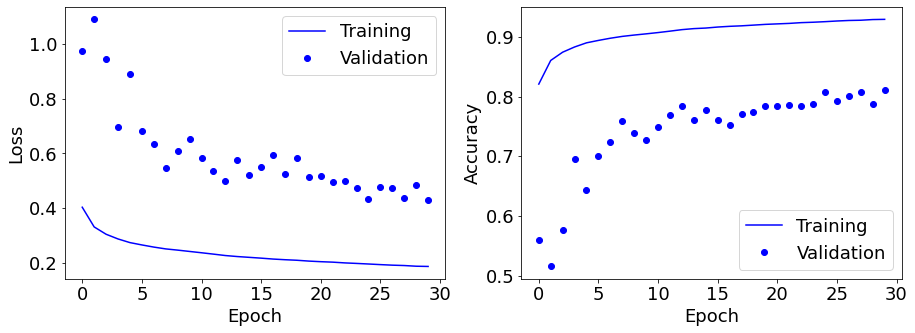

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


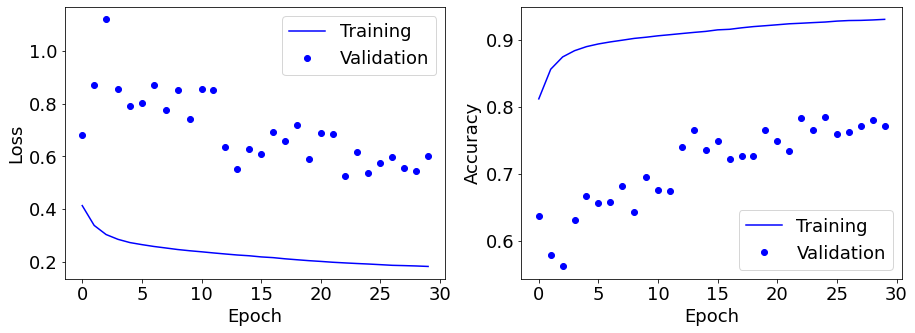

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


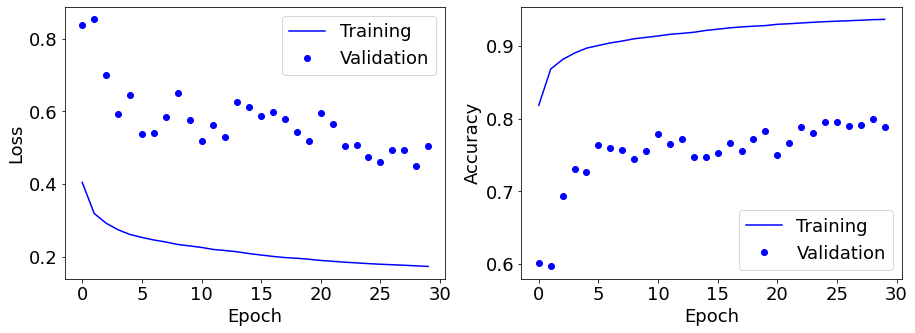

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


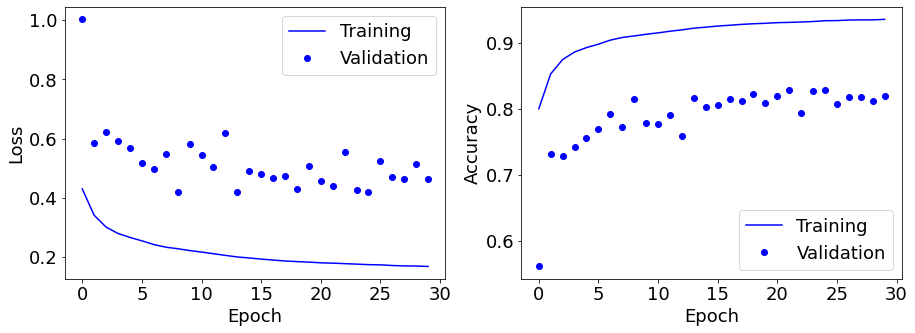

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


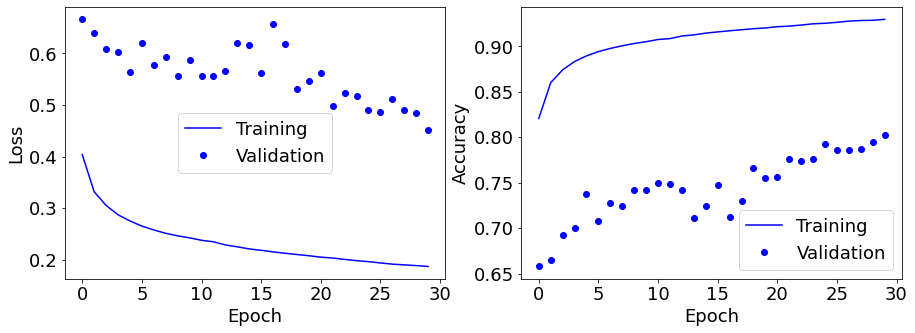

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


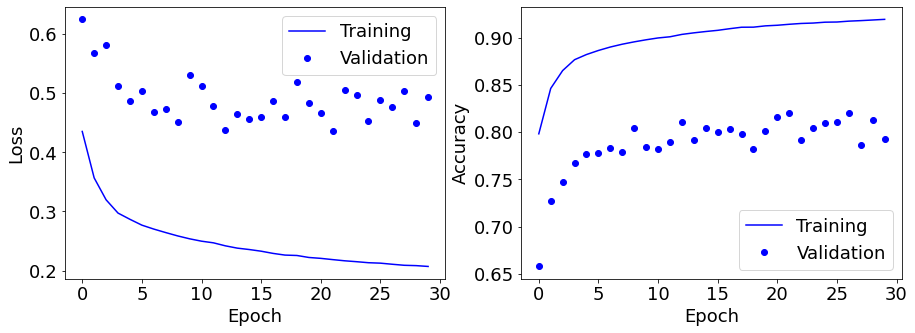

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


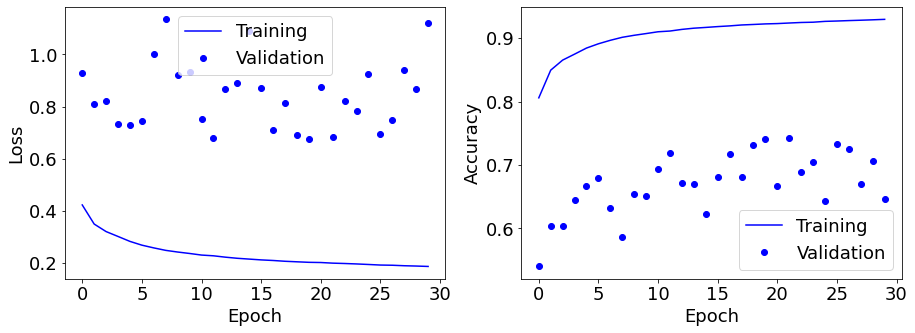

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


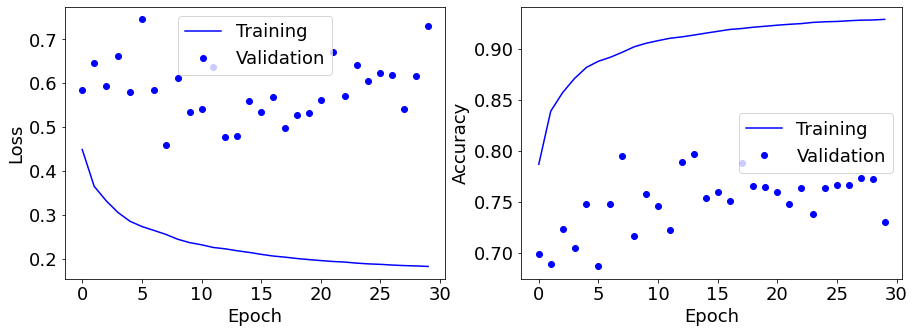

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


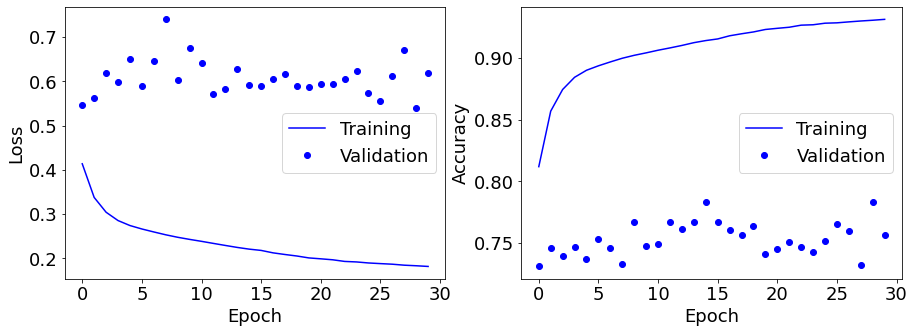

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


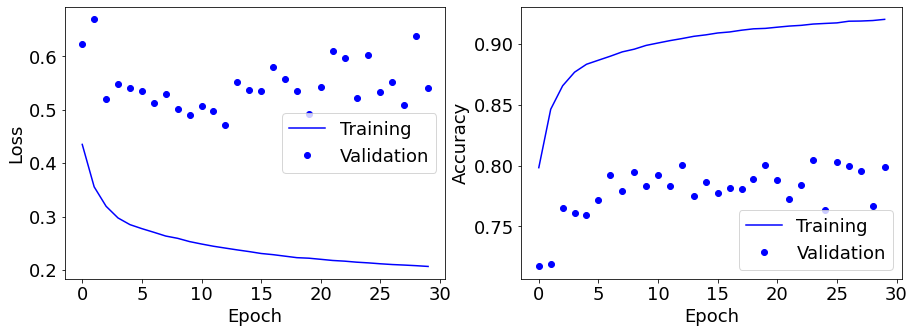

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


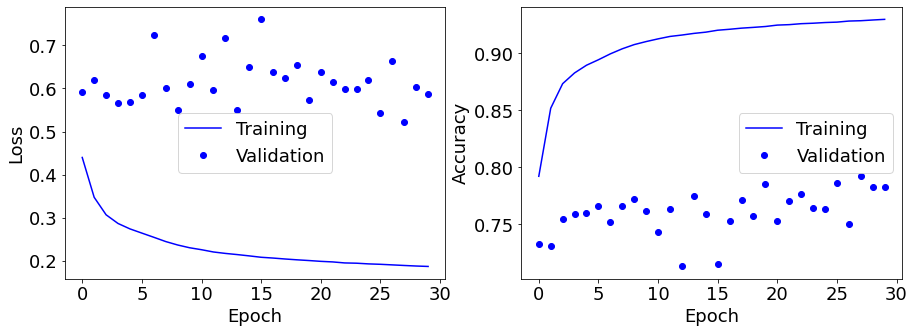

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


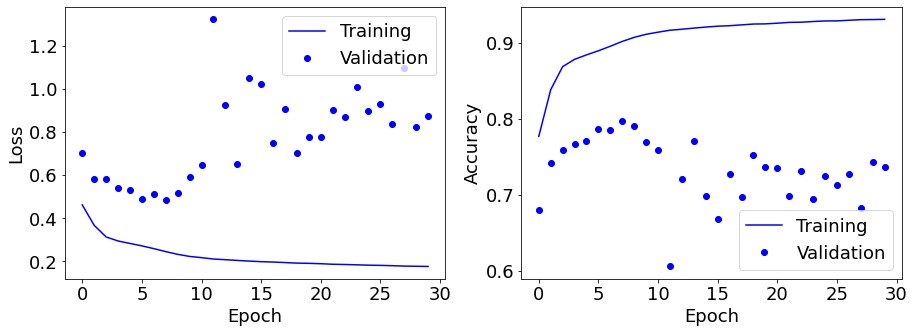

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


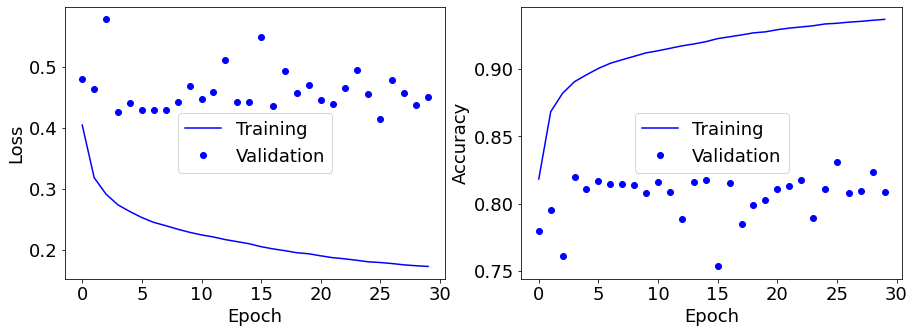

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


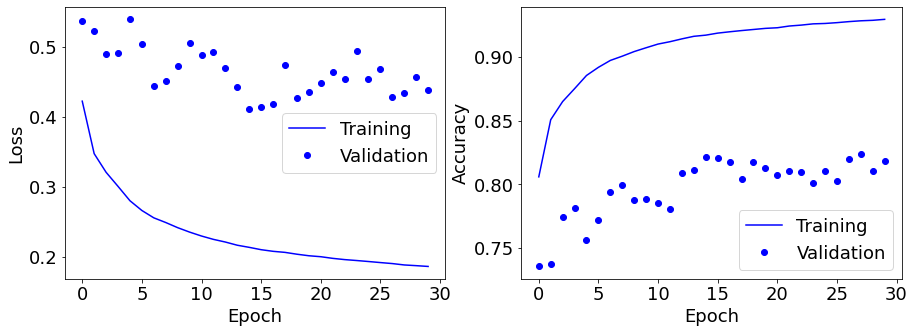

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


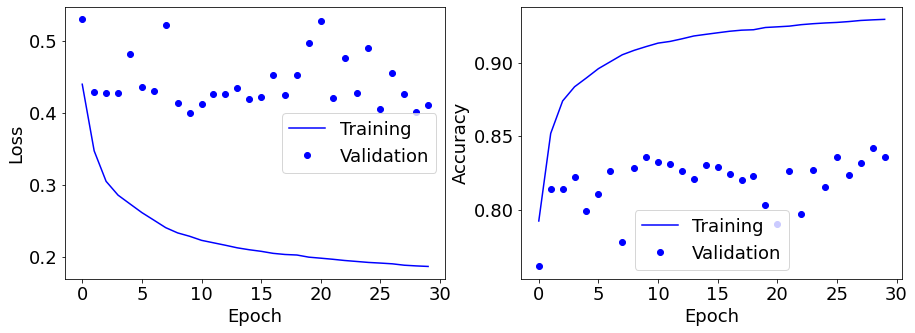

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


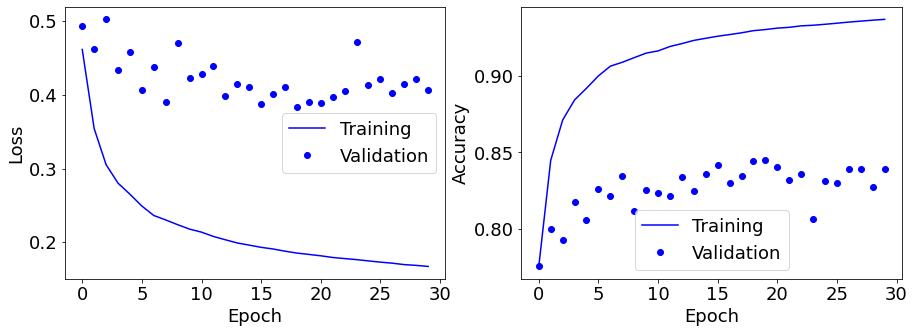

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


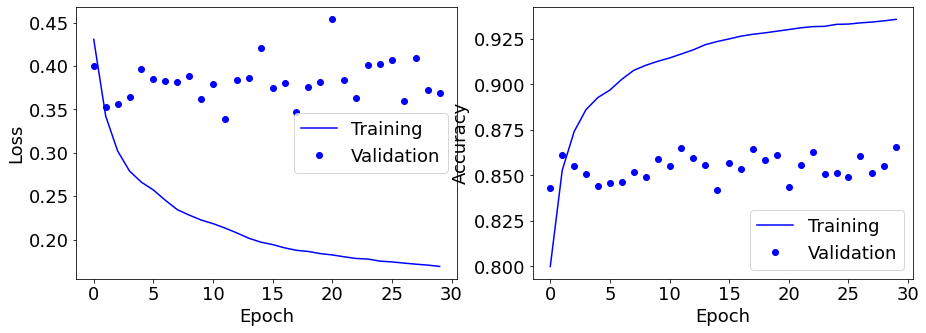

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


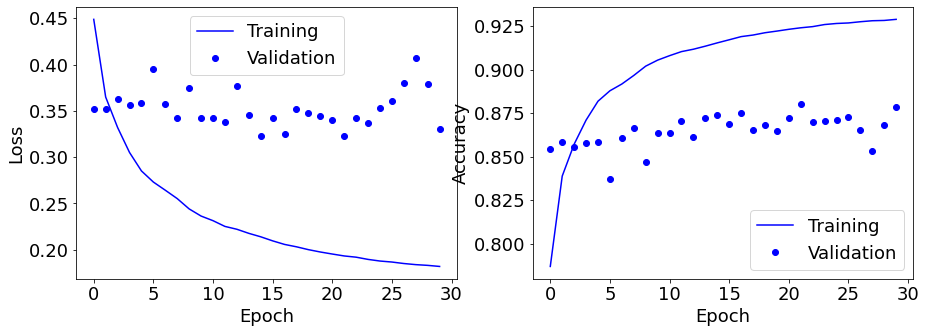

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


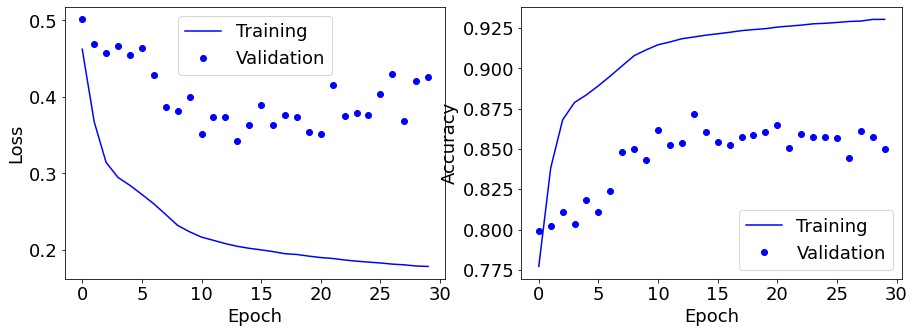

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
50


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


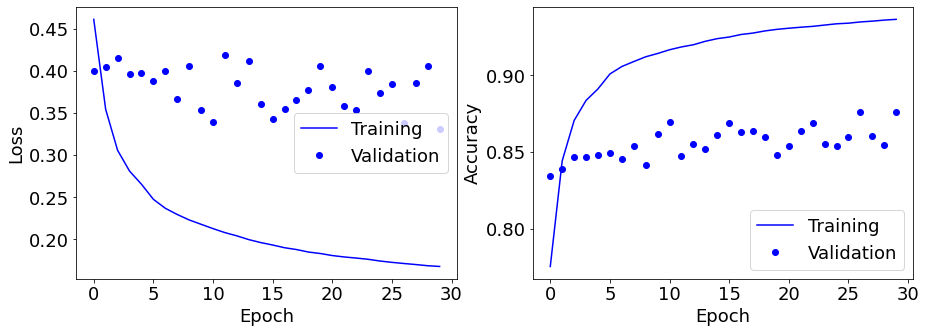

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 1
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


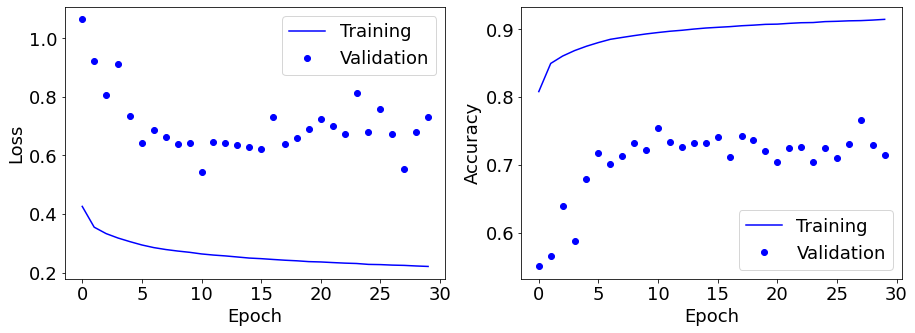

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 1
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


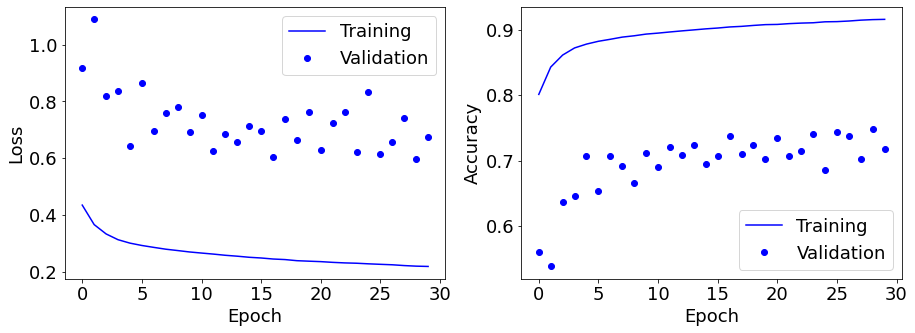

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 1
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


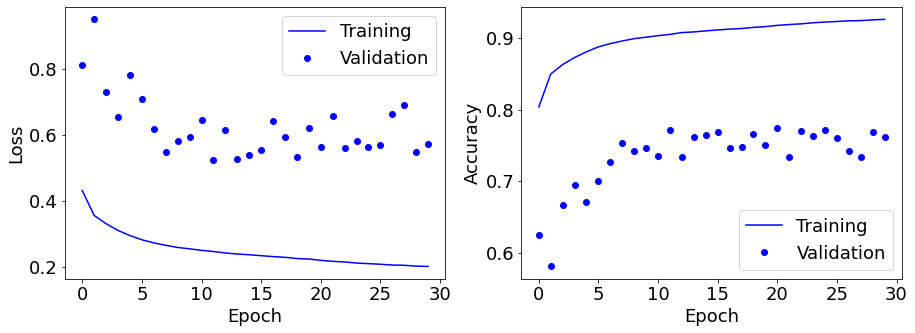

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 1
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


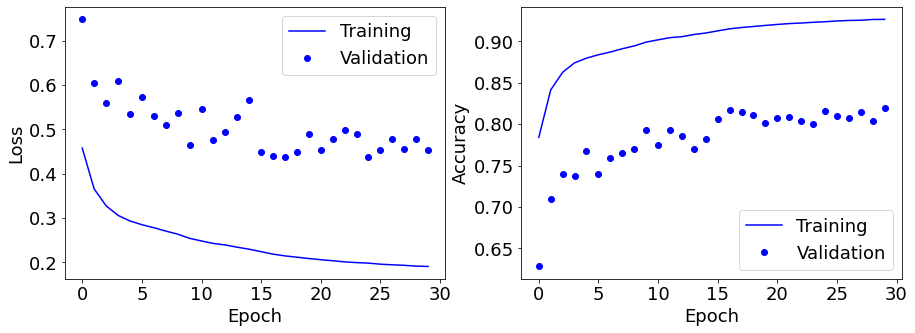

TRAINING
Mouse 3
Mouse 4
Mouse 5
VALIDATION
Mouse 2
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


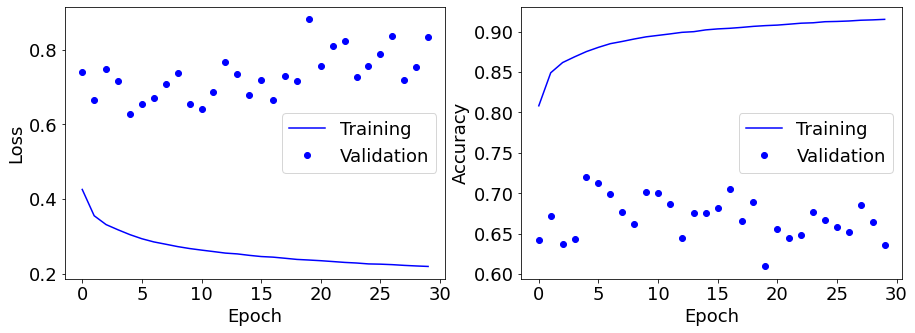

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 2
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


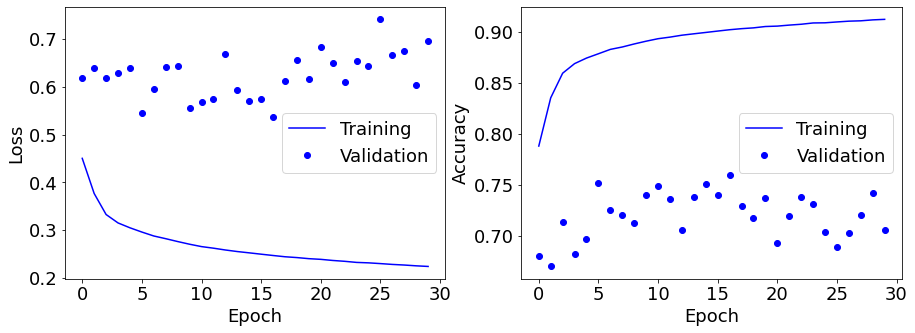

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 2
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


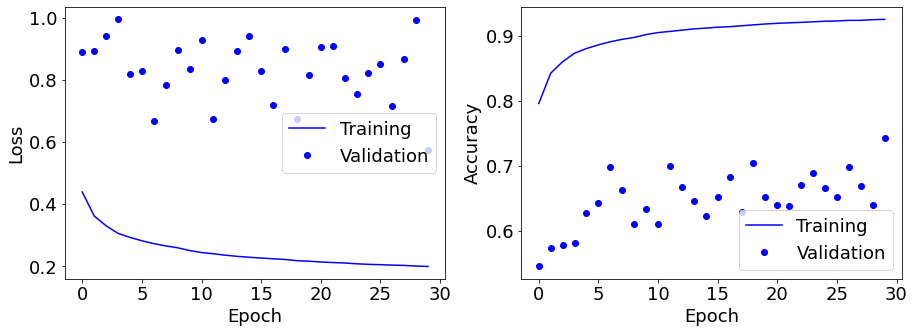

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 2
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


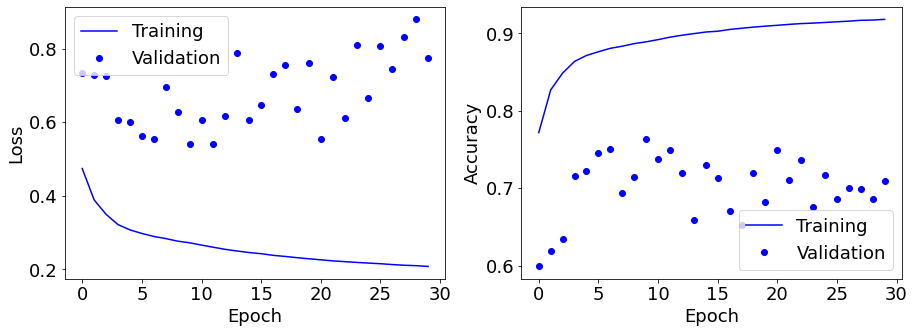

TRAINING
Mouse 2
Mouse 4
Mouse 5
VALIDATION
Mouse 3
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


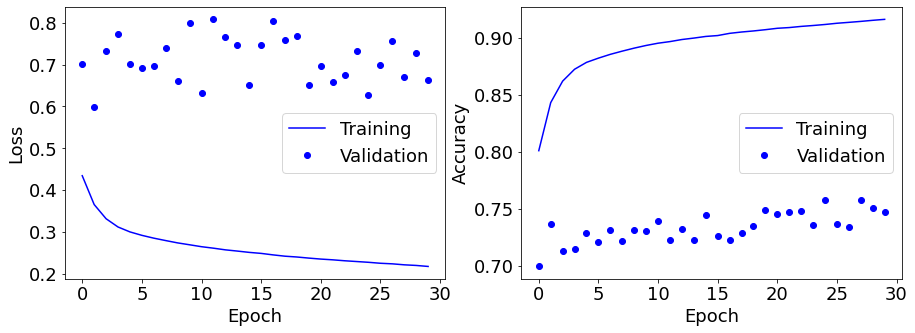

TRAINING
Mouse 1
Mouse 4
Mouse 5
VALIDATION
Mouse 3
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


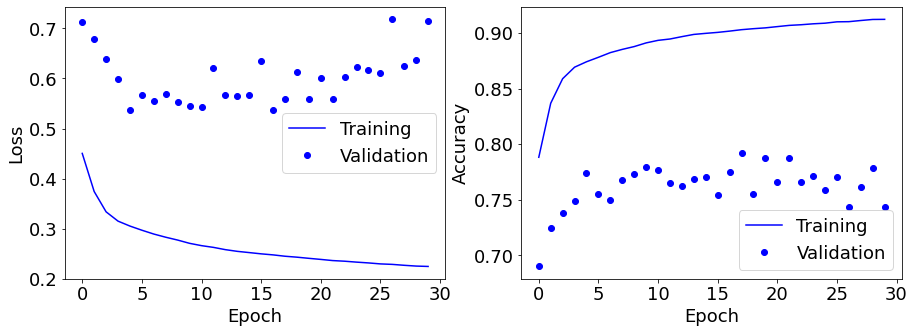

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 3
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


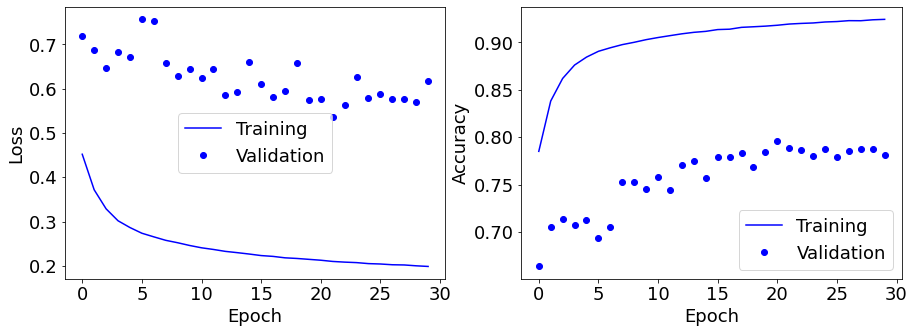

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 3
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


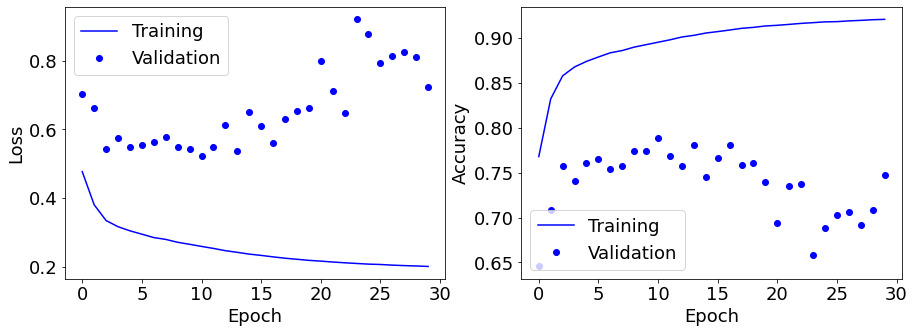

TRAINING
Mouse 2
Mouse 3
Mouse 5
VALIDATION
Mouse 4
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


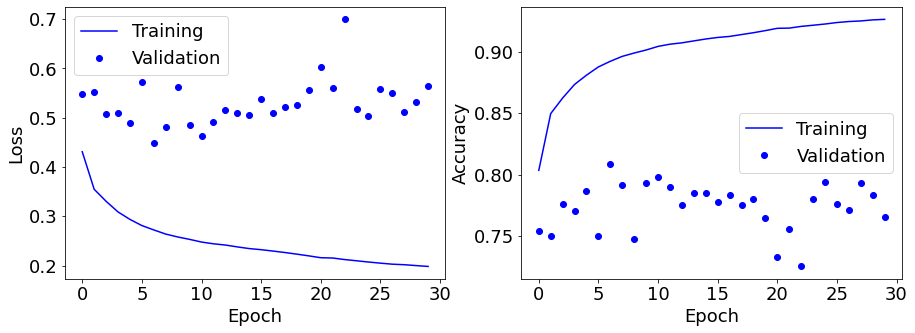

TRAINING
Mouse 1
Mouse 3
Mouse 5
VALIDATION
Mouse 4
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


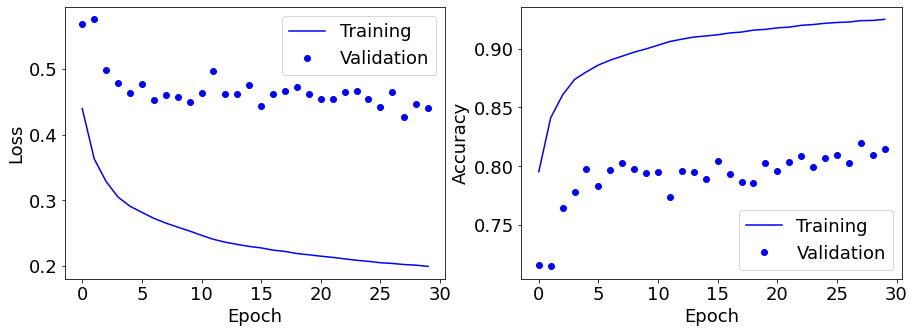

TRAINING
Mouse 1
Mouse 2
Mouse 5
VALIDATION
Mouse 4
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


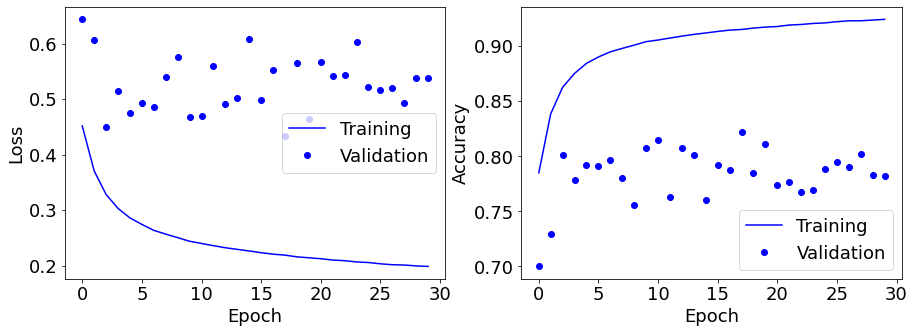

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 4
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


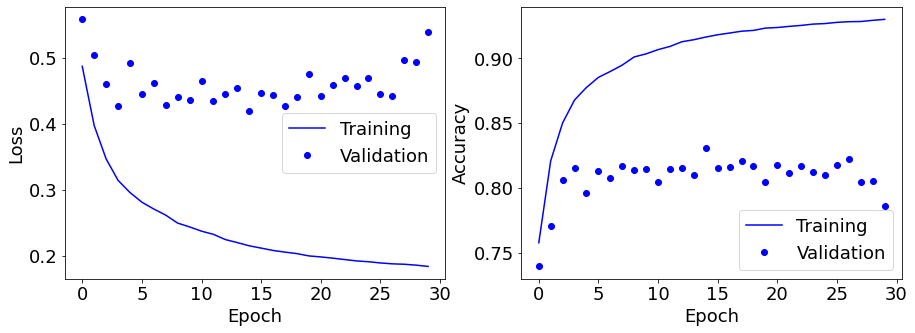

TRAINING
Mouse 2
Mouse 3
Mouse 4
VALIDATION
Mouse 5
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


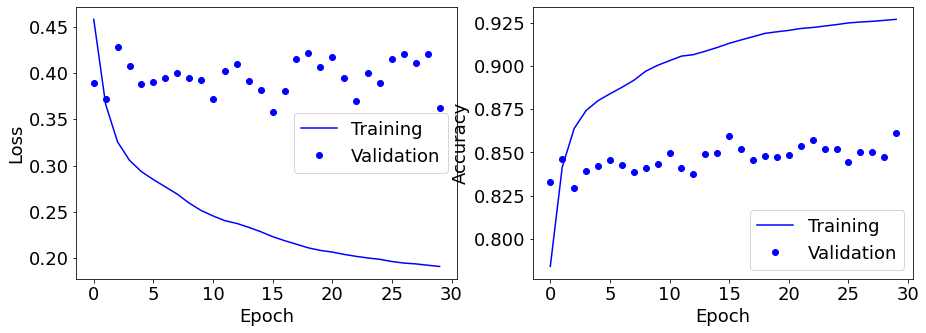

TRAINING
Mouse 1
Mouse 3
Mouse 4
VALIDATION
Mouse 5
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


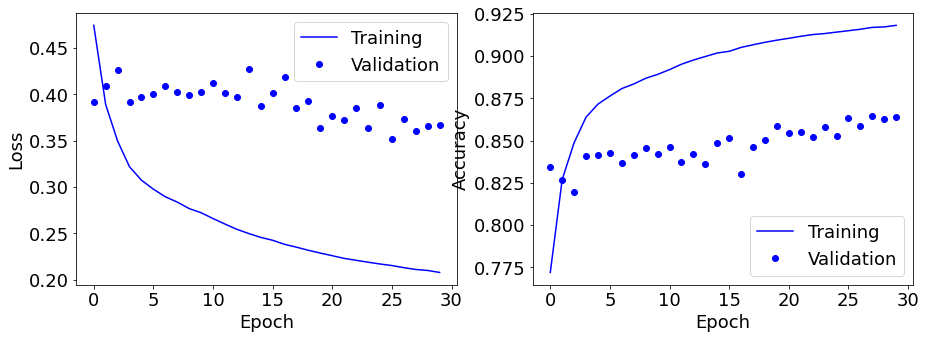

TRAINING
Mouse 1
Mouse 2
Mouse 4
VALIDATION
Mouse 5
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


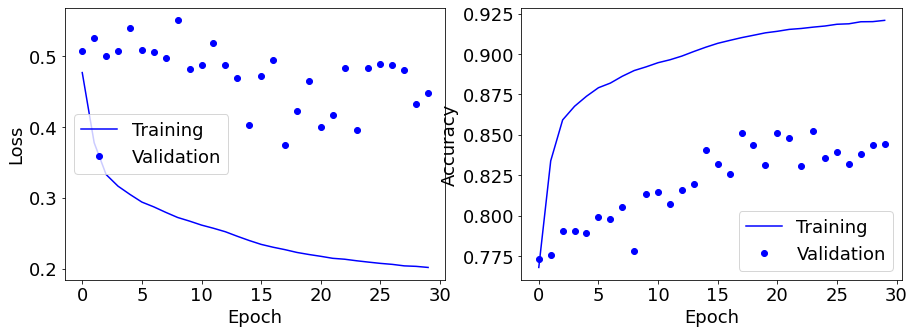

TRAINING
Mouse 1
Mouse 2
Mouse 3
VALIDATION
Mouse 5
60


TensorFlow version 1.15.0 has been patched using tfdeterminism version 0.3.0


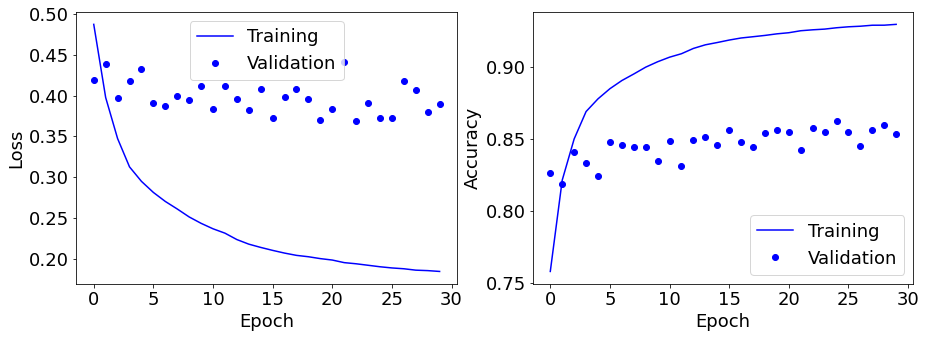

In [12]:
import itertools
l = [1, 2, 3, 4, 5]
for shift_frame in WinShift:
    for v in itertools.permutations(l, 2):
        TRAIN = [i for i in l if i not in v]
        VALID = [v[0]]
        TEST = [v[1]]
        trainX, validX, trainY, validY = Get_Dataset(TRAIN, VALID, shift_frame)
        print(shift_frame)
        ver = f'{ModelType}_{VALID}_{TEST}_shift{shift_frame}'
        history = Learn_model(trainX, validX, trainY, validY, ModelType, ver, folder)
        acc = history.history['acc']
        val_acc = history.history['val_acc']
        loss = history.history['loss']
        val_loss = history.history['val_loss']
        epochs = range(len(acc))
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
        ax[0].plot(epochs, loss, 'b', label='Training')
        ax[0].plot(epochs, val_loss, 'bo', label='Validation')
        ax[0].set(xlabel="Epoch")
        ax[0].set(ylabel="Loss")
        ax[0].legend()
        ax[1].plot(epochs, acc, 'b', label='Training')
        ax[1].plot(epochs, val_acc, 'bo', label='Validation')
        ax[1].set(xlabel="Epoch")
        ax[1].set(ylabel="Accuracy")
        ax[1].legend()
        plt.show()